debug code

In [2]:
import torch
from torch import nn
from PIL import Image
from torchvision.models.detection.ssd import SSD300_VGG16_Weights
from torchvision.models.detection.faster_rcnn import FasterRCNN_ResNet50_FPN_V2_Weights, FasterRCNN_ResNet50_FPN_Weights

from pathlib import Path

import shutil
import numpy as np
import matplotlib.lines as mlines
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import linear_sum_assignment
from sklearn import metrics
# import matplotlib.patches as patches
from copy import deepcopy
import skimage
from skimage.io import imread
import scipy
# import basicpy
from tqdm import tqdm
# import geopandas as gpd
import torchmetrics
import torchmetrics.detection

# import models.image_datamodule
# import models.embeddings_datamodule
# from util.box_ops_numpy import mask_to_boxes, cxcywh_to_xyxy, xyxy_to_cxcywh, plot_boxes
# from util import dataloading as dl
# from util import postprocessing as pp
# # from util.cellsam import CellSAM
# from util.umamba import Umamba
# # from SSD_model import SSD
# # from util.samos import SAMOS
# # from util.ssd import SSDPredictor
# # from util.FasterRCNN import FasterRCNNPredictor
# # from util.cellpose import Cellpose
# from util.orgasegment import PredictorFromMasks
# from util.gt_sam import GroundTruthSAM
# from util.pred_with_sam import PredictionSAM

%load_ext autoreload
%autoreload 2

In [ ]:
checkpoint_path = list(Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained_miccai/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_True_16_400_2026').glob('DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_True_16_400_2026-last.ckpt'))[0]
print(checkpoint_path)

new_checkpoint_path = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained_miccai/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_version_2_True_16_400_2026/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_version_2_True_16_400_2026-last.ckpt')
print(new_checkpoint_path)
# new_checkpoint_path.parent.mkdir()
# shutil.copy(checkpoint_path, new_checkpoint_path)

/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained_miccai/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_True_16_400_2026/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_True_16_400_2026-last.ckpt
/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained_miccai/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_version_2_True_16_400_2026/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_version_2_True_16_400_2026-last.ckpt


PosixPath('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained_miccai/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_version_2_True_16_400_2026/DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_version_2_True_16_400_2026-last.ckpt')

## Paper figures

In [2]:
base_datadir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/original_data/')
results_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/results')


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax, color='red'):
    y_min, x_min, y_max, x_max = box
    
    # Calculate width and height of the box
    width = x_max - x_min
    height = y_max - y_min

    ax.add_patch(plt.Rectangle((x_min, y_min), width, height, edgecolor=color, facecolor=(0,0,0,0), lw=2))

def show_mask(contour, ax, random_color=False):
    if random_color:
        color = np.random.random(3)
    else:
        color = np.array([30/255, 184/255, 255/255])
    edgecolor = np.concatenate([color, np.array([1.0])], axis=0)
    facecolor = np.concatenate([color, np.array([0.4])], axis=0)

    contour = gpd.GeoSeries(contour)
    contour.plot(edgecolor=edgecolor, facecolor=facecolor, ax=ax)

def visualize(im, contours, boxes, random_color=True, box_color='red', format='yxyx_px', ax=None, **fig_kwargs):
    # Format boxes
    H, W = im.shape[:2]

    if format=='cycxhw_01':
        # boxes are in cycxhw format normalized by the longest image side. Converts to min/max coordinates in pixels.
        original_boxes = cxcywh_to_xyxy(boxes) * max(H, W)
    elif format=='cycxhw_px':
        # boxes are in cycxhw format in pixels. Converts to min/max coordinates in pixels.
        original_boxes = cxcywh_to_xyxy(boxes)
    elif format=='yxyx_01':
        # boxes are in min/max coordinates normalized by the longest image side. Converts to min/max coordinates in pixels.
        original_boxes = boxes * max(H, W)
    elif format=='yxyx_px':
        # boxes are in min/max coordinates in pixels. No conversion necessary.
        original_boxes = boxes
    else:
        raise ValueError(format)

    if ax is None:
        fig, ax = plt.subplots(1, 1, **fig_kwargs)
    
    ax.imshow(im)
    ax.axis(False)
    for i in range(original_boxes.shape[0]):
        show_mask(contours[i], ax, random_color=random_color)
        show_box(original_boxes[i], ax, color=box_color)

In [3]:
results_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/results_paper')
results_dir.mkdir(exist_ok=True)

In [69]:
import matplotlib as mpl

width = 6  # inches
mpl.rcParams['figure.dpi'] = 200
# mpl.rcParams['lines.linewidth'] = 2
# mpl.rcParams['lines.linestyle'] = '--'

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
# i = 10
# plot_boxes(im, gt_boxes[i:i+1], format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_cellpose, format='yxyx_px', ax=ax, show_image=False, color='red')

# Plot mask predictions
for i in range(boxes_cellpose.shape[0]):
    show_mask(contours_cellpose[i], ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_c = mlines.Line2D([], [], color='red', label='SSD', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_c])

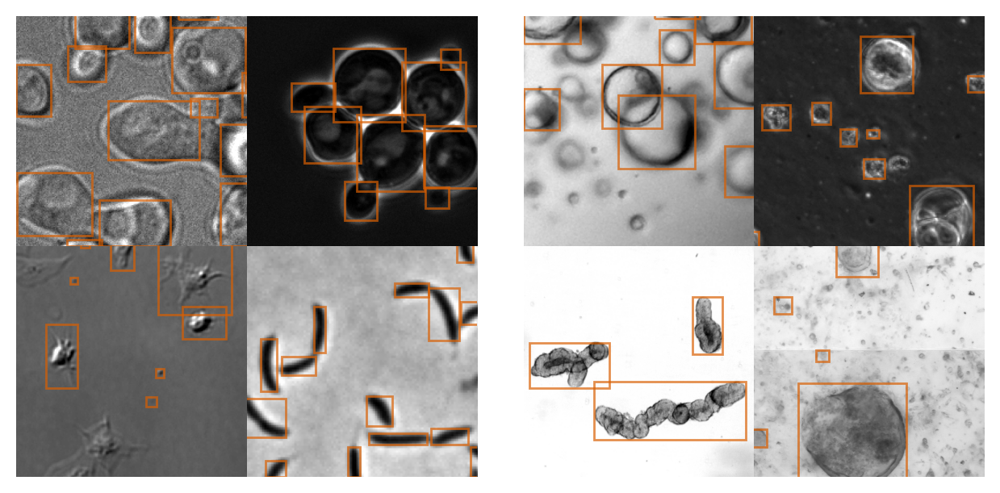

In [297]:
fig, ax = plt.subplots(2, 4, figsize=(width, 2/4.2 * width))

ds = dl.NeurIPSCellSeg('train')

im, gt_mask, gt_boxes, im_path, im_ID = ds[321]  # 300, 321, 420, 521, 527
im, flatfield = dl.normalize(im, correct_bg=False)

color = '#d95f02'

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[0, 0], color=color, show_image=True, linewidth=1)
ax[0, 0].set_xlim(0, 200)
ax[0, 0].set_ylim(0, 200)
ax[0, 0].axis('off')
ax[0, 0].set_position((0, 0.5, 5/21, 0.5))

im, gt_mask, gt_boxes, im_path, im_ID = ds[420]  # 300, 321, 420, 521, 527
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[1, 0], color=color, show_image=True, linewidth=1)
ax[1, 0].set_xlim(250, 450)
ax[1, 0].set_ylim(220, 420)
ax[1, 0].axis('off')
ax[1, 0].set_position((0, 0, 5/21, 0.5))

im, gt_mask, gt_boxes, im_path, im_ID = ds[521]
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[0, 1], color=color, show_image=True, linewidth=1)
ax[0, 1].set_xlim(450, 700)
ax[0, 1].set_ylim(20, 270)
ax[0, 1].axis('off')
ax[0, 1].set_position((5/21, 0.5, 5/21, 0.5))

im, gt_mask, gt_boxes, im_path, im_ID = ds[527]
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[1, 1], color=color, show_image=True, linewidth=1)
ax[1, 1].set_xlim(50, 150)
ax[1, 1].set_ylim(0, 100)
ax[1, 1].axis('off')
ax[1, 1].set_position((5/21, 0, 5/21, 0.5))


ds = dl.OrgaQuant('test')

im, gt_mask, gt_boxes, im_path, im_ID = ds[34]
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[0, 2], color=color, show_image=True, linewidth=1)
ax[0, 2].set_xlim(0, 250)
ax[0, 2].set_ylim(50, 300)
ax[0, 2].axis('off')
ax[0, 2].set_position((11/21, 0.5, 5/21, 0.5))

ds = dl.OrganoID('test_only_mouse')

im, gt_mask, gt_boxes, im_path, im_ID = ds[0]
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[1, 2], color=color, show_image=True, linewidth=1)
ax[1, 2].set_xlim(700, 1700)
ax[1, 2].set_ylim(600, 1600)
ax[1, 2].axis('off')
ax[1, 2].set_position((11/21, 0, 5/21, 0.5))



ds = dl.OrganoID('test')
# ds = dl.NewData('all')

im, gt_mask, gt_boxes, im_path, im_ID = ds[0]  # 2, 5, 
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[0, 3], color=color, show_image=True, linewidth=1)
ax[0, 3].set_xlim(500, 700)
ax[0, 3].set_ylim(450, 650)
ax[0, 3].axis('off')
ax[0, 3].set_position((16/21, 0.5, 5/21, 0.5))

ds = dl.MultiOrg('test_macros')

im, gt_mask, gt_boxes, im_path, im_ID = ds[5]
im, flatfield = dl.normalize(im, correct_bg=False)

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax[1, 3], color=color, show_image=True, linewidth=1)
ax[1, 3].set_xlim(3000, 3800)
ax[1, 3].set_ylim(600, 1400)
ax[1, 3].axis('off')
ax[1, 3].set_position((16/21, 0, 5/21, 0.5))

plt.savefig(results_dir / 'distribution_shift.png', dpi=400)
plt.savefig(results_dir / 'distribution_shift.pdf', dpi=400)

#### Debug resnet50 backbone architecture

In [ ]:
# FRCNN
print({k: v.shape for k, v in features.items()})

{'0': torch.Size([1, 256, 256, 256]), '1': torch.Size([1, 256, 128, 128]), '2': torch.Size([1, 256, 64, 64]), '3': torch.Size([1, 256, 32, 32]), 'pool': torch.Size([1, 256, 16, 16])}


In [ ]:
backbone([im], [targets])

{'loss_classifier': metatensor(4.4790, grad_fn=<AliasBackward0>),
 'loss_box_reg': metatensor(0.0001, grad_fn=<AliasBackward0>),
 'loss_objectness': metatensor(0.6817, grad_fn=<AliasBackward0>),
 'loss_rpn_box_reg': metatensor(0.0031, grad_fn=<AliasBackward0>)}

### Metric evaluations

##### copy filenames to correct locations

In [3]:
# cellpose_models = [
#     # 'cellpose_diam_[None]',
#     # 'cellpose_diam_[30]',
#     # 'cellpose_diam_[100]',
#     # 'cellpose_diam_[300]',
#     # 'cellpose_diam_[100,300]',
#     'SSD_objects_2024_sam1',
#     'SSD_objects_2025_sam1',
# ]
# for model_name in cellpose_models:
#     (results_dir / model_name).mkdir(exist_ok=True)

# for file in (results_dir).glob('*.csv'):
#     print(file)

#     # Get current model name
#     curr_model_name = None
#     for model_name in cellpose_models:
#         if file.name.startswith(model_name):
#             curr_model_name = model_name
#             break

#     # Define output file patch
#     outfile = results_dir / curr_model_name / file.name.replace(f'{curr_model_name}_', '', 1)
#     print(outfile)
#     assert not outfile.exists(), outfile
#     # shutil.move(file, outfile)


##### Evaluate SAM & SAM2 segmentation performance depending on the box noise  

/tmp/ipykernel_36656/3475335262.py:48: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i].legend()


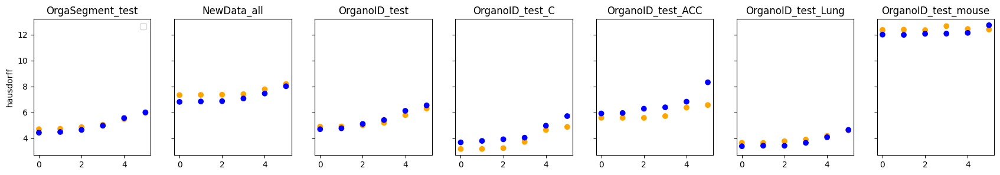

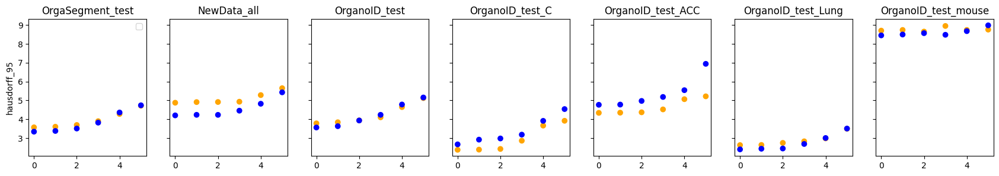

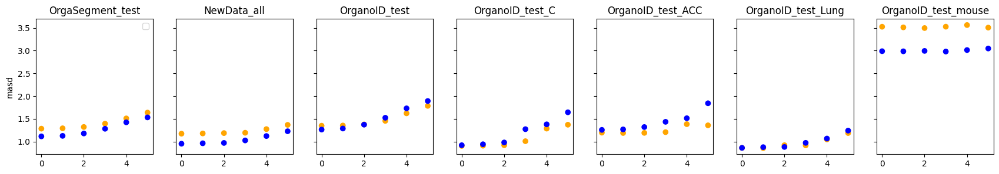

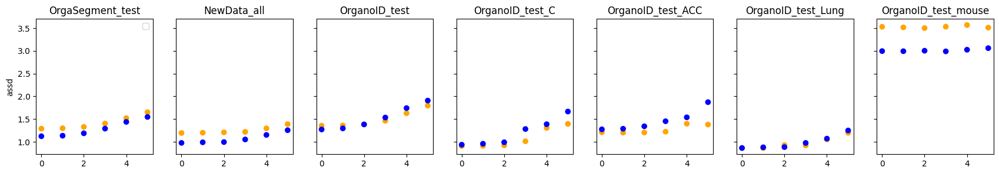

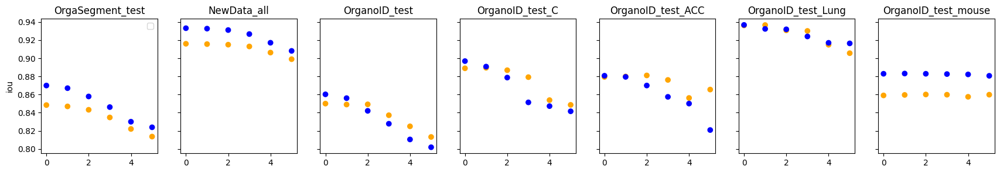

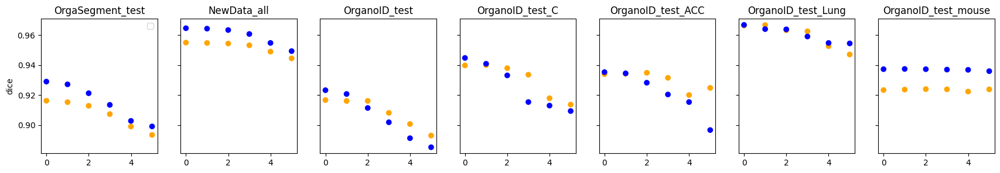

In [ ]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
# sam_version = 'sam1'
iou_thres = 0.5

datasets = ["OrgaSegment_test", "NewData_all", "OrganoID_test", "OrganoID_test_C", "OrganoID_test_ACC", "OrganoID_test_Lung", "OrganoID_test_mouse"]
metrics = [
    ('hausdorff_scores', 'hausdorff'), 
    ('hausdorff_95_scores', 'hausdorff_95'), 
    ('masd_scores', 'masd'), 
    ('assd_scores', 'assd'), 
    ('iou_scores_no_thres', 'iou'), 
    ('dice_scores_no_thres', 'dice')
]


results = []
columns = ['dataset', 'sd', 'bias', 'color'] + [name for m, name in metrics]
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for std in [0, 1, 2, 3, 4, 5]:
        bias = False
        for color, sam_version in zip(['orange', 'blue'], ['sam1', 'sam2']):
            metrics_df = pd.read_csv(results_dir / f'gt_{sam_version}_sd_{std}_bias_{std if bias else 0}' / f'mean_segmentation_AP_{dataset}.csv')

            data = [dataset, std, bias, color]
            for i, (metric, metric_name) in enumerate(metrics):
                v = metrics_df[metrics_df['iou_thres']==iou_thres][metric].item()
                data.append(v)
            results.append(data)

results = pd.DataFrame(data=results, columns=columns)

for _, metric_name in metrics:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        ax[i].set_title(dataset)
        ax[i].scatter(df['sd'].values.flatten(), 
                      df[metric_name].values.flatten(), 
                      c=df['color'].values.flatten())

        if i==0:
            ax[i].legend()


##### Evaluate match different box noise patterns with detection metrics on different datasets  

##### Compare segmentation performance of zeroshot methods + SAM with different noise levels 

(which noise level outperforms the best zeroshot method?) 

In [3]:
results_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/results')

/tmp/ipykernel_4153853/4203424950.py:155: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i].legend()


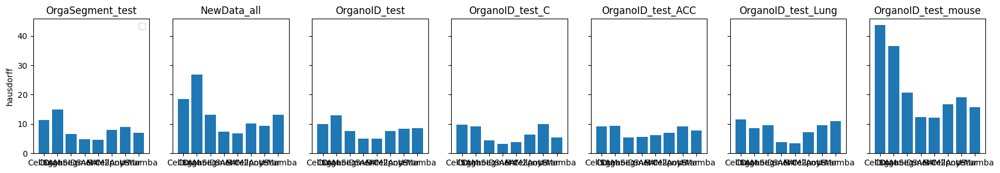

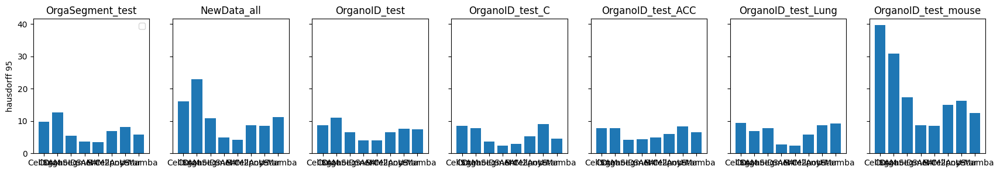

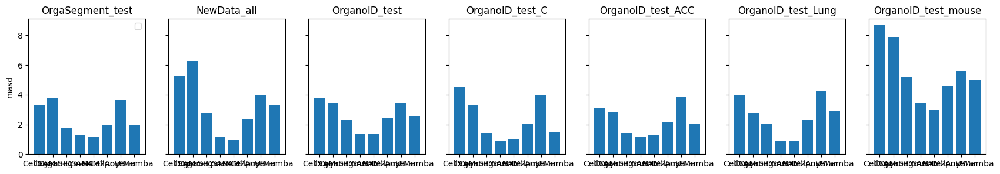

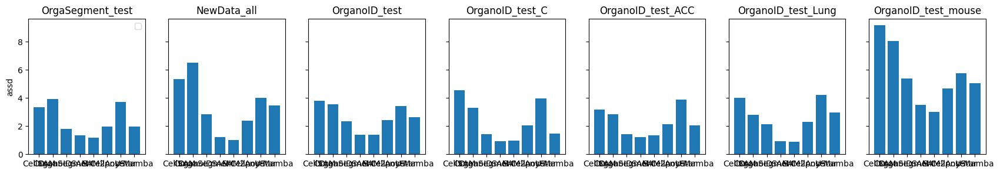

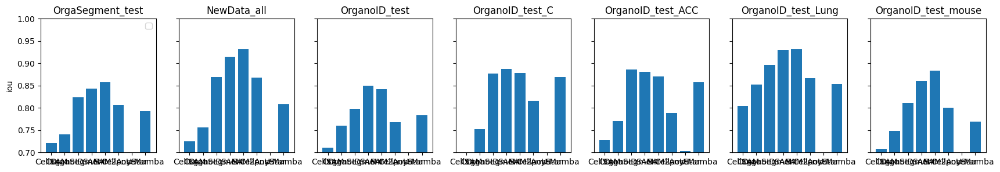

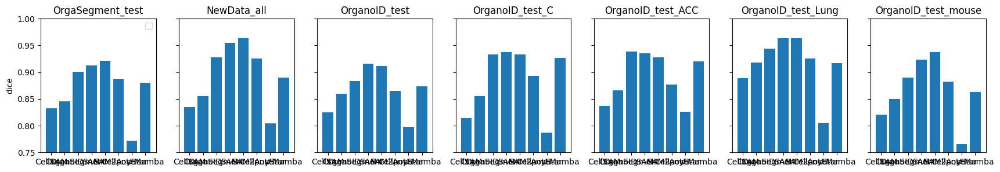

In [45]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5


datasets = [
    "OrgaSegment_test", 
    "NewData_all", 
    "OrganoID_test", 
    "OrganoID_test_C", 
    "OrganoID_test_ACC", 
    "OrganoID_test_Lung", 
    "OrganoID_test_mouse"
]

ds2name = {
    "OrgaSegment_test": "OrgaSegment", 
    "NewData_all": "Ours", 
    "OrganoID_test": "PDAC", 
    "OrganoID_test_C": "Colon", 
    "OrganoID_test_ACC": "ACC", 
    "OrganoID_test_Lung": "Lung", 
    "OrganoID_test_mouse": "Mouse"
}


metrics = [
    ('hausdorff_scores', 'hausdorff'), 
    ('hausdorff_95_scores', 'hausdorff 95'), 
    ('masd_scores', 'masd'), 
    ('assd_scores', 'assd'), 
    ('iou_scores_no_thres', 'iou'), 
    ('dice_scores_no_thres', 'dice')
]


results = []
columns = ['dataset', 'model'] + [name for m, name in metrics]
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in [# 'gt_sam1_sd_0_bias_0',
                #   'gt_sam2_sd_0_bias_0',
                  'AnyStar_20',
                  'AnyStar_10',
                  'AnyStar_5',
                  'AnyStar_all',
                  'cellsam',
                  'umamba_bot',
                  'umamba_enc',
                  'OrganoID',
                  'OrgaSegment',
                  'gt_sam1_sd_2_bias_0',
                  'gt_sam2_sd_2_bias_0',
                  'cellpose_diam_[None]',
                  'cellpose_diam_[30]',
                  'cellpose_diam_[100]',
                  'cellpose_diam_[300]',
                  'cellpose_diam_[100,300]',]:
        metrics_df = pd.read_csv(results_dir / model / f'mean_segmentation_AP_{dataset}.csv')

        data = [dataset, model.replace('gt_sam1_sd_2_bias_0', 'SAM').replace('gt_sam2_sd_2_bias_0', 'SAM2').replace('cellsam', 'CellSAM').replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
        for i, (metric, metric_name) in enumerate(metrics):
            v = metrics_df[metrics_df['iou_thres']==iou_thres][metric].item()
            data.append(v)
        results.append(data)

results = pd.DataFrame(data=results, columns=columns)

# Summarize best cellpose
cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('cellpose'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    hausdorff = pd.NamedAgg('hausdorff', 'min'),
    hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
    masd = pd.NamedAgg('masd', 'min'),
    assd = pd.NamedAgg('assd', 'min'),
    iou = pd.NamedAgg('iou', 'max'),
    dice = pd.NamedAgg('dice', 'max'),
).rename(columns={'hausdorff_95': 'hausdorff 95'})
cellpose_best['model'] = 'Cellpose'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)



# Summarize best AnyStar
cellpose_df = results[results.model.apply(lambda x: x.startswith('AnyStar'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('AnyStar'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    hausdorff = pd.NamedAgg('hausdorff', 'min'),
    hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
    masd = pd.NamedAgg('masd', 'min'),
    assd = pd.NamedAgg('assd', 'min'),
    iou = pd.NamedAgg('iou', 'max'),
    dice = pd.NamedAgg('dice', 'max'),
).rename(columns={'hausdorff_95': 'hausdorff 95'})
cellpose_best['model'] = 'AnyStar'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)




# Summarize best umamba
cellpose_df = results[results.model.apply(lambda x: x.startswith('umamba'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('umamba'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    hausdorff = pd.NamedAgg('hausdorff', 'min'),
    hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
    masd = pd.NamedAgg('masd', 'min'),
    assd = pd.NamedAgg('assd', 'min'),
    iou = pd.NamedAgg('iou', 'max'),
    dice = pd.NamedAgg('dice', 'max'),
).rename(columns={'hausdorff_95': 'hausdorff 95'})
cellpose_best['model'] = 'U-Mamba'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)


for _, metric_name in metrics:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
        ax[i].set_title(dataset)
        ax[i].bar(df['model'].values.flatten(), 
                  df[metric_name].values.flatten(),
                #   c=df['model'].values.flatten(),
                  )
        
        if metric_name in ['iou']:
            ax[i].set_ylim(0.7, 1)
        if metric_name in ['dice']:
            ax[i].set_ylim(0.75, 1)
        if i==0:
            ax[i].legend()

In [46]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='hausdorff'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2)

dataset,Ours,OrgaSegment,Mouse,ACC,Colon,Lung,PDAC
model,,,,,,,
AnyStar,9.38,9.06,19.03,9.19,9.97,9.57,8.47
CellSAM,18.55,11.26,43.63,9.20,9.75,11.55,10.00
Cellpose,10.18,8.04,16.67,7.04,6.31,7.19,7.52
OrgaSegment,13.08,6.70,20.68,5.39,4.46,9.61,7.62
OrganoID,26.86,14.85,36.47,9.29,9.19,8.59,12.95
SAM,7.37,4.85,12.36,5.57,3.23,3.77,5.00
SAM2,6.86,4.64,12.07,6.28,3.91,3.42,5.10
U-Mamba,13.12,6.97,15.63,7.86,5.38,10.87,8.64


In [47]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='iou'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2)

dataset,Ours,OrgaSegment,Mouse,ACC,Colon,Lung,PDAC
model,,,,,,,
AnyStar,0.68,0.63,0.62,0.70,0.65,0.68,0.67
CellSAM,0.72,0.72,0.71,0.73,0.69,0.80,0.71
Cellpose,0.87,0.81,0.80,0.79,0.82,0.87,0.77
OrgaSegment,0.87,0.82,0.81,0.89,0.88,0.90,0.80
OrganoID,0.76,0.74,0.75,0.77,0.75,0.85,0.76
SAM,0.92,0.84,0.86,0.88,0.89,0.93,0.85
SAM2,0.93,0.86,0.88,0.87,0.88,0.93,0.84
U-Mamba,0.81,0.79,0.77,0.86,0.87,0.85,0.78


In [48]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='hausdorff'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].to_latex(float_format="%.2f"))
# results.set_index(['dataset', 'model']).sort_index()

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 9.38 & 9.06 & 19.03 & 9.19 & 9.97 & 9.57 & 8.47 \\
CellSAM & 18.55 & 11.26 & 43.63 & 9.20 & 9.75 & 11.55 & 10.00 \\
Cellpose & 10.18 & 8.04 & 16.67 & 7.04 & 6.31 & 7.19 & 7.52 \\
OrgaSegment & 13.08 & 6.70 & 20.68 & 5.39 & 4.46 & 9.61 & 7.62 \\
OrganoID & 26.86 & 14.85 & 36.47 & 9.29 & 9.19 & 8.59 & 12.95 \\
SAM & 7.37 & 4.85 & 12.36 & 5.57 & 3.23 & 3.77 & 5.00 \\
SAM2 & 6.86 & 4.64 & 12.07 & 6.28 & 3.91 & 3.42 & 5.10 \\
U-Mamba & 13.12 & 6.97 & 15.63 & 7.86 & 5.38 & 10.87 & 8.64 \\
\bottomrule
\end{tabular}



In [49]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='masd'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))
# results.set_index(['dataset', 'model']).sort_index()

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 4.00 & 3.66 & 5.60 & 3.87 & 3.94 & 4.21 & 3.43 \\
CellSAM & 5.26 & 3.27 & 8.68 & 3.14 & 4.51 & 3.97 & 3.76 \\
Cellpose & 2.36 & 1.93 & 4.59 & 2.12 & 2.02 & 2.29 & 2.42 \\
OrgaSegment & 2.78 & 1.80 & 5.19 & 1.43 & 1.44 & 2.07 & 2.33 \\
OrganoID & 6.30 & 3.81 & 7.86 & 2.83 & 3.28 & 2.79 & 3.46 \\
SAM & 1.19 & 1.32 & 3.50 & 1.19 & 0.92 & 0.92 & 1.38 \\
SAM2 & 0.97 & 1.18 & 2.99 & 1.32 & 0.98 & 0.88 & 1.37 \\
U-Mamba & 3.31 & 1.95 & 5.04 & 2.04 & 1.45 & 2.91 & 2.58 \\
\bottomrule
\end{tabular}



In [50]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='iou'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.68 & 0.63 & 0.62 & 0.70 & 0.65 & 0.68 & 0.67 \\
CellSAM & 0.72 & 0.72 & 0.71 & 0.73 & 0.69 & 0.80 & 0.71 \\
Cellpose & 0.87 & 0.81 & 0.80 & 0.79 & 0.82 & 0.87 & 0.77 \\
OrgaSegment & 0.87 & 0.82 & 0.81 & 0.89 & 0.88 & 0.90 & 0.80 \\
OrganoID & 0.76 & 0.74 & 0.75 & 0.77 & 0.75 & 0.85 & 0.76 \\
SAM & 0.92 & 0.84 & 0.86 & 0.88 & 0.89 & 0.93 & 0.85 \\
SAM2 & 0.93 & 0.86 & 0.88 & 0.87 & 0.88 & 0.93 & 0.84 \\
U-Mamba & 0.81 & 0.79 & 0.77 & 0.86 & 0.87 & 0.85 & 0.78 \\
\bottomrule
\end{tabular}



##### Compare detection performance of zeroshot methods

gt_sam1_sd_2_bias_0 8
AnyStar_20 8
AnyStar_10 10
AnyStar_5 10
AnyStar_all 10
cellsam 8
umamba_bot 10
umamba_enc 8
OrganoID 10
OrgaSegment 8
cellpose_diam_[None] 8
cellpose_diam_[30] 8
cellpose_diam_[100] 8
cellpose_diam_[300] 8
cellpose_diam_[100,300] 8
gt_sam1_sd_2_bias_0 8
AnyStar_20 8
AnyStar_10 10
AnyStar_5 10
AnyStar_all 10
cellsam 8
umamba_bot 10
umamba_enc 8
OrganoID 10
OrgaSegment 8
cellpose_diam_[None] 8
cellpose_diam_[30] 8
cellpose_diam_[100] 8
cellpose_diam_[300] 8
cellpose_diam_[100,300] 8
gt_sam1_sd_2_bias_0 8
AnyStar_20 8
AnyStar_10 10
AnyStar_5 10
AnyStar_all 10
cellsam 8
umamba_bot 10
umamba_enc 8
OrganoID 8
OrgaSegment 8
cellpose_diam_[None] 8
cellpose_diam_[30] 8
cellpose_diam_[100] 8
cellpose_diam_[300] 8
cellpose_diam_[100,300] 8
gt_sam1_sd_2_bias_0 8
AnyStar_20 8
AnyStar_10 10
AnyStar_5 10
AnyStar_all 10
cellsam 8
umamba_bot 10
umamba_enc 8
OrganoID 8
OrgaSegment 8
cellpose_diam_[None] 8
cellpose_diam_[30] 8
cellpose_diam_[100] 8
cellpose_diam_[300] 8
cellpose_dia

/tmp/ipykernel_4153853/377936605.py:228: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i].legend()


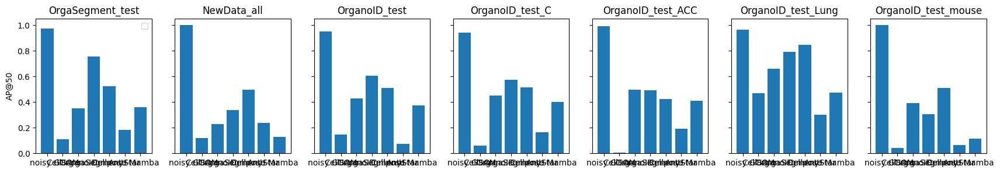

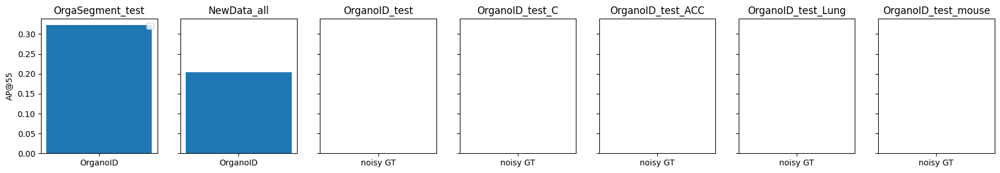

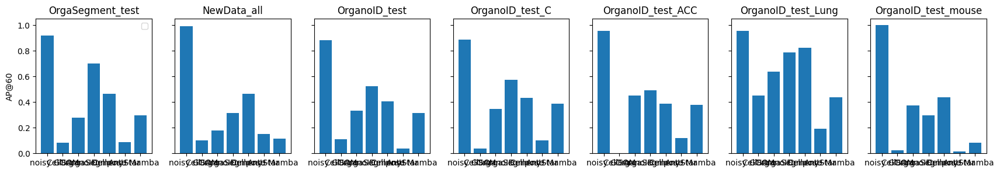

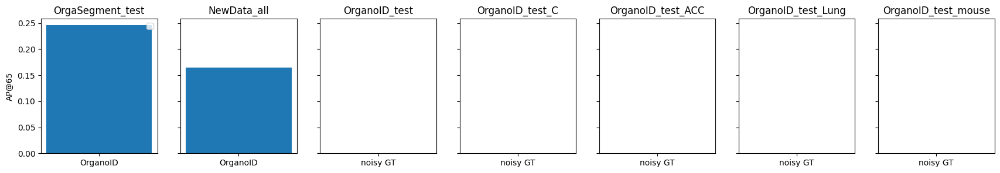

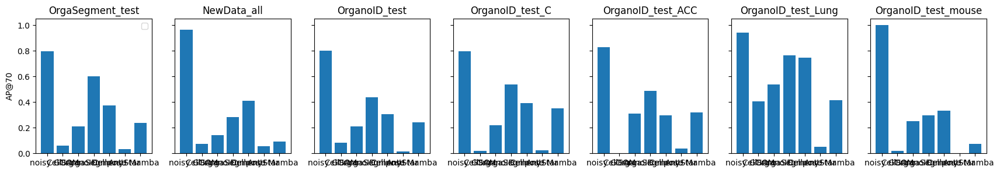

...

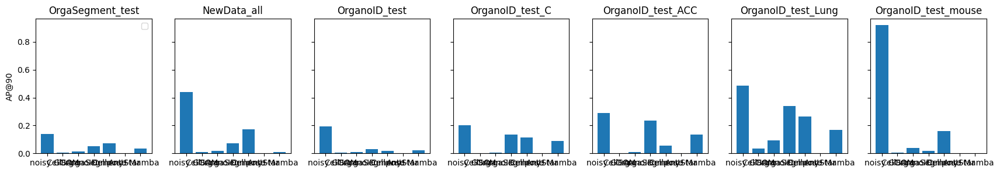

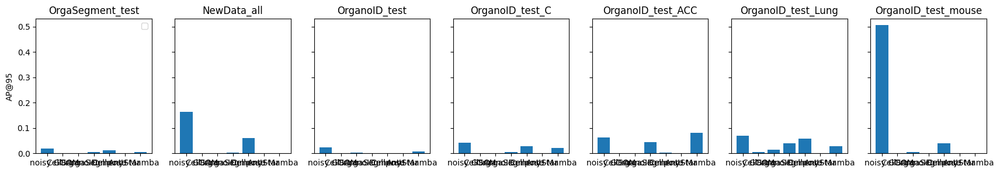

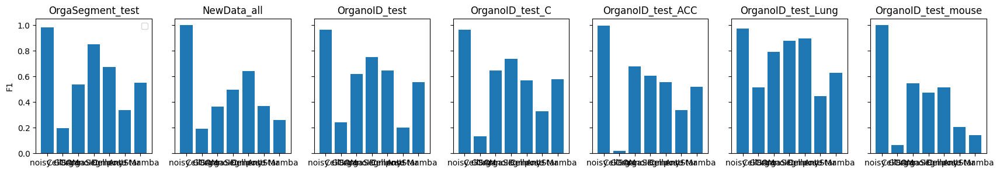

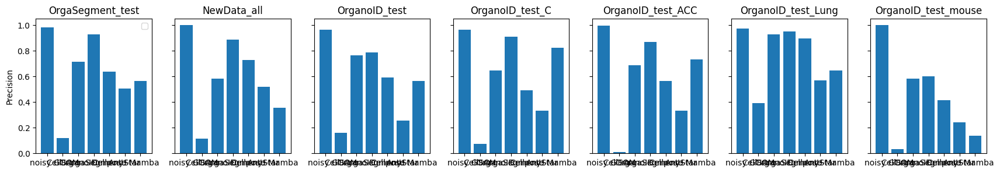

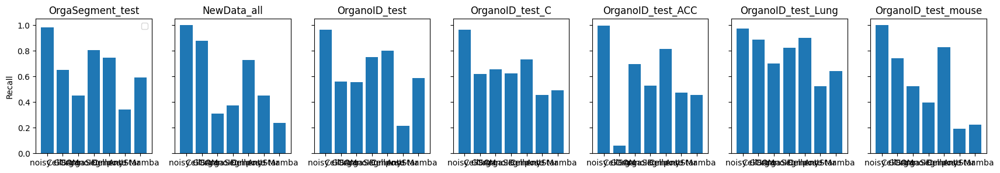

In [38]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5

datasets = [
    "OrgaSegment_test", 
    "NewData_all", 
    "OrganoID_test", 
    "OrganoID_test_C", 
    "OrganoID_test_ACC", 
    "OrganoID_test_Lung", 
    "OrganoID_test_mouse"
]

ds2name = {
    "OrgaSegment_test": "OrgaSegment", 
    "NewData_all": "Ours", 
    "OrganoID_test": "PDAC", 
    "OrganoID_test_C": "Colon", 
    "OrganoID_test_ACC": "ACC", 
    "OrganoID_test_Lung": "Lung", 
    "OrganoID_test_mouse": "Mouse"
}

metrics = [
    'AP@50',
    'AP@55',
    'AP@60',
    'AP@65',
    'AP@70',
    'AP@75', 
    'AP@80',
    'AP@85', 
    'AP@90',
    'AP@95', 
]


results = []
columns = ['dataset', 'model'] + [name for name in metrics] + ['F1', 'Precision', 'Recall']
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in ['gt_sam1_sd_2_bias_0',
                  # 'gt_sam2_sd_2_bias_0',
                  'AnyStar_20',
                  'AnyStar_10',
                  'AnyStar_5',
                  'AnyStar_all',
                  'cellsam',
                  'umamba_bot',
                  'umamba_enc',
                  'OrganoID',
                  'OrgaSegment',
                  'cellpose_diam_[None]',
                  'cellpose_diam_[30]',
                  'cellpose_diam_[100]',
                  'cellpose_diam_[300]',
                  'cellpose_diam_[100,300]',
                  ]:
        if (results_dir / model / f'mean_detection_AP_{dataset}.csv').exists():
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_AP_{dataset}.csv')
            print(model, len(metrics_df))

            data = [dataset, model.replace('gt_sam1_sd_2_bias_0', 'noisy GT').replace('cellsam', 'CellSAM').replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
            for i, metric_name in enumerate(metrics):
                if len(metrics_df) < 10:
                    if i in [1, 3]:
                        data.append(np.nan)
                    elif i == 0:
                        v = metrics_df.iloc[0].item()
                        data.append(v)
                    elif i == 2:
                        v = metrics_df.iloc[1].item()
                        data.append(v)
                    elif i > 3:
                        v = metrics_df.iloc[i-2].item()
                        data.append(v)
                    else:
                        raise RuntimeError(i)
                else:
                    v = metrics_df.iloc[i].item()
                    data.append(v)
                # print(v)
                
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_metrics_{dataset}.csv')
            metrics_df = metrics_df.max()
            data.extend([metrics_df['f1'], metrics_df['precision'], metrics_df['recall']])
            results.append(data)

results = pd.DataFrame(data=results, columns=columns)


# Summarize best cellpose
cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('cellpose'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    AP_50 = pd.NamedAgg('AP@50', 'max'),
    AP_60 = pd.NamedAgg('AP@60', 'max'),
    AP_70 = pd.NamedAgg('AP@70', 'max'),
    AP_75 = pd.NamedAgg('AP@75', 'max'),
    AP_80 = pd.NamedAgg('AP@80', 'max'),
    AP_85 = pd.NamedAgg('AP@85', 'max'),
    AP_90 = pd.NamedAgg('AP@90', 'max'),
    AP_95 = pd.NamedAgg('AP@95', 'max'),
    F1 = pd.NamedAgg('F1', 'max'),
    Precision = pd.NamedAgg('Precision', 'max'),
    Recall = pd.NamedAgg('Recall', 'max'),
).rename(columns={
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
cellpose_best['model'] = 'Cellpose'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)







# Summarize best Anystar
cellpose_df = results[results.model.apply(lambda x: x.startswith('AnyStar'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('AnyStar'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    AP_50 = pd.NamedAgg('AP@50', 'max'),
    AP_60 = pd.NamedAgg('AP@60', 'max'),
    AP_70 = pd.NamedAgg('AP@70', 'max'),
    AP_75 = pd.NamedAgg('AP@75', 'max'),
    AP_80 = pd.NamedAgg('AP@80', 'max'),
    AP_85 = pd.NamedAgg('AP@85', 'max'),
    AP_90 = pd.NamedAgg('AP@90', 'max'),
    AP_95 = pd.NamedAgg('AP@95', 'max'),
    F1 = pd.NamedAgg('F1', 'max'),
    Precision = pd.NamedAgg('Precision', 'max'),
    Recall = pd.NamedAgg('Recall', 'max'),
).rename(columns={
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
cellpose_best['model'] = 'AnyStar'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)




# Summarize best Umamba
cellpose_df = results[results.model.apply(lambda x: x.startswith('umamba'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('umamba'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    AP_50 = pd.NamedAgg('AP@50', 'max'),
    AP_60 = pd.NamedAgg('AP@60', 'max'),
    AP_70 = pd.NamedAgg('AP@70', 'max'),
    AP_75 = pd.NamedAgg('AP@75', 'max'),
    AP_80 = pd.NamedAgg('AP@80', 'max'),
    AP_85 = pd.NamedAgg('AP@85', 'max'),
    AP_90 = pd.NamedAgg('AP@90', 'max'),
    AP_95 = pd.NamedAgg('AP@95', 'max'),
    F1 = pd.NamedAgg('F1', 'max'),
    Precision = pd.NamedAgg('Precision', 'max'),
    Recall = pd.NamedAgg('Recall', 'max'),
).rename(columns={
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
cellpose_best['model'] = 'U-Mamba'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)







for metric_name in metrics + ['F1', 'Precision', 'Recall']:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
        ax[i].set_title(dataset)
        ax[i].bar(df['model'].values.flatten(), 
                      df[metric_name].values.flatten())
        
        if metric_name in ['iou']:
            ax[i].set_ylim(0.7, 1)
        if metric_name in ['dice']:
            ax[i].set_ylim(0.75, 1)
        if i==0:
            ax[i].legend()


In [39]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='AP@50'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2)

dataset,Ours,OrgaSegment,Mouse,ACC,Colon,Lung,PDAC
model,,,,,,,
AnyStar,0.24,0.18,0.07,0.19,0.16,0.30,0.07
CellSAM,0.12,0.11,0.04,0.01,0.06,0.47,0.15
Cellpose,0.50,0.53,0.51,0.42,0.51,0.85,0.51
OrgaSegment,0.34,0.75,0.30,0.49,0.58,0.79,0.60
OrganoID,0.23,0.35,0.39,0.50,0.45,0.66,0.43
U-Mamba,0.13,0.36,0.12,0.41,0.40,0.47,0.38
noisy GT,1.00,0.97,1.00,0.99,0.94,0.96,0.95


In [40]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='AP@50'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.24 & 0.18 & 0.07 & 0.19 & 0.16 & 0.30 & 0.07 \\
CellSAM & 0.12 & 0.11 & 0.04 & 0.01 & 0.06 & 0.47 & 0.15 \\
Cellpose & 0.50 & 0.53 & 0.51 & 0.42 & 0.51 & 0.85 & 0.51 \\
OrgaSegment & 0.34 & 0.75 & 0.30 & 0.49 & 0.58 & 0.79 & 0.60 \\
OrganoID & 0.23 & 0.35 & 0.39 & 0.50 & 0.45 & 0.66 & 0.43 \\
U-Mamba & 0.13 & 0.36 & 0.12 & 0.41 & 0.40 & 0.47 & 0.38 \\
noisy GT & 1.00 & 0.97 & 1.00 & 0.99 & 0.94 & 0.96 & 0.95 \\
\bottomrule
\end{tabular}



In [41]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='AP@75'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.03 & 0.01 & 0.00 & 0.02 & 0.01 & 0.01 & 0.01 \\
CellSAM & 0.06 & 0.05 & 0.02 & 0.00 & 0.01 & 0.36 & 0.07 \\
Cellpose & 0.38 & 0.33 & 0.29 & 0.24 & 0.31 & 0.70 & 0.23 \\
OrgaSegment & 0.26 & 0.52 & 0.28 & 0.46 & 0.51 & 0.74 & 0.33 \\
OrganoID & 0.12 & 0.16 & 0.19 & 0.19 & 0.12 & 0.49 & 0.15 \\
U-Mamba & 0.08 & 0.19 & 0.06 & 0.31 & 0.32 & 0.36 & 0.20 \\
noisy GT & 0.93 & 0.71 & 1.00 & 0.72 & 0.71 & 0.92 & 0.67 \\
\bottomrule
\end{tabular}



In [42]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='F1'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.37 & 0.34 & 0.21 & 0.34 & 0.33 & 0.45 & 0.20 \\
CellSAM & 0.19 & 0.20 & 0.07 & 0.02 & 0.13 & 0.52 & 0.24 \\
Cellpose & 0.64 & 0.68 & 0.51 & 0.55 & 0.57 & 0.90 & 0.65 \\
OrgaSegment & 0.49 & 0.85 & 0.47 & 0.60 & 0.74 & 0.88 & 0.75 \\
OrganoID & 0.37 & 0.54 & 0.55 & 0.68 & 0.65 & 0.79 & 0.62 \\
U-Mamba & 0.26 & 0.55 & 0.14 & 0.52 & 0.58 & 0.63 & 0.55 \\
noisy GT & 1.00 & 0.98 & 1.00 & 1.00 & 0.96 & 0.98 & 0.97 \\
\bottomrule
\end{tabular}



In [43]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Precision'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.52 & 0.51 & 0.24 & 0.33 & 0.33 & 0.57 & 0.26 \\
CellSAM & 0.11 & 0.12 & 0.03 & 0.01 & 0.08 & 0.39 & 0.16 \\
Cellpose & 0.73 & 0.64 & 0.41 & 0.57 & 0.49 & 0.89 & 0.59 \\
OrgaSegment & 0.89 & 0.93 & 0.60 & 0.87 & 0.91 & 0.95 & 0.79 \\
OrganoID & 0.58 & 0.72 & 0.58 & 0.69 & 0.65 & 0.93 & 0.76 \\
U-Mamba & 0.36 & 0.57 & 0.14 & 0.73 & 0.82 & 0.65 & 0.57 \\
noisy GT & 1.00 & 0.98 & 1.00 & 1.00 & 0.96 & 0.98 & 0.97 \\
\bottomrule
\end{tabular}



In [44]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Recall'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.45 & 0.34 & 0.19 & 0.47 & 0.46 & 0.52 & 0.22 \\
CellSAM & 0.88 & 0.65 & 0.74 & 0.06 & 0.62 & 0.89 & 0.56 \\
Cellpose & 0.73 & 0.75 & 0.83 & 0.82 & 0.73 & 0.90 & 0.80 \\
OrgaSegment & 0.37 & 0.80 & 0.39 & 0.53 & 0.63 & 0.82 & 0.75 \\
OrganoID & 0.31 & 0.45 & 0.53 & 0.70 & 0.66 & 0.70 & 0.55 \\
U-Mamba & 0.24 & 0.59 & 0.22 & 0.45 & 0.49 & 0.64 & 0.59 \\
noisy GT & 1.00 & 0.98 & 1.00 & 1.00 & 0.96 & 0.98 & 0.97 \\
\bottomrule
\end{tabular}



# Evaluation of trained detection methods

In [51]:
# # Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
# iou_thres = 0.5


# datasets = [
#     "OrgaSegment_test", 
#     "NewData_all", 
#     "OrganoID_test", 
#     "OrganoID_test_C", 
#     "OrganoID_test_ACC", 
#     "OrganoID_test_Lung", 
#     "OrganoID_test_mouse"
# ]

# ds2name = {
#     "OrgaSegment_test": "OrgaSegment", 
#     "NewData_all": "Ours", 
#     "OrganoID_test": "PDAC", 
#     "OrganoID_test_C": "Colon", 
#     "OrganoID_test_ACC": "ACC", 
#     "OrganoID_test_Lung": "Lung", 
#     "OrganoID_test_mouse": "Mouse"
# }


# metrics = [
#     ('hausdorff_scores', 'hausdorff'), 
#     ('hausdorff_95_scores', 'hausdorff 95'), 
#     ('masd_scores', 'masd'), 
#     ('assd_scores', 'assd'), 
#     ('iou_scores_no_thres', 'iou'), 
#     ('dice_scores_no_thres', 'dice')
# ]


# results = []
# columns = ['dataset', 'model'] + [name for m, name in metrics]
# for j, dataset in enumerate(datasets):
#     # ax[0, j].set_title(dataset)
#     for model in [# 'gt_sam1_sd_0_bias_0',
#                 #   'gt_sam2_sd_0_bias_0',
#                   'AnyStar_20',
#                   'AnyStar_10',
#                   'AnyStar_5',
#                   'AnyStar_all',
#                   'cellsam',
#                   'umamba_bot',
#                   'umamba_enc',
#                   'OrganoID',
#                   'OrgaSegment',
#                   'gt_sam1_sd_2_bias_0',
#                   'gt_sam2_sd_2_bias_0',
#                   'cellpose_diam_[None]',
#                   'cellpose_diam_[30]',
#                   'cellpose_diam_[100]',
#                   'cellpose_diam_[300]',
#                   'cellpose_diam_[100,300]',]:
#         metrics_df = pd.read_csv(results_dir / model / f'mean_segmentation_AP_{dataset}.csv')

#         data = [dataset, model.replace('gt_sam1_sd_2_bias_0', 'SAM').replace('gt_sam2_sd_2_bias_0', 'SAM2').replace('cellsam', 'CellSAM').replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
#         for i, (metric, metric_name) in enumerate(metrics):
#             v = metrics_df[metrics_df['iou_thres']==iou_thres][metric].item()
#             data.append(v)
#         results.append(data)

# results = pd.DataFrame(data=results, columns=columns)

# # Summarize best cellpose
# cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
# not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('cellpose'))]
# # print(type(cellpose_df))

# cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
#     hausdorff = pd.NamedAgg('hausdorff', 'min'),
#     hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
#     masd = pd.NamedAgg('masd', 'min'),
#     assd = pd.NamedAgg('assd', 'min'),
#     iou = pd.NamedAgg('iou', 'max'),
#     dice = pd.NamedAgg('dice', 'max'),
# ).rename(columns={'hausdorff_95': 'hausdorff 95'})
# cellpose_best['model'] = 'Cellpose'  #  (best)'

# results = pd.concat([
#     not_cellpose_df,
#     cellpose_best,
# ], axis=0, ignore_index=True)



# # Summarize best AnyStar
# cellpose_df = results[results.model.apply(lambda x: x.startswith('AnyStar'))]
# not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('AnyStar'))]
# # print(type(cellpose_df))

# cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
#     hausdorff = pd.NamedAgg('hausdorff', 'min'),
#     hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
#     masd = pd.NamedAgg('masd', 'min'),
#     assd = pd.NamedAgg('assd', 'min'),
#     iou = pd.NamedAgg('iou', 'max'),
#     dice = pd.NamedAgg('dice', 'max'),
# ).rename(columns={'hausdorff_95': 'hausdorff 95'})
# cellpose_best['model'] = 'AnyStar'  #  (best)'

# results = pd.concat([
#     not_cellpose_df,
#     cellpose_best,
# ], axis=0, ignore_index=True)




# # Summarize best umamba
# cellpose_df = results[results.model.apply(lambda x: x.startswith('umamba'))]
# not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('umamba'))]
# # print(type(cellpose_df))

# cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
#     hausdorff = pd.NamedAgg('hausdorff', 'min'),
#     hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
#     masd = pd.NamedAgg('masd', 'min'),
#     assd = pd.NamedAgg('assd', 'min'),
#     iou = pd.NamedAgg('iou', 'max'),
#     dice = pd.NamedAgg('dice', 'max'),
# ).rename(columns={'hausdorff_95': 'hausdorff 95'})
# cellpose_best['model'] = 'U-Mamba'  #  (best)'

# results = pd.concat([
#     not_cellpose_df,
#     cellpose_best,
# ], axis=0, ignore_index=True)


# for _, metric_name in metrics:
#     fig, ax = plt.subplots(1, len(datasets), 
#                            sharey=True,
#                            figsize=(3*len(datasets), 3), 
#                            dpi=100)
#     ax[0].set_ylabel(metric_name)

#     for i, dataset in enumerate(datasets):
#         df = results[results.dataset==dataset]
#         # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
#         ax[i].set_title(dataset)
#         ax[i].bar(df['model'].values.flatten(), 
#                   df[metric_name].values.flatten(),
#                 #   c=df['model'].values.flatten(),
#                   )
        
#         if metric_name in ['iou']:
#             ax[i].set_ylim(0.7, 1)
#         if metric_name in ['dice']:
#             ax[i].set_ylim(0.75, 1)
#         if i==0:
#             ax[i].legend()

In [52]:
# results.replace(ds2name).pivot(
#     index='model', columns='dataset', values='hausdorff'
# ).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2)

In [53]:
# results.replace(ds2name).pivot(
#     index='model', columns='dataset', values='iou'
# ).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2)

In [54]:
# print(results.replace(ds2name).pivot(
#     index='model', columns='dataset', values='hausdorff'
# ).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].to_latex(float_format="%.2f"))
# # results.set_index(['dataset', 'model']).sort_index()

In [55]:
# print(results.replace(ds2name).pivot(
#     index='model', columns='dataset', values='masd'
# ).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))
# # results.set_index(['dataset', 'model']).sort_index()

In [56]:
# print(results.replace(ds2name).pivot(
#     index='model', columns='dataset', values='iou'
# ).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

##### Compare detection performance of zeroshot methods

In [13]:
results_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/results')

# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5

datasets = [
    "OrgaExtractor_all", 
    "NewData_all", 
    "OrganoID_test", 
    "OrganoID_test_C", 
    "OrganoID_test_ACC", 
    "OrganoID_test_Lung", 
    "OrganoID_test_mouse",
    "OrgaSegment_test",
    "MultiOrg_test_normal",
    "MultiOrg_test_macros",
    "Tellu_test",
    "OrgaQuant_test",
]

ds2name = {
    "MultiOrg_test_normal": "MultiOrg (normal)", 
    "MultiOrg_test_macros": "MultiOrg (macros)", 
    "Tellu_test": "Tellu", 
    "OrgaQuant_test": "OrgaQuant", 
    "OrgaExtractor_all": "OrgaExtractor", 
    "OrgaSegment_test": "OrgaSegment", 
    "NewData_all": "Ours", 
    "OrganoID_test": "PDAC", 
    "OrganoID_test_C": "Colon", 
    "OrganoID_test_ACC": "ACC", 
    "OrganoID_test_Lung": "Lung", 
    "OrganoID_test_mouse": "Mouse"
}

metrics = [
    'AP@50',
    'AP@55',
    'AP@60',
    'AP@65',
    'AP@70',
    'AP@75', 
    'AP@80',
    'AP@85', 
    'AP@90',
    'AP@95', 
]


results = []
columns = ['dataset', 'model'] + [name for name in metrics] + ['mAP', 'F1', 'Precision', 'Recall']
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in [
    #     'impr_thres_SSD_objects_dataset_2024_sam1',
    #     'impr_thres_SSD_objects_dataset_2025_sam1',
    #     'impr_thres_SSD_objects_dataset_2026_sam1',
    #     'impr_thres_FRCNNv2_bs50_objects_dataset_2024_sam1',
    #     'impr_thres_FRCNNv2_bs50_objects_dataset_2025_sam1',
    #     'impr_thres_FRCNNv2_bs50_objects_dataset_2026_sam1',
    #     'impr_thres_FRCNNv1_bs50_objects_dataset_2024_sam1',
    #     'impr_thres_FRCNNv1_bs50_objects_dataset_2025_sam1',
    #     'impr_thres_FRCNNv1_bs50_objects_dataset_2026_sam1',
    # #   'ours_small_short_2024_sam1',
    # #   'ours_small_short_2025_sam1',
    # #   'ours_small_short_2026_sam1',
    #     'impr_thres_final_long_bbox_loss_2024_sam1',
    #     'impr_thres_final_long_bbox_loss_2025_sam1',
    #     'impr_thres_final_long_bbox_loss_2026_sam1',
    # #   'impr_thres_final_long_600_epochs_2024_sam1',
    # #   'impr_thres_final_long_600_epochs_2025_sam1',
    # #   'impr_thres_final_long_600_epochs_2026_sam1',
    # #   'ours_small_standard_2026_sam1',
    # #   'ours_small_with_query_2024_sam1',
    # #   'ours_small_with_query_2025_sam1',
    # #   'ours_small_with_query_2026_sam1',
    # #   'ours_large_standard_2024_sam1',
        'impr_thres_frcnnv2_strong_aug_2024_sam1',
        'impr_thres_anchor_detr_2024_sam1',
        'impr_thres_anchor_detr_sam_base_2024_sam1',
        ]:
        if (results_dir / model / f'mean_detection_AP_{dataset}.csv').exists():
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_AP_{dataset}.csv')
            # print(model, len(metrics_df))

            data = [dataset, model]
            for i, metric_name in enumerate(metrics):
                if len(metrics_df) < 10:
                    # if i in [1, 3]:
                    #     data.append(np.nan)
                    # elif i == 0:
                    #     v = metrics_df.iloc[0].item()
                    #     data.append(v)
                    # elif i == 2:
                    #     v = metrics_df.iloc[1].item()
                    #     data.append(v)
                    # elif i > 3:
                    #     v = metrics_df.iloc[i-2].item()
                    #     data.append(v)
                    # else:
                    raise RuntimeError(i)
                else:
                    v = metrics_df.iloc[i].item()
                    data.append(v)
                # print(v)
            # print('metrics_df.mean().item()', metrics_df.mean().item())
            data.append(metrics_df.mean().item())
                
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_metrics_{dataset}.csv')
            metrics_df = metrics_df.max()
            data.extend([metrics_df['f1'], metrics_df['precision'], metrics_df['recall']])
            results.append(data)
        else:
            raise RuntimeError(results_dir / model / f'mean_detection_AP_{dataset}.csv')

results = pd.DataFrame(data=results, columns=columns)
# multiorg = results[results['dataset'].apply(lambda x: x.startswith('MultiOrg'))]
# results = pd.concat([
#     multiorg.groupby('model', as_index=False).mean(axis=0)
# ], axis=0)


# # aggregate statistics
# for model_base in ['impr_thres_SSD_objects_dataset',
#                   'impr_thres_FRCNNv2_bs50_objects_dataset',
#                   'impr_thres_FRCNNv1_bs50_objects_dataset',
#                 #   'ours_small_short',
#                   'impr_thres_final_long_bbox_loss',
#                 #   'impr_thres_final_long_600_epochs',
#                 #   'ours_small_standard',
#                 #   'ours_small_with_query',
#                 #   'ours_large_standard',
#                   ]:
#     # Summarize best cellpose
#     cellpose_df = results[results.model.apply(lambda x: x.startswith(model_base))]
#     not_cellpose_df = results[results.model.apply(lambda x: not x.startswith(model_base))]
#     # print(type(cellpose_df))

#     cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
#         AP_50 = pd.NamedAgg('AP@50', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_60 = pd.NamedAgg('AP@60', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_70 = pd.NamedAgg('AP@70', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_75 = pd.NamedAgg('AP@75', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_80 = pd.NamedAgg('AP@80', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_85 = pd.NamedAgg('AP@85', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_90 = pd.NamedAgg('AP@90', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         AP_95 = pd.NamedAgg('AP@95', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         mAP = pd.NamedAgg('mAP', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         F1 = pd.NamedAgg('F1', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         Precision = pd.NamedAgg('Precision', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#         Recall = pd.NamedAgg('Recall', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
#     ).rename(columns={
#         'AP_50': 'AP@50',
#         'AP_60': 'AP@60',
#         'AP_70': 'AP@70',
#         'AP_75': 'AP@75',
#         'AP_80': 'AP@80',
#         'AP_85': 'AP@85',
#         'AP_90': 'AP@90',
#         'AP_95': 'AP@95',
#     })
#     cellpose_best['model'] = model_base  #  (best)'

#     results = pd.concat([
#         not_cellpose_df,
#         cellpose_best,
#     ], axis=0, ignore_index=True)


In [252]:
results

,dataset,model,AP@50,AP@55,AP@60,AP@65,AP@70,AP@75,AP@80,AP@85,AP@90,AP@95,mAP,F1,Precision,Recall
0,OrgaExtractor_all,impr_thres_SSD_objects_dataset_2024_sam1,0.782877,0.778757,0.776578,0.764874,0.739061,0.694787,0.602394,0.413345,0.115763,0.003690,0.567212,0.730050,0.591807,0.984906
1,OrgaExtractor_all,impr_thres_SSD_objects_dataset_2025_sam1,0.773060,0.768948,0.764297,0.751176,0.728112,0.684778,0.605917,0.408463,0.125833,0.005555,0.561614,0.730240,0.594209,0.984941
2,OrgaExtractor_all,impr_thres_SSD_objects_dataset_2026_sam1,0.765620,0.763501,0.756375,0.744744,0.724981,0.687627,0.604073,0.429429,0.141413,0.005359,0.562312,0.729897,0.589672,0.984229
3,OrgaExtractor_all,impr_thres_FRCNNv2_bs50_objects_dataset_2024_sam1,0.844431,0.843973,0.840077,0.835380,0.826426,0.812351,0.762276,0.582708,0.224696,0.009880,0.658220,0.737410,0.599495,0.985318
4,OrgaExtractor_all,impr_thres_FRCNNv2_bs50_objects_dataset_2025_sam1,0.872933,0.872140,0.869830,0.863954,0.855782,0.839972,0.802614,0.630375,0.225461,0.007634,0.684069,0.787606,0.690467,0.985318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,OrgaQuant_test,impr_thres_FRCNNv1_bs50_objects_dataset_2025_sam1,0.943889,0.943740,0.941955,0.938909,0.921399,0.893753,0.847644,0.700984,0.426568,0.099059,0.765790,0.852577,0.977902,0.982717
140,OrgaQuant_test,impr_thres_FRCNNv1_bs50_objects_dataset_2026_sam1,0.948766,0.947182,0.947182,0.943715,0.928430,0.906226,0.849762,0.719090,0.417001,0.091227,0.769858,0.854546,0.982070,0.982626
141,OrgaQuant_test,impr_thres_final_long_bbox_loss_2024_sam1,0.938903,0.935009,0.932473,0.918547,0.889513,0.840110,0.707104,0.491664,0.229385,0.028797,0.691151,0.837077,0.958943,0.976827
142,OrgaQuant_test,impr_thres_final_long_bbox_loss_2025_sam1,0.941134,0.937726,0.935443,0.924863,0.892839,0.845789,0.725410,0.505556,0.220957,0.035592,0.696531,0.841448,0.964140,0.980263


In [ ]:
multiorg = results[results['dataset'].apply(lambda x: x.startswith('MultiOrg'))]
multiorg

,dataset,model,AP@50,AP@55,AP@60,AP@65,AP@70,AP@75,AP@80,AP@85,AP@90,AP@95,mAP,F1,Precision,Recall
96,MultiOrg_test_normal,impr_thres_SSD_objects_dataset_2024_sam1,0.702713,0.659215,0.591583,0.500791,0.393496,0.281356,0.180443,0.096180,0.047084,0.008729,0.346159,0.647190,0.968946,0.914700
97,MultiOrg_test_normal,impr_thres_SSD_objects_dataset_2025_sam1,0.706573,0.669326,0.608582,0.511762,0.402345,0.293126,0.181764,0.099049,0.045187,0.007519,0.352523,0.649923,0.974189,0.917487
98,MultiOrg_test_normal,impr_thres_SSD_objects_dataset_2026_sam1,0.697337,0.658126,0.595479,0.511863,0.401738,0.280897,0.180450,0.101096,0.046409,0.008227,0.348162,0.638150,0.967339,0.915346
99,MultiOrg_test_normal,impr_thres_FRCNNv2_bs50_objects_dataset_2024_sam1,0.741993,0.692162,0.617326,0.532461,0.419364,0.313945,0.203077,0.109201,0.049525,0.010336,0.368939,0.666101,0.955438,0.934350
100,MultiOrg_test_normal,impr_thres_FRCNNv2_bs50_objects_dataset_2025_sam1,0.727942,0.677966,0.600895,0.513588,0.412523,0.299170,0.203403,0.115085,0.053144,0.008967,0.361268,0.659678,0.962606,0.931174
101,MultiOrg_test_normal,impr_thres_FRCNNv2_bs50_objects_dataset_2026_sam1,0.729691,0.678016,0.600055,0.503667,0.404727,0.290687,0.194837,0.113794,0.045362,0.009673,0.357051,0.658104,0.951780,0.928932
102,MultiOrg_test_normal,impr_thres_FRCNNv1_bs50_objects_dataset_2024_sam1,0.727385,0.673243,0.604528,0.504695,0.399177,0.290871,0.192514,0.106342,0.049757,0.009127,0.355764,0.656257,0.949760,0.928723
103,MultiOrg_test_normal,impr_thres_FRCNNv1_bs50_objects_dataset_2025_sam1,0.728755,0.676621,0.606847,0.510726,0.401985,0.299872,0.192525,0.107617,0.050875,0.009115,0.358494,0.658508,0.949242,0.925120
104,MultiOrg_test_normal,impr_thres_FRCNNv1_bs50_objects_dataset_2026_sam1,0.733542,0.675488,0.604377,0.510697,0.404508,0.297359,0.201481,0.112604,0.052816,0.012057,0.360493,0.665926,0.949322,0.930367
105,MultiOrg_test_normal,impr_thres_final_long_bbox_loss_2024_sam1,0.646504,0.596351,0.506313,0.394624,0.279186,0.187632,0.100472,0.050873,0.014448,0.000880,0.277728,0.617053,0.891846,0.810911


In [ ]:
results = multiorg.groupby('model', as_index=False).agg(
    F1 = pd.NamedAgg('F1', 'mean'),
    AP_50 = pd.NamedAgg('AP@50', 'mean'),
    AP_60 = pd.NamedAgg('AP@60', 'mean'),
    AP_70 = pd.NamedAgg('AP@70', 'mean'),
    AP_75 = pd.NamedAgg('AP@75', 'mean'),
    AP_80 = pd.NamedAgg('AP@80', 'mean'),
    AP_85 = pd.NamedAgg('AP@85', 'mean'),
    AP_90 = pd.NamedAgg('AP@90', 'mean'),
    AP_95 = pd.NamedAgg('AP@95', 'mean'),
    mAP = pd.NamedAgg('mAP', 'mean'),
).rename(columns={
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
results['dataset'] = 'MultiOrg'


# aggregate statistics
for model_base in [
    'impr_thres_SSD_objects_dataset',
    'impr_thres_FRCNNv2_bs50_objects_dataset',
    'impr_thres_FRCNNv1_bs50_objects_dataset',
#   'ours_small_short',
    'impr_thres_final_long_bbox_loss',
#   'impr_thres_final_long_600_epochs',
#   'ours_small_standard',
#   'ours_small_with_query',
#   'ours_large_standard',
    ]:
    # Summarize best cellpose
    cellpose_df = results[results.model.apply(lambda x: x.startswith(model_base))]
    not_cellpose_df = results[results.model.apply(lambda x: not x.startswith(model_base))]
    # print(type(cellpose_df))

    cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
        AP_50 = pd.NamedAgg('AP@50', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_60 = pd.NamedAgg('AP@60', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_70 = pd.NamedAgg('AP@70', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_75 = pd.NamedAgg('AP@75', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_80 = pd.NamedAgg('AP@80', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_85 = pd.NamedAgg('AP@85', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_90 = pd.NamedAgg('AP@90', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_95 = pd.NamedAgg('AP@95', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        mAP = pd.NamedAgg('mAP', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        F1 = pd.NamedAgg('F1', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        # Precision = pd.NamedAgg('Precision', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        # Recall = pd.NamedAgg('Recall', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
    ).rename(columns={
        'AP_50': 'AP@50',
        'AP_60': 'AP@60',
        'AP_70': 'AP@70',
        'AP_75': 'AP@75',
        'AP_80': 'AP@80',
        'AP_85': 'AP@85',
        'AP_90': 'AP@90',
        'AP_95': 'AP@95',
    })
    cellpose_best['model'] = model_base  #  (best)'

    results = pd.concat([
        not_cellpose_df,
        cellpose_best,
    ], axis=0, ignore_index=True)

results

,model,F1,AP@50,AP@60,AP@70,AP@75,AP@80,AP@85,AP@90,AP@95,mAP,dataset
0,impr_thres_SSD_objects_dataset,61±0,66±0,54±1,34±0,22±0,13±0,7±0,3±0,0±0,30±0,MultiOrg
1,impr_thres_FRCNNv2_bs50_objects_dataset,64±0,71±1,57±1,37±1,26±0,16±0,8±0,3±0,1±0,33±0,MultiOrg
2,impr_thres_FRCNNv1_bs50_objects_dataset,64±0,70±0,56±0,35±0,25±0,15±0,8±0,3±0,1±0,32±0,MultiOrg
3,impr_thres_final_long_bbox_loss,60±0,63±1,48±1,25±0,15±0,7±0,3±0,1±0,0±0,26±0,MultiOrg


In [21]:
results

,dataset,model,AP@50,AP@55,AP@60,AP@65,AP@70,AP@75,AP@80,AP@85,AP@90,AP@95,mAP,F1,Precision,Recall
0,OrgaExtractor_all,impr_thres_frcnnv2_strong_aug_2024_sam1,0.660352,0.657885,0.653616,0.645770,0.633103,0.612738,0.559278,0.409392,0.148469,0.006785,0.498739,0.631071,0.466636,0.985318
1,OrgaExtractor_all,impr_thres_anchor_detr_2024_sam1,0.854500,0.853152,0.847530,0.839517,0.801504,0.758117,0.663819,0.443983,0.165007,0.007407,0.623454,0.736742,0.896667,0.984976
2,OrgaExtractor_all,impr_thres_anchor_detr_sam_base_2024_sam1,0.887532,0.886448,0.883945,0.871998,0.845581,0.777131,0.651344,0.431724,0.164058,0.006467,0.640623,0.818148,0.931366,0.985318
3,NewData_all,impr_thres_frcnnv2_strong_aug_2024_sam1,0.841890,0.820417,0.788471,0.750978,0.693826,0.606028,0.473597,0.297763,0.113538,0.007182,0.539369,0.769518,0.807569,0.945616
4,NewData_all,impr_thres_anchor_detr_2024_sam1,0.889467,0.875319,0.850754,0.820335,0.769030,0.697414,0.588204,0.406952,0.196866,0.027409,0.612175,0.814029,0.952442,0.968054
5,NewData_all,impr_thres_anchor_detr_sam_base_2024_sam1,0.865519,0.843922,0.825206,0.797184,0.765732,0.698358,0.558666,0.303179,0.058524,0.002287,0.571858,0.765106,0.958217,0.965120
6,OrganoID_test,impr_thres_frcnnv2_strong_aug_2024_sam1,0.681193,0.650503,0.563390,0.498370,0.402079,0.328085,0.197010,0.082629,0.019997,0.001568,0.342482,0.708745,0.877257,0.740839
7,OrganoID_test,impr_thres_anchor_detr_2024_sam1,0.657493,0.580180,0.509548,0.450412,0.381347,0.268025,0.170716,0.069981,0.012484,0.001536,0.310172,0.651796,0.936604,0.761351
8,OrganoID_test,impr_thres_anchor_detr_sam_base_2024_sam1,0.769026,0.704092,0.631565,0.533990,0.436787,0.298487,0.174926,0.041841,0.002759,0.000049,0.359352,0.730429,0.988220,0.846126
9,OrganoID_test_C,impr_thres_frcnnv2_strong_aug_2024_sam1,0.650037,0.585347,0.511861,0.410495,0.337371,0.232857,0.097575,0.051348,0.018946,0.000000,0.289584,0.712905,0.910354,0.722917


In [15]:
multiorg = results[results['dataset'].apply(lambda x: x.startswith('MultiOrg'))]
multiorg

,dataset,model,AP@50,AP@55,AP@60,AP@65,AP@70,AP@75,AP@80,AP@85,AP@90,AP@95,mAP,F1,Precision,Recall
24,MultiOrg_test_normal,impr_thres_frcnnv2_strong_aug_2024_sam1,0.670209,0.621403,0.546932,0.459742,0.367713,0.257617,0.176852,0.102531,0.039644,0.006287,0.324893,0.631379,0.835439,0.863757
25,MultiOrg_test_normal,impr_thres_anchor_detr_2024_sam1,0.711280,0.659366,0.582584,0.483045,0.372765,0.256061,0.156776,0.078794,0.031770,0.005359,0.333780,0.656204,0.931386,0.861444
26,MultiOrg_test_normal,impr_thres_anchor_detr_sam_base_2024_sam1,0.704080,0.658494,0.585638,0.485726,0.371654,0.263700,0.159905,0.084245,0.034159,0.001585,0.334919,0.642177,0.970101,0.860294
27,MultiOrg_test_macros,impr_thres_frcnnv2_strong_aug_2024_sam1,0.597610,0.545074,0.464919,0.365335,0.258274,0.172921,0.100421,0.047441,0.012700,0.001169,0.256586,0.580478,0.751939,0.862195
28,MultiOrg_test_macros,impr_thres_anchor_detr_2024_sam1,0.668346,0.604001,0.523727,0.412888,0.303131,0.184630,0.101549,0.039877,0.009588,0.000648,0.284839,0.598483,0.905188,0.878483
29,MultiOrg_test_macros,impr_thres_anchor_detr_sam_base_2024_sam1,0.667157,0.592953,0.509210,0.410073,0.289290,0.173180,0.084908,0.032489,0.011448,0.000851,0.277156,0.622222,0.971189,0.869518


In [10]:
results = multiorg.groupby('model', as_index=False).agg(
    F1 = pd.NamedAgg('F1', 'mean'),
    AP_50 = pd.NamedAgg('AP@50', 'mean'),
    AP_60 = pd.NamedAgg('AP@60', 'mean'),
    AP_70 = pd.NamedAgg('AP@70', 'mean'),
    AP_75 = pd.NamedAgg('AP@75', 'mean'),
    AP_80 = pd.NamedAgg('AP@80', 'mean'),
    AP_85 = pd.NamedAgg('AP@85', 'mean'),
    AP_90 = pd.NamedAgg('AP@90', 'mean'),
    AP_95 = pd.NamedAgg('AP@95', 'mean'),
    mAP = pd.NamedAgg('mAP', 'mean'),
).rename(columns={
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
results['dataset'] = 'MultiOrg'


# aggregate statistics
for model_base in [
#     'impr_thres_SSD_objects_dataset',
#     'impr_thres_FRCNNv2_bs50_objects_dataset',
#     'impr_thres_FRCNNv1_bs50_objects_dataset',
# #   'ours_small_short',
#     'impr_thres_final_long_bbox_loss',
# #   'impr_thres_final_long_600_epochs',
# #   'ours_small_standard',
# #   'ours_small_with_query',
# #   'ours_large_standard',
        'impr_thres_frcnnv2_strong_aug_2024_sam1',
        'impr_thres_anchor_detr_2024_sam1',
        'impr_thres_anchor_detr_sam_base_2024_sam1',
    ]:
    # Summarize best cellpose
    cellpose_df = results[results.model.apply(lambda x: x.startswith(model_base))]
    not_cellpose_df = results[results.model.apply(lambda x: not x.startswith(model_base))]
    # print(type(cellpose_df))

    cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
        AP_50 = pd.NamedAgg('AP@50', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_60 = pd.NamedAgg('AP@60', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_70 = pd.NamedAgg('AP@70', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_75 = pd.NamedAgg('AP@75', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_80 = pd.NamedAgg('AP@80', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_85 = pd.NamedAgg('AP@85', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_90 = pd.NamedAgg('AP@90', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        AP_95 = pd.NamedAgg('AP@95', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        mAP = pd.NamedAgg('mAP', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        F1 = pd.NamedAgg('F1', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        # Precision = pd.NamedAgg('Precision', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
        # Recall = pd.NamedAgg('Recall', lambda x: f'{x.mean().round(2)*100:2.0f}\u00B1{x.std().round(2) * 100:.0f}'),
    ).rename(columns={
        'AP_50': 'AP@50',
        'AP_60': 'AP@60',
        'AP_70': 'AP@70',
        'AP_75': 'AP@75',
        'AP_80': 'AP@80',
        'AP_85': 'AP@85',
        'AP_90': 'AP@90',
        'AP_95': 'AP@95',
    })
    cellpose_best['model'] = model_base  #  (best)'

    results = pd.concat([
        not_cellpose_df,
        cellpose_best,
    ], axis=0, ignore_index=True)

results

,model,F1,AP@50,AP@60,AP@70,AP@75,AP@80,AP@85,AP@90,AP@95,mAP,dataset
0,impr_thres_frcnnv2_strong_aug_2024_sam1,61±nan,63±nan,51±nan,31±nan,22±nan,14±nan,7±nan,3±nan,0±nan,29±nan,MultiOrg
1,impr_thres_anchor_detr_2024_sam1,63±nan,69±nan,55±nan,34±nan,22±nan,13±nan,6±nan,2±nan,0±nan,31±nan,MultiOrg
2,impr_thres_anchor_detr_sam_base_2024_sam1,63±nan,69±nan,55±nan,33±nan,22±nan,12±nan,6±nan,2±nan,0±nan,31±nan,MultiOrg


In [36]:
results.replace(ds2name).replace({
    # 'impr_thres_SSD_objects_dataset': "SSD",
    # 'impr_thres_FRCNNv2_bs50_objects_dataset': "FRCNN v2",
    # 'impr_thres_FRCNNv1_bs50_objects_dataset': "FRCNN v1",
    # 'impr_thres_final_long_600_epochs': "Ours long",
    # 'impr_thres_final_long_bbox_loss': "Ours long bbox",
    'impr_thres_frcnnv2_strong_aug_2024_sam1': 'FRCNNv2',
    'impr_thres_anchor_detr_2024_sam1': 'AnchorDETR (resnet)',
    'impr_thres_anchor_detr_sam_base_2024_sam1': 'AnchorDETR (SAM1)',
}).pivot(
    index='dataset', columns='model', values='AP@95'
).loc[['Ours', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaExtractor', 'OrgaSegment', 'OrgaQuant', 'Tellu', 
          "MultiOrg (normal)", "MultiOrg (macros)"
      ], ['FRCNNv2', 'AnchorDETR (resnet)', 'AnchorDETR (SAM1)']]  #.round(2)

model,FRCNNv2,AnchorDETR (resnet),AnchorDETR (SAM1)
dataset,,,
Ours,0.007182,0.027409,0.002287
Mouse,0.022230,0.000169,0.018261
ACC,0.000000,0.000000,0.000000
Colon,0.000000,0.002083,0.000000
Lung,0.000962,0.005261,0.000476
PDAC,0.001568,0.001536,0.000049
OrgaExtractor,0.006785,0.007407,0.006467
OrgaSegment,0.011282,0.021349,0.002478
OrgaQuant,0.084416,0.090770,0.026106


In [246]:
print(results.replace(ds2name).replace({
    'impr_thres_SSD_objects_dataset': "SSD",
    'impr_thres_FRCNNv2_bs50_objects_dataset': "FRCNN v2",
    'impr_thres_FRCNNv1_bs50_objects_dataset': "FRCNN v1",
    'impr_thres_final_long_600_epochs': "Ours long",
    'impr_thres_final_long_bbox_loss': "Ours long bbox",
}).pivot(
    index='dataset', columns='model', values='F1'
).loc[['Ours', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaExtractor', 'OrgaSegment', 'OrgaQuant', 'Tellu', 
          "MultiOrg (normal)", "MultiOrg (macros)"
      ], ['SSD', 'FRCNN v1', 'FRCNN v2', 'Ours long bbox']].to_latex())  #.round(2)

\begin{tabular}{lllll}
\toprule
model & SSD & FRCNN v1 & FRCNN v2 & Ours long bbox \\
dataset &  &  &  &  \\
\midrule
Ours & 76±1 & 79±0 & 78±1 & 77±1 \\
Mouse & 58±1 & 59±3 & 56±2 & 74±1 \\
ACC & 71±0 & 70±1 & 71±1 & 70±2 \\
Colon & 74±1 & 73±1 & 72±2 & 76±1 \\
Lung & 86±1 & 84±2 & 87±1 & 82±1 \\
PDAC & 63±1 & 66±0 & 68±2 & 68±1 \\
OrgaExtractor & 73±0 & 72±1 & 76±3 & 74±1 \\
OrgaSegment & 81±1 & 87±1 & 86±0 & 83±0 \\
OrgaQuant & 82±0 & 85±0 & 86±0 & 84±0 \\
Tellu & 87±1 & 91±0 & 91±0 & 83±0 \\
MultiOrg (normal) & 65±1 & 66±1 & 66±0 & 62±0 \\
MultiOrg (macros) & 58±0 & 61±1 & 63±0 & 58±0 \\
\bottomrule
\end{tabular}



### Visual examples

In [82]:
samos = PredictionSAM(sam_version='sam1', logging_name="DETR_own_implementation_SAM_large_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_detr_own_sam1_small_head_finetuning_long_extended_bb_loss_version_2_True_16_400_2024")
frcnn = PredictionSAM(sam_version='sam1', logging_name="FRCNN_default_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_20022025_baseline_frcnn_sampling_n_objects_dataset_True_8_50_2024")
frcnnv2 = PredictionSAM(sam_version='sam1', logging_name="FRCNNv2_default_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_20022025_baseline_frcnn_v2_sampling_n_objects_dataset_50_batches_per_epoch_True_8_50_2024")
ssd = PredictionSAM(sam_version='sam1', logging_name="SSD_default_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_20022025_baseline_ssd_sampling_n_objects_dataset_True_8_200_2024")
orgasegment = PredictorFromMasks('OrgaSegment')

In [281]:
model = 'impr_thres_final_long_bbox_loss_2024_sam1'
# model = 'impr_thres_FRCNNv2_bs50_objects_dataset_2024_sam1'
# model = 'impr_thres_SSD_objects_dataset_2024_sam1'

# dataset = 'Tellu_test'

metrics_df = pd.read_csv(results_dir / model / f'detection_metrics_{dataset}.csv')
metrics_df = metrics_df[metrics_df['thres']==0.975]
# metrics_df
metrics_df[metrics_df['f1'] <= np.min(metrics_df['f1'])+0.4]

,thres,pq,iou,dice,f1,precision,recall
11,0.975,0.0,0.771743,0.865962,0.546099,0.726415,0.437500
43,0.975,0.0,0.700399,0.818817,0.580796,0.738095,0.478764
91,0.975,0.0,0.689329,0.811176,0.378049,0.424658,0.340659
139,0.975,0.0,0.779634,0.871494,0.188525,0.244681,0.153333
171,0.975,0.0,0.685338,0.807216,0.538462,0.565657,0.513761
187,0.975,0.0,0.774158,0.868082,0.392157,0.379747,0.405405


In [282]:
# model = 'impr_thres_final_long_bbox_loss_2024_sam1'
model = 'impr_thres_FRCNNv2_bs50_objects_dataset_2024_sam1'
# model = 'impr_thres_SSD_objects_dataset_2024_sam1'

# dataset = 'MultiOrg_'

metrics_df = pd.read_csv(results_dir / model / f'detection_metrics_{dataset}.csv')
metrics_df.iloc[168, :]

thres        0.850000
pq           0.000000
iou          0.721233
dice         0.832862
f1           0.641509
precision    0.660194
recall       0.623853
Name: 168, dtype: float64

In [298]:
idx = int((171 - 11) / 16)
idx = 27
idx

27

In [ ]:
model = 'impr_thres_final_long_bbox_loss_2024_sam1'
# model = 'impr_thres_FRCNNv2_bs50_objects_dataset_2024_sam1'
# model = 'impr_thres_SSD_objects_dataset_2024_sam1'

dataset = 'NewData_all'

metrics_df = pd.read_csv(results_dir / model / f'mean_detection_metrics_{dataset}.csv')
metrics_df

,thres,pq,iou,dice,f1,precision,recall
0,0.100,0.0,0.810514,0.892155,0.395026,0.260355,0.969230
1,0.200,0.0,0.810996,0.892427,0.456223,0.313722,0.961748
2,0.300,0.0,0.811708,0.892908,0.497423,0.351889,0.955825
3,0.400,0.0,0.811704,0.892920,0.529988,0.385118,0.947474
4,0.500,0.0,0.812557,0.893496,0.560442,0.417342,0.939930
5,0.600,0.0,0.814247,0.894619,0.591183,0.452605,0.927920
6,0.700,0.0,0.815177,0.895219,0.626747,0.496260,0.918162
7,0.800,0.0,0.816042,0.895755,0.670749,0.554103,0.904415
8,0.850,0.0,0.817071,0.896396,0.693060,0.589535,0.891603
9,0.900,0.0,0.817861,0.896901,0.724888,0.640795,0.879800


In [303]:
thres_samos = 0.975
thres_frcnnv2 = 0.9
thres_ssd = 0.85

In [ ]:
# ds = dl.OrgaExtractor(split='test')
# ds = dl.Tellu(split='test')
# ds = dl.OrgaQuant(split='test')
# ds = dl.OrgaSegment(split='test')
# ds = dl.OrganoID(split='test')
# ds = dl.OrganoID(split='test_only_mouse')
# ds = dl.OrganoID(split='test_C')
# ds = dl.OrganoID(split='test_ACC')
# ds = dl.OrganoID(split='test_Lung')
ds = dl.NewData(split='all')
# ds = dl.MultiOrg(split='test_normal')
# ds = dl.MultiOrg(split='test_macros')

idx = 2
im, gt_mask, gt_boxes, im_path, im_ID = ds[idx]
im, flatfield = dl.normalize(im, correct_bg=False)
print(im.shape)

(2027, 1949, 3)


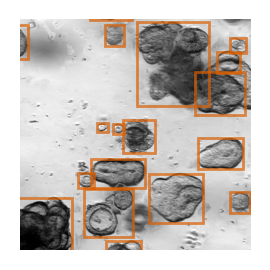

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(width/5.2, width/5.2))

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='#d95f02', linewidth=1)

ax.set_xlim(3500, 5500)
ax.set_ylim(500, 2500)

ax.axis('off')
ax.set_position((0, 0, 1, 1))
fig.savefig(results_dir.parent / 'results_paper' / f'{dataset}_GT_large.png')


In [305]:
dataset

'NewData_all'

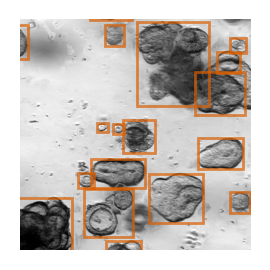

In [307]:
fig, ax = plt.subplots(1, 1, figsize=(width/5.2, width/5.2))

plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='#d95f02', linewidth=1)

# MultiOrg noral idx 11
# ax.set_xlim(500, 1200)
# ax.set_ylim(0, 700)

# MultiOrg noral idx 10
ax.set_xlim(3500, 5500)
ax.set_ylim(500, 2500)


# Tellu
# ax.set_xlim(500, 1200)
# ax.set_ylim(0, 700)

# OrganoID_test_mouse idx 1
# ax.set_xlim(1200, 2500)
# ax.set_ylim(200, 1500)

# OrganoID_test_mouse idx 0
# ax.set_xlim(1000, 1800)
# ax.set_ylim(0, 800)

# # Newdata idx 27
ax.set_xlim(950, 1950)
ax.set_ylim(950, 1950)

ax.axis('off')
ax.set_position((0, 0, 1, 1))
fig.savefig(results_dir.parent / 'results_paper' / f'{dataset}_GT_large.png')

# plot_boxes(im, boxes_samos[scores_samos > 0.9], format='yxyx_px', ax=ax, show_image=False, color='red')

# Plot mask predictions
# gt_masks = pp.convert_mask_to_binary(gt_mask)
# for i in range(gt_boxes.shape[0]):
#     contour = pp.mask_to_contour(gt_masks[i])
#     show_mask(contour, ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# Define custom line handles
# line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
# line_c = mlines.Line2D([], [], color='red', label='Model', linewidth=2)

# Add legend with custom handles
# plt.legend(handles=[line_a, line_c])

In [308]:
contours_samos, boxes_samos, scores_samos = samos.forward(f'{str(ds)}_{ds.split}', im_ID, predict_masks=False, min_diameter=10)
contours_samos, boxes_samos, scores_samos = samos.set_threshold(thres_samos)

59it [00:04, 13.10it/s]


before filter_diameter 1740716978.3629806
len(self.pred_scores) 17697
after filter_diameter 1740716978.4195976
after nms 1740716978.5280588
after predict masks 1740716978.5281641
after set_threshold 1740716978.5345604


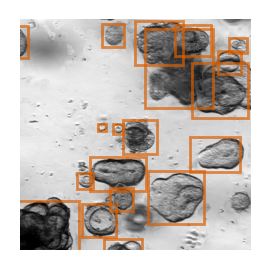

In [309]:
# fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)

# plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
# plot_boxes(im, boxes_samos[scores_samos > 0.9], format='yxyx_px', ax=ax, show_image=False, color='red')

fig, ax = plt.subplots(1, 1, figsize=(width/5.2, width/5.2))

plot_boxes(im, boxes_samos, format='yxyx_px', ax=ax, color='#d95f02', linewidth=1)

ax.set_xlim(950, 1950)
ax.set_ylim(950, 1950)
ax.axis('off')
ax.set_position((0, 0, 1, 1))
fig.savefig(results_dir.parent / 'results_paper' / f'{dataset}_SAMOS_large.png')

# Plot mask predictions
# gt_masks = pp.convert_mask_to_binary(gt_mask)
# for i in range(gt_boxes.shape[0]):
#     contour = pp.mask_to_contour(gt_masks[i])
#     show_mask(contour, ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# # Define custom line handles
# line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
# line_c = mlines.Line2D([], [], color='red', label='Model', linewidth=2)

# # Add legend with custom handles
# plt.legend(handles=[line_a, line_c])

In [310]:
contours, boxes, scores = frcnnv2.forward(f'{str(ds)}_{ds.split}', im_ID, predict_masks=False, min_diameter=10)
contours, boxes, scores = frcnnv2.set_threshold(thres_frcnnv2)

59it [00:04, 12.18it/s]

before filter_diameter 1740716987.5720556
len(self.pred_scores) 607
after filter_diameter 1740716987.5733294
after nms 1740716987.5891218
after predict masks 1740716987.5891788
after set_threshold 1740716987.5892134


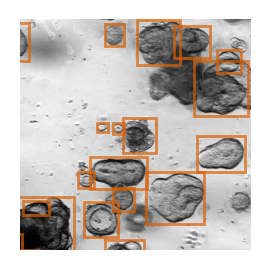

In [311]:
# fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)

# plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
# plot_boxes(im, boxes[scores > 0.5], format='yxyx_px', ax=ax, show_image=False, color='red')



fig, ax = plt.subplots(1, 1, figsize=(width/5.2, width/5.2))

plot_boxes(im, boxes, format='yxyx_px', ax=ax, color='#d95f02', linewidth=1)

ax.set_xlim(950, 1950)
ax.set_ylim(950, 1950)
ax.axis('off')
ax.set_position((0, 0, 1, 1))
fig.savefig(results_dir.parent / 'results_paper' / f'{dataset}_frcnnv2_large.png')


# Plot mask predictions
# gt_masks = pp.convert_mask_to_binary(gt_mask)
# for i in range(gt_boxes.shape[0]):
#     contour = pp.mask_to_contour(gt_masks[i])
#     show_mask(contour, ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# # Define custom line handles
# line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
# line_c = mlines.Line2D([], [], color='red', label='Model', linewidth=2)

# # Add legend with custom handles
# plt.legend(handles=[line_a, line_c])

In [312]:
contours_ssd, boxes_ssd, scores_ssd = ssd.forward(f'{str(ds)}_{ds.split}', im_ID, predict_masks=False, min_diameter=10)
contours_ssd, boxes_ssd, scores_ssd = ssd.set_threshold(thres_ssd)

59it [00:05, 10.65it/s]

before filter_diameter 1740716994.7647703
len(self.pred_scores) 2766
after filter_diameter 1740716994.767353
after nms 1740716994.8956249
after predict masks 1740716994.8957345
after set_threshold 1740716994.895778


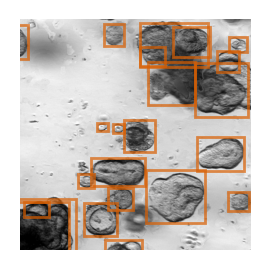

In [313]:
# fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)

# plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
# plot_boxes(im, boxes_ssd[scores_ssd > 0.5], format='yxyx_px', ax=ax, show_image=False, color='red')


fig, ax = plt.subplots(1, 1, figsize=(width/5.2, width/5.2))

plot_boxes(im, boxes_ssd, format='yxyx_px', ax=ax, color='#d95f02', linewidth=1)

ax.set_xlim(950, 1950)
ax.set_ylim(950, 1950)
ax.axis('off')
ax.set_position((0, 0, 1, 1))
fig.savefig(results_dir.parent / 'results_paper' / f'{dataset}_ssd_large.png')

# Plot mask predictions
# gt_masks = pp.convert_mask_to_binary(gt_mask)
# for i in range(gt_boxes.shape[0]):
#     contour = pp.mask_to_contour(gt_masks[i])
#     show_mask(contour, ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# # Define custom line handles
# line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
# line_c = mlines.Line2D([], [], color='red', label='Model', linewidth=2)

# # Add legend with custom handles
# plt.legend(handles=[line_a, line_c])

In [314]:
contours_orgasegment, boxes_orgasegment, scores_orgasegment = orgasegment.forward(f'{str(ds)}_{ds.split}', im_ID, predict_masks=False, min_diameter=10)
contours_orgasegment, boxes_orgasegment, scores_orgasegment = orgasegment.set_threshold(0.0)

In [315]:
boxes_orgasegment

array([[1220, 1206, 1283, 1267],
       [1948, 1257, 2025, 1432],
       [1375, 1387, 1509, 1533],
       [1709, 1479, 1928, 1765],
       [1072, 1512, 1281, 1746],
       [1838, 1318, 1921, 1398],
       [ 855,  186,  975,  303],
       [1834,   71, 1870,  100],
       [1586,    0, 1737,   49],
       [ 421,  173,  648,  404],
       [ 339, 1378,  459, 1517],
       [1085,  236, 1133,  280],
       [1624,   35, 1849,  286],
       [1605,  718, 1639,  755],
       [ 764,  796, 1169, 1155],
       [1268,  501, 1353,  584],
       [1783,  851, 1921,  978],
       [ 522,  690,  696,  857],
       [ 611, 1744,  883, 1944],
       [1542, 1724, 1810, 1943],
       [1302, 1723, 1436, 1915],
       [1142,  136, 1293,  284],
       [1464, 1287, 1498, 1328],
       [1012, 1233, 1147, 1368],
       [ 861, 1327,  986, 1474],
       [1456, 1354, 1497, 1397],
       [1216, 1263, 1345, 1491],
       [ 798, 1072,  914, 1175],
       [ 869,    1,  981,   62],
       [1805, 1861, 1868, 1928],
       [17

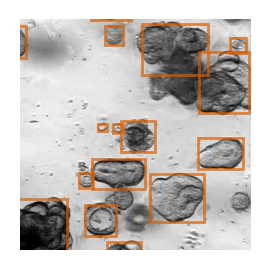

In [316]:
# fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)

# plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
# plot_boxes(im, boxes_ssd[scores_ssd > 0.5], format='yxyx_px', ax=ax, show_image=False, color='red')


fig, ax = plt.subplots(1, 1, figsize=(width/5.2, width/5.2))

plot_boxes(im, boxes_orgasegment, format='yxyx_px', ax=ax, color='#d95f02', linewidth=1)

ax.set_xlim(950, 1950)
ax.set_ylim(950, 1950)
ax.axis('off')
ax.set_position((0, 0, 1, 1))
fig.savefig(results_dir.parent / 'results_paper' / f'{dataset}_orgasegment.png')

# Plot mask predictions
# gt_masks = pp.convert_mask_to_binary(gt_mask)
# for i in range(gt_boxes.shape[0]):
#     contour = pp.mask_to_contour(gt_masks[i])
#     show_mask(contour, ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# # Define custom line handles
# line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
# line_c = mlines.Line2D([], [], color='red', label='Model', linewidth=2)

# # Add legend with custom handles
# plt.legend(handles=[line_a, line_c])

In [8]:
print(results.replace(ds2name).pivot(
    index='dataset', columns='model', values='F1'
).loc[['Ours', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaExtractor', 'OrgaSegment', 'OrgaQuant', 'Tellu', 
        #   "MultiOrg (normal)", "MultiOrg (macros)"
      ], ['SSD_objects_dataset', 'FRCNNv1_bs50_objects_dataset', 'FRCNNv2_bs50_objects_dataset', 'ours_small_long']].to_latex())

\begin{tabular}{lllll}
\toprule
model & SSD_objects_dataset & FRCNNv1_bs50_objects_dataset & FRCNNv2_bs50_objects_dataset & ours_small_long \\
dataset &  &  &  &  \\
\midrule
Ours & 76±1 & 79±0 & 78±1 & 78±nan \\
Mouse & 56±3 & 59±3 & 56±2 & 72±nan \\
ACC & 71±0 & 70±1 & 71±1 & 67±nan \\
Colon & 74±1 & 73±1 & 72±2 & 74±nan \\
Lung & 86±1 & 84±2 & 87±1 & 82±nan \\
PDAC & 63±1 & 66±0 & 68±2 & 67±nan \\
OrgaExtractor & 68±0 & 63±1 & 67±2 & 57±nan \\
OrgaSegment & 81±1 & 87±1 & 86±0 & 81±nan \\
OrgaQuant & 82±0 & 85±0 & 86±0 & 83±nan \\
Tellu & 87±1 & 91±0 & 91±0 & 82±nan \\
\bottomrule
\end{tabular}



In [10]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Precision'
).loc[:, ['Ours', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaExtractor', 'OrgaSegment', 'OrgaQuant', 'Tellu', 
        #   "MultiOrg (normal)", "MultiOrg (macros)"
          ]]  #.round(2)

dataset,Ours,Mouse,ACC,Colon,Lung,PDAC,OrgaExtractor,OrgaSegment,OrgaQuant,Tellu
model,,,,,,,,,,
FRCNNv1_bs50_objects_dataset,86 ± 1,64 ± 3,93 ± 4,92 ± 4,98 ± 1,91 ± 1,47 ± 1,96 ± 1,97 ± 0,95 ± 1
FRCNNv2_bs50_objects_dataset,89 ± 1,60 ± 2,93 ± 4,95 ± 2,99 ± 0,93 ± 1,52 ± 2,96 ± 0,96 ± 1,97 ± 1
SSD_objects_dataset,86 ± 1,56 ± 3,96 ± 3,94 ± 1,97 ± 1,93 ± 1,52 ± 0,93 ± 1,94 ± 1,94 ± 1
ours_large_standard,84 ± nan,75 ± nan,85 ± nan,92 ± nan,95 ± nan,87 ± nan,43 ± nan,90 ± nan,92 ± nan,90 ± nan
ours_small_long,81 ± nan,72 ± nan,86 ± nan,92 ± nan,95 ± nan,82 ± nan,40 ± nan,88 ± nan,93 ± nan,89 ± nan
ours_small_short,84 ± 1,78 ± 2,90 ± 7,87 ± 1,96 ± 1,88 ± 1,53 ± 1,91 ± 0,91 ± 1,90 ± 1
ours_small_standard,84 ± nan,71 ± nan,92 ± nan,90 ± nan,97 ± nan,86 ± nan,47 ± nan,90 ± nan,93 ± nan,90 ± nan
ours_small_with_query,78 ± 1,74 ± 1,77 ± 3,82 ± 5,94 ± 1,79 ± 4,44 ± 3,83 ± 4,90 ± 2,86 ± 1


In [ ]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='F1'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.37 & 0.34 & 0.21 & 0.34 & 0.33 & 0.45 & 0.20 \\
CellSAM & 0.19 & 0.20 & 0.07 & 0.02 & 0.13 & 0.52 & 0.24 \\
Cellpose & 0.64 & 0.68 & 0.51 & 0.55 & 0.57 & 0.90 & 0.65 \\
OrgaSegment & 0.49 & 0.85 & 0.47 & 0.60 & 0.74 & 0.88 & 0.75 \\
OrganoID & 0.37 & 0.54 & 0.55 & 0.68 & 0.65 & 0.79 & 0.62 \\
U-Mamba & 0.26 & 0.55 & 0.14 & 0.52 & 0.58 & 0.63 & 0.55 \\
noisy GT & 1.00 & 0.98 & 1.00 & 1.00 & 0.96 & 0.98 & 0.97 \\
\bottomrule
\end{tabular}



In [ ]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Precision'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.52 & 0.51 & 0.24 & 0.33 & 0.33 & 0.57 & 0.26 \\
CellSAM & 0.11 & 0.12 & 0.03 & 0.01 & 0.08 & 0.39 & 0.16 \\
Cellpose & 0.73 & 0.64 & 0.41 & 0.57 & 0.49 & 0.89 & 0.59 \\
OrgaSegment & 0.89 & 0.93 & 0.60 & 0.87 & 0.91 & 0.95 & 0.79 \\
OrganoID & 0.58 & 0.72 & 0.58 & 0.69 & 0.65 & 0.93 & 0.76 \\
U-Mamba & 0.36 & 0.57 & 0.14 & 0.73 & 0.82 & 0.65 & 0.57 \\
noisy GT & 1.00 & 0.98 & 1.00 & 1.00 & 0.96 & 0.98 & 0.97 \\
\bottomrule
\end{tabular}



In [ ]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Recall'
).loc[:, ['Ours', 'OrgaSegment', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', ]].round(2).to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrr}
\toprule
dataset & Ours & OrgaSegment & Mouse & ACC & Colon & Lung & PDAC \\
model &  &  &  &  &  &  &  \\
\midrule
AnyStar & 0.45 & 0.34 & 0.19 & 0.47 & 0.46 & 0.52 & 0.22 \\
CellSAM & 0.88 & 0.65 & 0.74 & 0.06 & 0.62 & 0.89 & 0.56 \\
Cellpose & 0.73 & 0.75 & 0.83 & 0.82 & 0.73 & 0.90 & 0.80 \\
OrgaSegment & 0.37 & 0.80 & 0.39 & 0.53 & 0.63 & 0.82 & 0.75 \\
OrganoID & 0.31 & 0.45 & 0.53 & 0.70 & 0.66 & 0.70 & 0.55 \\
U-Mamba & 0.24 & 0.59 & 0.22 & 0.45 & 0.49 & 0.64 & 0.59 \\
noisy GT & 1.00 & 0.98 & 1.00 & 1.00 & 0.96 & 0.98 & 0.97 \\
\bottomrule
\end{tabular}



##### Compare detection performance of baselines

/tmp/ipykernel_162255/361527812.py:139: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i].legend()


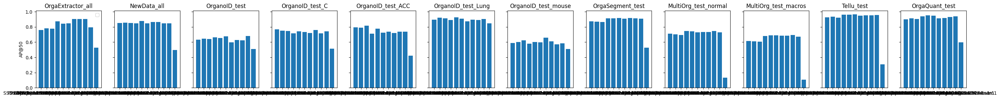

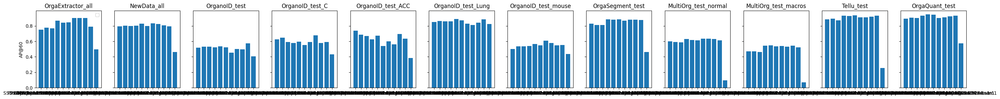

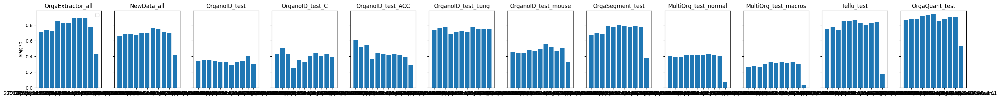

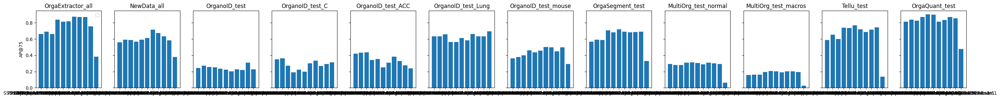

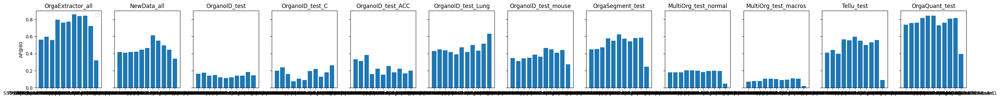

...

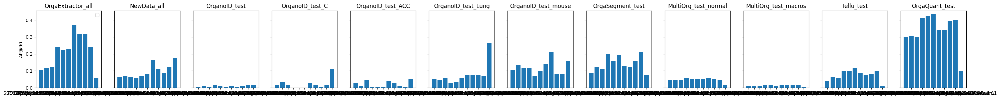

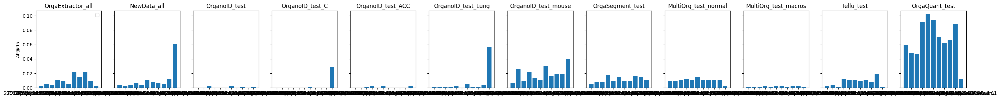

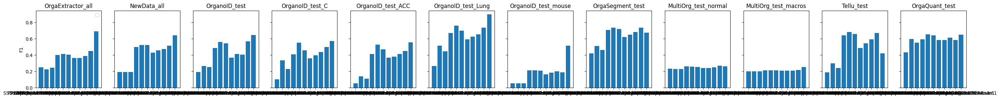

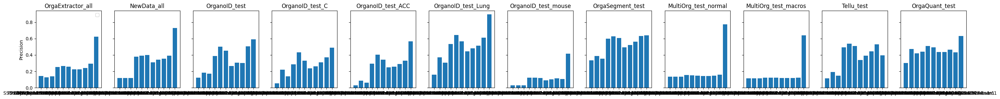

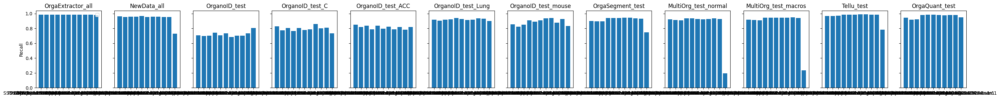

In [59]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5

datasets = [
    "OrgaExtractor_all", 
    "NewData_all", 
    "OrganoID_test", 
    "OrganoID_test_C", 
    "OrganoID_test_ACC", 
    "OrganoID_test_Lung", 
    "OrganoID_test_mouse",
    "OrgaSegment_test",
    "MultiOrg_test_normal",
    "MultiOrg_test_macros",
    "Tellu_test",
    "OrgaQuant_test",
]

ds2name = {
    "MultiOrg_test_normal": "MultiOrg (normal)", 
    "MultiOrg_test_macros": "MultiOrg (macros)", 
    "Tellu_test": "Tellu", 
    "OrgaQuant_test": "OrgaQuant", 
    "OrgaExtractor_all": "OrgaExtractor", 
    "OrgaSegment_test": "OrgaSegment", 
    "NewData_all": "Ours", 
    "OrganoID_test": "PDAC", 
    "OrganoID_test_C": "Colon", 
    "OrganoID_test_ACC": "ACC", 
    "OrganoID_test_Lung": "Lung", 
    "OrganoID_test_mouse": "Mouse"
}

metrics = [
    'AP@50',
    'AP@60',
    'AP@70',
    'AP@75', 
    'AP@80',
    'AP@85', 
    'AP@90',
    'AP@95', 
]


results = []
columns = ['dataset', 'model'] + [name for name in metrics] + ['F1', 'Precision', 'Recall']
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in ['cellpose_diam_[None]',
                  'cellpose_diam_[30]',
                  'cellpose_diam_[100]',
                  'cellpose_diam_[300]',
                  'cellpose_diam_[100,300]',
                  'SSD_objects_2024_sam1',
                  'SSD_objects_dataset_2024_sam1',
                  'SSD_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs5_objects_2024_sam1',
                  'FRCNNv2_bs10_objects_2024_sam1',
                  'FRCNNv2_bs20_objects_2024_sam1',
                  'FRCNNv2_bs100_objects_2024_sam1',
                  ]:
        if (results_dir / model / f'mean_detection_AP_{dataset}.csv').exists():
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_AP_{dataset}.csv')
            # print(metrics_df)

            data = [dataset, model.replace('gt_sam1_sd_2_bias_0', 'noisy GT').replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
            for i, metric_name in enumerate(metrics):
                v = metrics_df.iloc[i].item()
                data.append(v)
                # print(v)
                
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_metrics_{dataset}.csv')
            metrics_df = metrics_df.max()
            data.extend([metrics_df['f1'], metrics_df['precision'], metrics_df['recall']])
            results.append(data)

results = pd.DataFrame(data=results, columns=columns)


# Summarize best cellpose
cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('cellpose'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    AP_50 = pd.NamedAgg('AP@50', 'max'),
    AP_60 = pd.NamedAgg('AP@60', 'max'),
    AP_70 = pd.NamedAgg('AP@70', 'max'),
    AP_75 = pd.NamedAgg('AP@75', 'max'),
    AP_80 = pd.NamedAgg('AP@80', 'max'),
    AP_85 = pd.NamedAgg('AP@85', 'max'),
    AP_90 = pd.NamedAgg('AP@90', 'max'),
    AP_95 = pd.NamedAgg('AP@95', 'max'),
    F1 = pd.NamedAgg('F1', 'max'),
    Precision = pd.NamedAgg('Precision', 'max'),
    Recall = pd.NamedAgg('Recall', 'max'),
).rename(columns={
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
cellpose_best['model'] = 'Cellpose'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)



for metric_name in metrics + ['F1', 'Precision', 'Recall']:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
        ax[i].set_title(dataset)
        ax[i].bar(df['model'].values.flatten(), 
                      df[metric_name].values.flatten())
        
        if metric_name in ['iou']:
            ax[i].set_ylim(0.7, 1)
        if metric_name in ['dice']:
            ax[i].set_ylim(0.75, 1)
        if i==0:
            ax[i].legend()


In [58]:
np.unique(results.replace(ds2name)['model'].values)  # .pivot(index='model', columns='dataset', values='F1')

array(['Cellpose', 'FRCNNv2 bs10 objects 2024 sam1',
       'FRCNNv2 bs100 objects 2024 sam1',
       'FRCNNv2 bs20 objects 2024 sam1', 'FRCNNv2 bs5 objects 2024 sam1',
       'FRCNNv2 bs50 objects 2024 sam1',
       'FRCNNv2 bs50 objects dataset 2024 sam1',
       'FRCNNv2 bs50 objects dataset patchsize 2024 sam1',
       'SSD objects 2024 sam1', 'SSD objects dataset 2024 sam1',
       'SSD objects dataset patchsize 2024 sam1'], dtype=object)

In [62]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='AP@50'
).loc[:, ['Ours', 'OrgaExtractor', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaSegment', 'OrgaQuant', 'Tellu', 'MultiOrg (normal)', 'MultiOrg (macros)']].round(2)

dataset,Ours,OrgaExtractor,Mouse,ACC,Colon,Lung,PDAC,OrgaSegment,OrgaQuant,Tellu,MultiOrg (normal),MultiOrg (macros)
model,,,,,,,,,,,,
Cellpose,0.50,0.53,0.51,0.42,0.51,0.85,0.51,0.53,0.59,0.31,0.13,0.11
FRCNNv2 bs10 objects 2024 sam1,0.87,0.90,0.61,0.72,0.76,0.89,0.63,0.92,0.92,0.95,0.73,0.69
FRCNNv2 bs100 objects 2024 sam1,0.85,0.79,0.58,0.74,0.74,0.90,0.68,0.91,0.94,0.96,0.73,0.67
FRCNNv2 bs20 objects 2024 sam1,0.85,0.90,0.57,0.74,0.72,0.89,0.62,0.91,0.93,0.95,0.74,0.69
FRCNNv2 bs5 objects 2024 sam1,0.87,0.91,0.66,0.74,0.72,0.87,0.60,0.91,0.91,0.95,0.73,0.69
FRCNNv2 bs50 objects 2024 sam1,0.85,0.87,0.58,0.71,0.72,0.89,0.66,0.91,0.94,0.96,0.74,0.68
FRCNNv2 bs50 objects dataset 2024 sam1,0.88,0.84,0.60,0.78,0.74,0.93,0.65,0.91,0.95,0.96,0.74,0.69
FRCNNv2 bs50 objects dataset patchsize 2024 sam1,0.85,0.85,0.60,0.73,0.73,0.91,0.67,0.92,0.95,0.96,0.73,0.69
SSD objects 2024 sam1,0.85,0.76,0.59,0.79,0.77,0.89,0.63,0.87,0.90,0.92,0.71,0.61


In [63]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='AP@75'
).loc[:, ['Ours', 'OrgaExtractor', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaSegment', 'OrgaQuant', 'Tellu', 'MultiOrg (normal)', 'MultiOrg (macros)']].round(2)

dataset,Ours,OrgaExtractor,Mouse,ACC,Colon,Lung,PDAC,OrgaSegment,OrgaQuant,Tellu,MultiOrg (normal),MultiOrg (macros)
model,,,,,,,,,,,,
Cellpose,0.38,0.38,0.29,0.24,0.31,0.70,0.23,0.33,0.48,0.14,0.06,0.03
FRCNNv2 bs10 objects 2024 sam1,0.67,0.87,0.50,0.38,0.33,0.66,0.23,0.68,0.83,0.69,0.31,0.20
FRCNNv2 bs100 objects 2024 sam1,0.59,0.76,0.50,0.28,0.29,0.64,0.31,0.69,0.86,0.75,0.29,0.20
FRCNNv2 bs20 objects 2024 sam1,0.63,0.87,0.45,0.33,0.27,0.63,0.22,0.69,0.87,0.71,0.30,0.20
FRCNNv2 bs5 objects 2024 sam1,0.72,0.87,0.50,0.31,0.30,0.59,0.20,0.69,0.81,0.72,0.29,0.19
FRCNNv2 bs50 objects 2024 sam1,0.57,0.84,0.46,0.34,0.19,0.56,0.25,0.71,0.87,0.74,0.31,0.20
FRCNNv2 bs50 objects dataset 2024 sam1,0.59,0.81,0.44,0.35,0.22,0.56,0.23,0.68,0.90,0.74,0.31,0.21
FRCNNv2 bs50 objects dataset patchsize 2024 sam1,0.61,0.82,0.46,0.25,0.20,0.61,0.22,0.72,0.90,0.77,0.30,0.20
SSD objects 2024 sam1,0.56,0.66,0.36,0.42,0.35,0.63,0.24,0.57,0.81,0.59,0.29,0.16


In [64]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Precision'
).loc[:, ['Ours', 'OrgaExtractor', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaSegment', 'OrgaQuant', 'Tellu', 'MultiOrg (normal)', 'MultiOrg (macros)']].round(2)

dataset,Ours,OrgaExtractor,Mouse,ACC,Colon,Lung,PDAC,OrgaSegment,OrgaQuant,Tellu,MultiOrg (normal),MultiOrg (macros)
model,,,,,,,,,,,,
Cellpose,0.73,0.62,0.41,0.57,0.49,0.89,0.59,0.64,0.63,0.40,0.78,0.64
FRCNNv2 bs10 objects 2024 sam1,0.34,0.22,0.10,0.26,0.26,0.48,0.31,0.52,0.43,0.39,0.14,0.12
FRCNNv2 bs100 objects 2024 sam1,0.39,0.29,0.11,0.33,0.37,0.61,0.50,0.63,0.43,0.53,0.16,0.12
FRCNNv2 bs20 objects 2024 sam1,0.35,0.24,0.11,0.29,0.31,0.51,0.30,0.56,0.47,0.44,0.15,0.12
FRCNNv2 bs5 objects 2024 sam1,0.31,0.22,0.09,0.25,0.24,0.44,0.26,0.49,0.44,0.34,0.14,0.12
FRCNNv2 bs50 objects 2024 sam1,0.38,0.25,0.12,0.29,0.29,0.53,0.39,0.60,0.44,0.49,0.15,0.12
FRCNNv2 bs50 objects dataset 2024 sam1,0.39,0.26,0.12,0.40,0.43,0.64,0.50,0.63,0.51,0.54,0.15,0.12
FRCNNv2 bs50 objects dataset patchsize 2024 sam1,0.40,0.26,0.12,0.34,0.33,0.57,0.45,0.61,0.49,0.51,0.15,0.12
SSD objects 2024 sam1,0.12,0.14,0.03,0.03,0.06,0.16,0.12,0.33,0.30,0.12,0.14,0.11


In [65]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='Recall'
).loc[:, ['Ours', 'OrgaExtractor', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaSegment', 'OrgaQuant', 'Tellu', 'MultiOrg (normal)', 'MultiOrg (macros)']].round(2)

dataset,Ours,OrgaExtractor,Mouse,ACC,Colon,Lung,PDAC,OrgaSegment,OrgaQuant,Tellu,MultiOrg (normal),MultiOrg (macros)
model,,,,,,,,,,,,
Cellpose,0.73,0.98,0.83,0.82,0.73,0.90,0.80,0.75,0.95,0.78,0.19,0.23
FRCNNv2 bs10 objects 2024 sam1,0.96,0.99,0.94,0.79,0.86,0.92,0.70,0.94,0.98,0.99,0.93,0.95
FRCNNv2 bs100 objects 2024 sam1,0.95,0.99,0.93,0.78,0.81,0.93,0.74,0.93,0.98,0.98,0.93,0.94
FRCNNv2 bs20 objects 2024 sam1,0.95,0.98,0.88,0.82,0.80,0.94,0.70,0.94,0.98,0.99,0.94,0.95
FRCNNv2 bs5 objects 2024 sam1,0.96,0.99,0.94,0.82,0.79,0.91,0.68,0.95,0.98,0.99,0.92,0.95
FRCNNv2 bs50 objects 2024 sam1,0.96,0.98,0.91,0.79,0.77,0.92,0.74,0.94,0.98,0.99,0.94,0.95
FRCNNv2 bs50 objects dataset 2024 sam1,0.97,0.99,0.89,0.84,0.81,0.94,0.71,0.94,0.98,0.99,0.93,0.95
FRCNNv2 bs50 objects dataset patchsize 2024 sam1,0.95,0.99,0.91,0.79,0.78,0.93,0.73,0.94,0.99,0.99,0.93,0.94
SSD objects 2024 sam1,0.96,0.98,0.85,0.85,0.83,0.92,0.71,0.90,0.94,0.97,0.92,0.92


In [67]:
results.replace(ds2name).pivot(
    index='model', columns='dataset', values='F1'
).loc[:, ['Ours', 'OrgaExtractor', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaSegment', 'OrgaQuant', 'Tellu', 'MultiOrg (normal)', 'MultiOrg (macros)']].round(2)

dataset,Ours,OrgaExtractor,Mouse,ACC,Colon,Lung,PDAC,OrgaSegment,OrgaQuant,Tellu,MultiOrg (normal),MultiOrg (macros)
model,,,,,,,,,,,,
Cellpose,0.64,0.69,0.51,0.55,0.57,0.90,0.65,0.68,0.65,0.42,0.26,0.26
FRCNNv2 bs10 objects 2024 sam1,0.46,0.36,0.19,0.38,0.40,0.63,0.41,0.65,0.59,0.54,0.24,0.21
FRCNNv2 bs100 objects 2024 sam1,0.52,0.45,0.19,0.45,0.50,0.73,0.57,0.73,0.58,0.67,0.27,0.22
FRCNNv2 bs20 objects 2024 sam1,0.48,0.39,0.20,0.41,0.44,0.65,0.40,0.68,0.61,0.59,0.25,0.21
FRCNNv2 bs5 objects 2024 sam1,0.43,0.36,0.16,0.37,0.36,0.59,0.37,0.62,0.59,0.49,0.24,0.21
FRCNNv2 bs50 objects 2024 sam1,0.50,0.40,0.22,0.42,0.41,0.67,0.48,0.71,0.59,0.64,0.26,0.21
FRCNNv2 bs50 objects dataset 2024 sam1,0.52,0.42,0.21,0.53,0.55,0.76,0.56,0.74,0.66,0.68,0.26,0.21
FRCNNv2 bs50 objects dataset patchsize 2024 sam1,0.53,0.41,0.21,0.47,0.46,0.70,0.54,0.72,0.64,0.66,0.25,0.21
SSD objects 2024 sam1,0.19,0.25,0.05,0.06,0.10,0.27,0.19,0.42,0.43,0.19,0.23,0.20


In [ ]:
print(results.replace(ds2name).pivot(
    index='model', columns='dataset', values='AP@50'
).loc[:, ['Ours', 'OrgaExtractor', 'Mouse', 'ACC', 'Colon', 'Lung', 'PDAC', 'OrgaSegment', 'OrgaQuant', 'Tellu', 'MultiOrg (normal)', 'MultiOrg (macros)']].to_latex(float_format="%.2f"))

\begin{tabular}{lrrrrrrrrrrrr}
\toprule
dataset & Ours & OrgaExtractor & Mouse & ACC & Colon & Lung & PDAC & OrgaSegment & OrgaQuant & Tellu & MultiOrg (normal) & MultiOrg (macros) \\
model &  &  &  &  &  &  &  &  &  &  &  &  \\
\midrule
Cellpose & 0.50 & 0.53 & 0.51 & 0.42 & 0.51 & 0.85 & 0.51 & 0.53 & 0.59 & 0.31 & 0.13 & 0.11 \\
FRCNNv2 bs10 objects 2024 sam1 & 0.87 & 0.90 & 0.61 & 0.72 & 0.76 & 0.89 & 0.63 & 0.92 & 0.92 & 0.95 & 0.73 & 0.69 \\
FRCNNv2 bs100 objects 2024 sam1 & 0.85 & 0.79 & 0.58 & 0.74 & 0.74 & 0.90 & 0.68 & 0.91 & 0.94 & 0.96 & 0.73 & 0.67 \\
FRCNNv2 bs20 objects 2024 sam1 & 0.85 & 0.90 & 0.57 & 0.74 & 0.72 & 0.89 & 0.62 & 0.91 & 0.93 & 0.95 & 0.74 & 0.69 \\
FRCNNv2 bs5 objects 2024 sam1 & 0.87 & 0.91 & 0.66 & 0.74 & 0.72 & 0.87 & 0.60 & 0.91 & 0.91 & 0.95 & 0.73 & 0.69 \\
FRCNNv2 bs50 objects 2024 sam1 & 0.85 & 0.87 & 0.58 & 0.71 & 0.72 & 0.89 & 0.66 & 0.91 & 0.94 & 0.96 & 0.74 & 0.68 \\
FRCNNv2 bs50 objects dataset 2024 sam1 & 0.88 & 0.84 & 0.60 & 0.78 & 0.74 & 

##### Compare segmentation performance of baselines + SAM1 

/tmp/ipykernel_162255/1008416373.py:131: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i].legend()


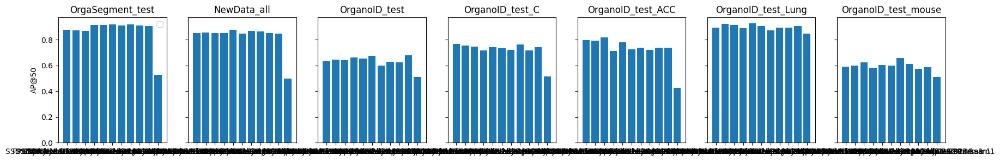

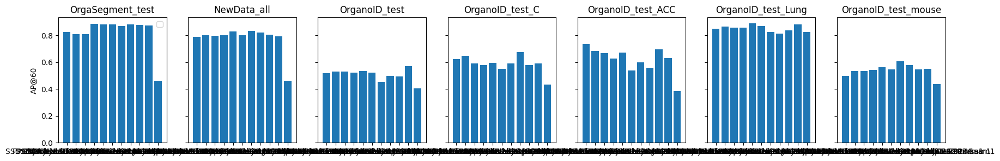

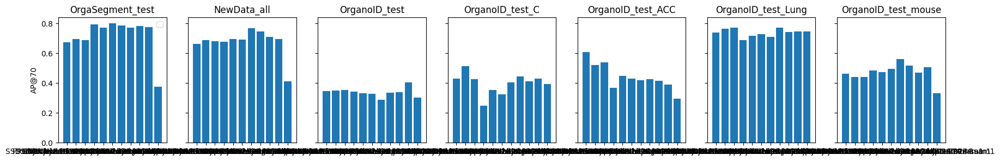

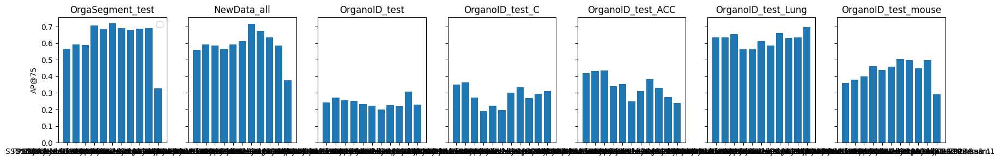

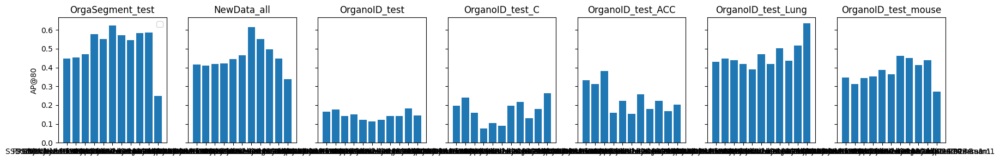

...

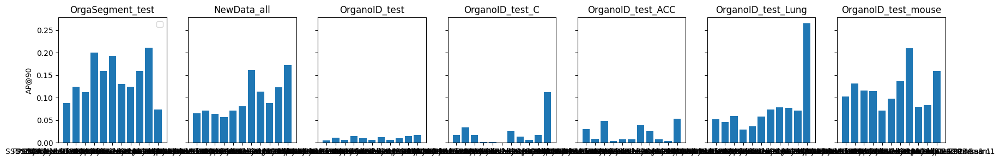

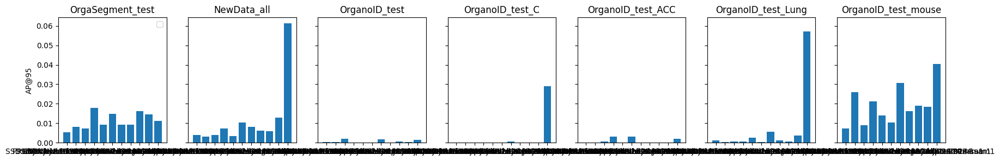

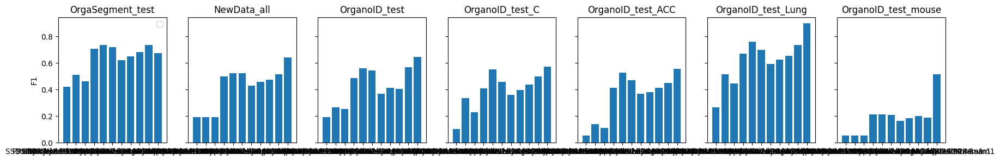

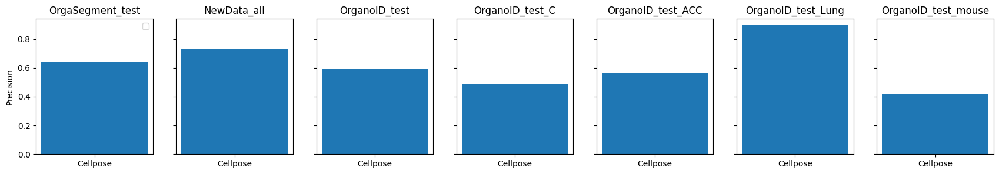

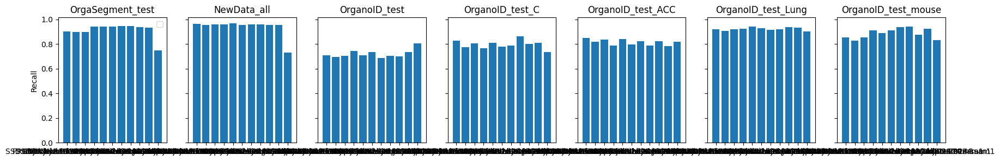

In [39]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5

datasets = [
    "OrgaSegment_test", 
    "NewData_all", 
    "OrganoID_test", 
    "OrganoID_test_C", 
    "OrganoID_test_ACC", 
    "OrganoID_test_Lung", 
    "OrganoID_test_mouse"
]

ds2name = {
    "OrgaSegment_test": "OrgaSegment", 
    "NewData_all": "Ours", 
    "OrganoID_test": "PDAC", 
    "OrganoID_test_C": "Colon", 
    "OrganoID_test_ACC": "ACC", 
    "OrganoID_test_Lung": "Lung", 
    "OrganoID_test_mouse": "Mouse"
}

metrics = [
    'AP@50',
    'AP@60',
    'AP@70',
    'AP@75', 
    'AP@80',
    'AP@85', 
    'AP@90',
    'AP@95', 
]


results = []
columns = ['dataset', 'model'] + [name for name in metrics] + ['F1', 'Prec', 'Recall']
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in ['cellpose_diam_[None]',
                  'cellpose_diam_[30]',
                  'cellpose_diam_[100]',
                  'cellpose_diam_[300]',
                  'cellpose_diam_[100,300]',
                  'SSD_objects_2024_sam1',
                  'SSD_objects_dataset_2024_sam1',
                  'SSD_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs5_objects_2024_sam1',
                  'FRCNNv2_bs10_objects_2024_sam1',
                  'FRCNNv2_bs20_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs100_objects_2024_sam1',
                  ]:
        if (results_dir / model / f'mean_detection_AP_{dataset}.csv').exists():
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_AP_{dataset}.csv')
            # print(metrics_df)

            data = [dataset, model.replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
            for i, metric_name in enumerate(metrics):
                v = metrics_df.iloc[i].item()
                data.append(v)
                # print(v)
                
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_metrics_{dataset}.csv')
            metrics_df = metrics_df.max()
            data.extend([metrics_df['f1'], metrics_df['precision'], metrics_df['recall']])
            results.append(data)

results = pd.DataFrame(data=results, columns=columns)


# Summarize best cellpose
cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
not_cellpose_df = results[results.model.apply(lambda x: not x.startswith('cellpose'))]
# print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    AP_50 = pd.NamedAgg('AP@50', 'max'),
    AP_60 = pd.NamedAgg('AP@60', 'max'),
    AP_70 = pd.NamedAgg('AP@70', 'max'),
    AP_75 = pd.NamedAgg('AP@75', 'max'),
    AP_80 = pd.NamedAgg('AP@80', 'max'),
    AP_85 = pd.NamedAgg('AP@85', 'max'),
    AP_90 = pd.NamedAgg('AP@90', 'max'),
    AP_95 = pd.NamedAgg('AP@95', 'max'),
    F1 = pd.NamedAgg('F1', 'max'),
    Prec = pd.NamedAgg('Prec', 'max'),
    Recall = pd.NamedAgg('Recall', 'max'),
).rename(columns={
    'Prec': 'Precision',
    'AP_50': 'AP@50',
    'AP_60': 'AP@60',
    'AP_70': 'AP@70',
    'AP_75': 'AP@75',
    'AP_80': 'AP@80',
    'AP_85': 'AP@85',
    'AP_90': 'AP@90',
    'AP_95': 'AP@95',
})
cellpose_best['model'] = 'Cellpose'  #  (best)'

results = pd.concat([
    not_cellpose_df,
    cellpose_best,
], axis=0, ignore_index=True)



for metric_name in metrics + ['F1', 'Precision', 'Recall']:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
        ax[i].set_title(dataset)
        ax[i].bar(df['model'].values.flatten(), 
                      df[metric_name].values.flatten())
        
        if metric_name in ['iou']:
            ax[i].set_ylim(0.7, 1)
        if metric_name in ['dice']:
            ax[i].set_ylim(0.75, 1)
        if i==0:
            ax[i].legend()


In [ ]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5

datasets = ["OrgaSegment_test", "NewData_all", "OrganoID_test", "OrganoID_test_C", "OrganoID_test_ACC", "OrganoID_test_Lung", "OrganoID_test_mouse"]
metrics = [
    ('hausdorff_scores', 'hausdorff'), 
    ('hausdorff_95_scores', 'hausdorff 95'), 
    ('masd_scores', 'masd'), 
    ('assd_scores', 'assd'), 
    ('iou_scores_no_thres', 'iou'), 
    ('dice_scores_no_thres', 'dice')
]


results = []
columns = ['dataset', 'model'] + [name for m, name in metrics]
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in ['gt_sam1_sd_0_bias_0',
                  'gt_sam2_sd_0_bias_0',
                  'gt_sam1_sd_2_bias_0',
                  'gt_sam2_sd_2_bias_0',
                #   'cellpose_diam_[None]',
                  'cellpose_diam_[30]',
                #   'cellpose_diam_[100]',
                #   'cellpose_diam_[300]',
                #   'cellpose_diam_[100,300]',
                  'SSD_objects_2024_sam1',
                  'SSD_objects_dataset_2024_sam1',
                  'SSD_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs5_objects_2024_sam1',
                  'FRCNNv2_bs10_objects_2024_sam1',
                  'FRCNNv2_bs20_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs100_objects_2024_sam1',
                  ]:
        metrics_df = pd.read_csv(results_dir / model / f'mean_segmentation_AP_{dataset}.csv')
        # print(metrics_df)

        data = [dataset, model.replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
        for i, (metric, metric_name) in enumerate(metrics):
            v = metrics_df[metrics_df['iou_thres']==iou_thres][metric].item()
            data.append(v)
        results.append(data)

results = pd.DataFrame(data=results, columns=columns)

for _, metric_name in metrics:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
        ax[i].set_title(dataset)
        ax[i].bar(df['model'].values.flatten(), 
                      df[metric_name].values.flatten())
        
        if metric_name in ['iou']:
            ax[i].set_ylim(0.7, 1)
        if metric_name in ['dice']:
            ax[i].set_ylim(0.75, 1)
        if i==0:
            ax[i].legend()

results.groupby('dataset')

FileNotFoundError: [Errno 2] No such file or directory: '/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/results/FRCNNv2_bs50_objects_2024_sam1/mean_segmentation_AP_OrgaSegment_test.csv'

In [ ]:
cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    hausdorff = pd.NamedAgg('hausdorff', 'min'),
    hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
    masd = pd.NamedAgg('masd', 'min'),
    assd = pd.NamedAgg('assd', 'min'),
    iou = pd.NamedAgg('iou', 'max'),
    dice = pd.NamedAgg('dice', 'max'),
).rename(columns={'hausdorff_95': 'hausdorff 95'})
cellpose_best['model'] = 'Cellpose (best)'

cellpose_best = pd.concat([
    cellpose_best,
    results[results.model.apply(lambda x: not x.startswith('cellpose'))]
], axis=0, ignore_index=True)

cellpose_best.set_index(['dataset', 'model']).sort_index()

<class 'pandas.core.frame.DataFrame'>


hausdorff  hausdorff 95      masd  \
dataset             model                                                    
NewData_all         Cellpose (best)      10.184398      8.680299  2.359745   
                    gt sam1 sd 0 bias 0   7.332467      4.875928  1.173381   
                    gt sam1 sd 2 bias 0   7.365980      4.914664  1.186703   
                    gt sam2 sd 0 bias 0   6.808789      4.204114  0.952863   
                    gt sam2 sd 2 bias 0   6.863208      4.232033  0.970275   
OrgaSegment_test    Cellpose (best)       8.043441      6.934884  1.929027   
                    gt sam1 sd 0 bias 0   4.698090      3.569757  1.283963   
                    gt sam1 sd 2 bias 0   4.852667      3.693674  1.320741   
                    gt sam2 sd 0 bias 0   4.425360      3.340120  1.114230   
                    gt sam2 sd 2 bias 0   4.640930      3.506885  1.178339   
OrganoID_test       Cellpose (best)       7.519058      6.470903  2.420960   
                    gt sam1 sd 0 bias 0   4.887008      3.781296  1.348801   
                    gt sam1 sd 2 bias 0   4.996387      3.939404  1.376294   
                    gt sam2 sd 0 bias 0   4.693971      3.561760  1.263943   
                    gt sam2 sd 2 bias 0   5.104312      3.933095  1.372229   
OrganoID_test_ACC   Cellpose (best)       7.035056      5.898470  2.124828   
                    gt sam1 sd 0 bias 0   5.577382      4.338038  1.196395   
                    gt sam1 sd 2 bias 0   5.569912      4.367818  1.190986   
                    gt sam2 sd 0 bias 0   5.912745      4.766654  1.257115   
                    gt sam2 sd 2 bias 0   6.280563      4.971130  1.319310   
OrganoID_test_C     Cellpose (best)       6.305906      5.344344  2.018479   
                    gt sam1 sd 0 bias 0   3.167904      2.377503  0.904880   
                    gt sam1 sd 2 bias 0   3.229613      2.423172  0.920078   
                    gt sam2 sd 0 bias 0   3.677398      2.666085  0.920063   
                    gt sam2 sd 2 bias 0   3.914683      2.979505  0.980458   
OrganoID_test_Lung  Cellpose (best)       7.188648      5.883940  2.286541   
                    gt sam1 sd 0 bias 0   3.643896      2.627040  0.861580   
                    gt sam1 sd 2 bias 0   3.765046      2.744070  0.920458   
                    gt sam2 sd 0 bias 0   3.377490      2.399668  0.861547   
                    gt sam2 sd 2 bias 0   3.416086      2.447085  0.881922   
OrganoID_test_mouse Cellpose (best)      16.667366     14.957546  4.588059   
                    gt sam1 sd 0 bias 0  12.375994      8.703545  3.525182   
                    gt sam1 sd 2 bias 0  12.360431      8.651893  3.496240   
                    gt sam2 sd 0 bias 0  12.009549      8.449845  2.987266   
                    gt sam2 sd 2 bias 0  12.074880      8.568655  2.993705   

                                             assd       iou      dice  
dataset             model                                              
NewData_all         Cellpose (best)      2.401044  0.868216  0.925412  
                    gt sam1 sd 0 bias 0  1.192598  0.916019  0.955011  
                    gt sam1 sd 2 bias 0  1.206217  0.915009  0.954395  
                    gt sam2 sd 0 bias 0  0.974931  0.933165  0.964617  
                    gt sam2 sd 2 bias 0  0.992956  0.931131  0.963410  
OrgaSegment_test    Cellpose (best)      1.989715  0.806239  0.887596  
                    gt sam1 sd 0 bias 0  1.288072  0.848422  0.916187  
                    gt sam1 sd 2 bias 0  1.326168  0.843224  0.912785  
                    gt sam2 sd 0 bias 0  1.121425  0.869972  0.928967  
                    gt sam2 sd 2 bias 0  1.186150  0.857922  0.921206  
OrganoID_test       Cellpose (best)      2.444212  0.768368  0.864547  
                    gt sam1 sd 0 bias 0  1.352981  0.850041  0.916614  
                    gt sam1 sd 2 bias 0  1.382283  0.849239  0.916085  
                    gt sam2 sd 0 bias 0  1.270395  0.860266  0.923205  
  

##### Detection performance of baseline methods

/tmp/ipykernel_36656/1391968153.py:87: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[i].legend()


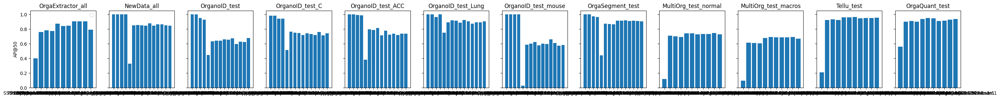

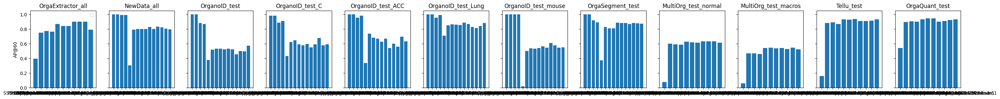

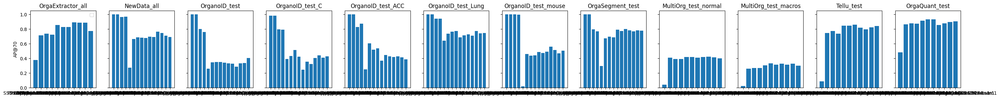

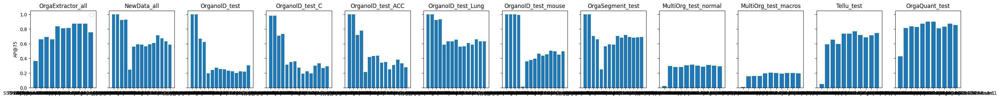

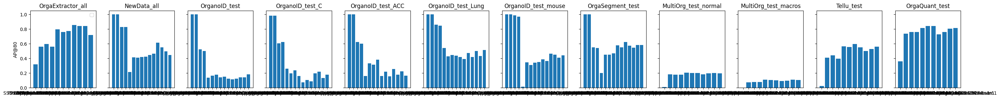

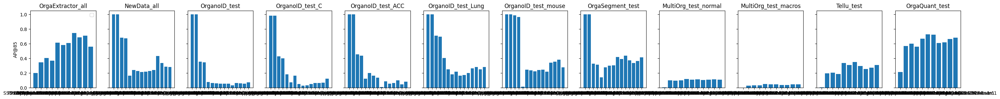

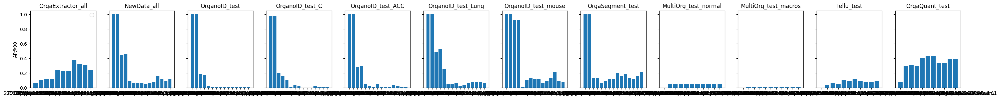

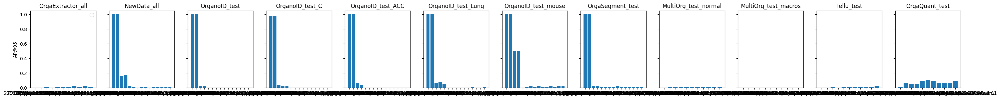

In [60]:
# Segmentation metrics: MASD, ASSD, hausdorff, hausdorff95, IoU, dice
iou_thres = 0.5

datasets = [
    "OrgaExtractor_all", 
    "NewData_all", 
    "OrganoID_test", 
    "OrganoID_test_C", 
    "OrganoID_test_ACC", 
    "OrganoID_test_Lung", 
    "OrganoID_test_mouse",
    "OrgaSegment_test",
    "MultiOrg_test_normal",
    "MultiOrg_test_macros",
    "Tellu_test",
    "OrgaQuant_test",
]
metrics = [
    'AP@50',
    'AP@60',
    'AP@70',
    'AP@75', 
    'AP@80',
    'AP@85', 
    'AP@90',
    'AP@95', 
]


results = []
columns = ['dataset', 'model'] + [name for name in metrics]
for j, dataset in enumerate(datasets):
    # ax[0, j].set_title(dataset)
    for model in ['gt_sam1_sd_0_bias_0',
                  'gt_sam2_sd_0_bias_0',
                  'gt_sam1_sd_2_bias_0',
                  'gt_sam2_sd_2_bias_0',
                #   'cellpose_diam_[None]',
                  'cellpose_diam_[30]',
                #   'cellpose_diam_[100]',
                #   'cellpose_diam_[300]',
                #   'cellpose_diam_[100,300]',
                  'SSD_objects_2024_sam1',
                  'SSD_objects_dataset_2024_sam1',
                  'SSD_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_2024_sam1',
                  'FRCNNv2_bs50_objects_dataset_patchsize_2024_sam1',
                  'FRCNNv2_bs5_objects_2024_sam1',
                  'FRCNNv2_bs10_objects_2024_sam1',
                  'FRCNNv2_bs20_objects_2024_sam1',
                  'FRCNNv2_bs50_objects_2024_sam1',
                  'FRCNNv2_bs100_objects_2024_sam1',
                  ]:
        if (results_dir / model / f'mean_detection_AP_{dataset}.csv').exists():
            metrics_df = pd.read_csv(results_dir / model / f'mean_detection_AP_{dataset}.csv')
            # print(metrics_df)

            data = [dataset, model.replace('_', ' ').replace('[', '').replace(']', '').replace(',', ' \& ')]
            for i, metric_name in enumerate(metrics):
                v = metrics_df.iloc[i].item()
                data.append(v)
                # print(v)
            results.append(data)

results = pd.DataFrame(data=results, columns=columns)

for metric_name in metrics:
    fig, ax = plt.subplots(1, len(datasets), 
                           sharey=True,
                           figsize=(3*len(datasets), 3), 
                           dpi=100)
    ax[0].set_ylabel(metric_name)

    for i, dataset in enumerate(datasets):
        df = results[results.dataset==dataset]
        # df = df[df.model.apply(lambda x: x.startswith('cellpose'))]
        ax[i].set_title(dataset)
        ax[i].bar(df['model'].values.flatten(), 
                      df[metric_name].values.flatten())
        
        if metric_name in ['iou']:
            ax[i].set_ylim(0.7, 1)
        if metric_name in ['dice']:
            ax[i].set_ylim(0.75, 1)
        if i==0:
            ax[i].legend()


In [ ]:
cellpose_df = results[results.model.apply(lambda x: x.startswith('cellpose'))]
print(type(cellpose_df))

cellpose_best = cellpose_df.groupby('dataset', as_index=False).aggregate(
    hausdorff = pd.NamedAgg('hausdorff', 'min'),
    hausdorff_95 = pd.NamedAgg('hausdorff 95', 'min'),
    masd = pd.NamedAgg('masd', 'min'),
    assd = pd.NamedAgg('assd', 'min'),
    iou = pd.NamedAgg('iou', 'max'),
    dice = pd.NamedAgg('dice', 'max'),
).rename(columns={'hausdorff_95': 'hausdorff 95'})
cellpose_best['model'] = 'Cellpose (best)'

cellpose_best = pd.concat([
    cellpose_best,
    results[results.model.apply(lambda x: not x.startswith('cellpose'))]
], axis=0, ignore_index=True)

cellpose_best.set_index(['dataset', 'model']).sort_index()

<class 'pandas.core.frame.DataFrame'>


hausdorff  hausdorff 95      masd  \
dataset             model                                                    
NewData_all         Cellpose (best)      10.184398      8.680299  2.359745   
                    gt sam1 sd 0 bias 0   7.332467      4.875928  1.173381   
                    gt sam1 sd 2 bias 0   7.365980      4.914664  1.186703   
                    gt sam2 sd 0 bias 0   6.808789      4.204114  0.952863   
                    gt sam2 sd 2 bias 0   6.863208      4.232033  0.970275   
OrgaSegment_test    Cellpose (best)       8.043441      6.934884  1.929027   
                    gt sam1 sd 0 bias 0   4.698090      3.569757  1.283963   
                    gt sam1 sd 2 bias 0   4.852667      3.693674  1.320741   
                    gt sam2 sd 0 bias 0   4.425360      3.340120  1.114230   
                    gt sam2 sd 2 bias 0   4.640930      3.506885  1.178339   
OrganoID_test       Cellpose (best)       7.519058      6.470903  2.420960   
                    gt sam1 sd 0 bias 0   4.887008      3.781296  1.348801   
                    gt sam1 sd 2 bias 0   4.996387      3.939404  1.376294   
                    gt sam2 sd 0 bias 0   4.693971      3.561760  1.263943   
                    gt sam2 sd 2 bias 0   5.104312      3.933095  1.372229   
OrganoID_test_ACC   Cellpose (best)       7.035056      5.898470  2.124828   
                    gt sam1 sd 0 bias 0   5.577382      4.338038  1.196395   
                    gt sam1 sd 2 bias 0   5.569912      4.367818  1.190986   
                    gt sam2 sd 0 bias 0   5.912745      4.766654  1.257115   
                    gt sam2 sd 2 bias 0   6.280563      4.971130  1.319310   
OrganoID_test_C     Cellpose (best)       6.305906      5.344344  2.018479   
                    gt sam1 sd 0 bias 0   3.167904      2.377503  0.904880   
                    gt sam1 sd 2 bias 0   3.229613      2.423172  0.920078   
                    gt sam2 sd 0 bias 0   3.677398      2.666085  0.920063   
                    gt sam2 sd 2 bias 0   3.914683      2.979505  0.980458   
OrganoID_test_Lung  Cellpose (best)       7.188648      5.883940  2.286541   
                    gt sam1 sd 0 bias 0   3.643896      2.627040  0.861580   
                    gt sam1 sd 2 bias 0   3.765046      2.744070  0.920458   
                    gt sam2 sd 0 bias 0   3.377490      2.399668  0.861547   
                    gt sam2 sd 2 bias 0   3.416086      2.447085  0.881922   
OrganoID_test_mouse Cellpose (best)      16.667366     14.957546  4.588059   
                    gt sam1 sd 0 bias 0  12.375994      8.703545  3.525182   
                    gt sam1 sd 2 bias 0  12.360431      8.651893  3.496240   
                    gt sam2 sd 0 bias 0  12.009549      8.449845  2.987266   
                    gt sam2 sd 2 bias 0  12.074880      8.568655  2.993705   

                                             assd       iou      dice  
dataset             model                                              
NewData_all         Cellpose (best)      2.401044  0.868216  0.925412  
                    gt sam1 sd 0 bias 0  1.192598  0.916019  0.955011  
                    gt sam1 sd 2 bias 0  1.206217  0.915009  0.954395  
                    gt sam2 sd 0 bias 0  0.974931  0.933165  0.964617  
                    gt sam2 sd 2 bias 0  0.992956  0.931131  0.963410  
OrgaSegment_test    Cellpose (best)      1.989715  0.806239  0.887596  
                    gt sam1 sd 0 bias 0  1.288072  0.848422  0.916187  
                    gt sam1 sd 2 bias 0  1.326168  0.843224  0.912785  
                    gt sam2 sd 0 bias 0  1.121425  0.869972  0.928967  
                    gt sam2 sd 2 bias 0  1.186150  0.857922  0.921206  
OrganoID_test       Cellpose (best)      2.444212  0.768368  0.864547  
                    gt sam1 sd 0 bias 0  1.352981  0.850041  0.916614  
                    gt sam1 sd 2 bias 0  1.382283  0.849239  0.916085  
                    gt sam2 sd 0 bias 0  1.270395  0.860266  0.923205  
  

### debugging embeddings dataset

In [20]:
backbone_name = 'FM_concat'

237264it [01:53, 2096.88it/s]


237264


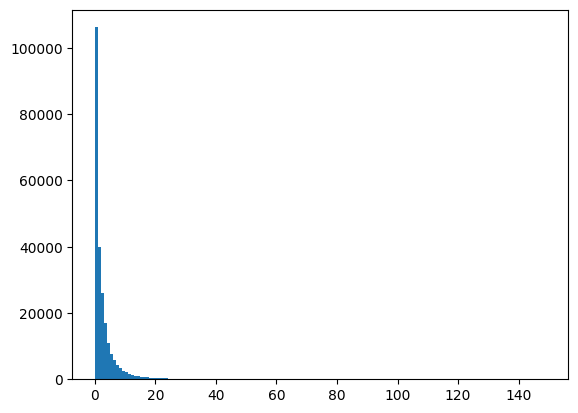

In [65]:
train_data = models.embeddings_datamodule.EmbeddingDataset(data_split='train', data_split_dirs=["MultiOrg_train_normal", "MultiOrg_train_macros", "OrgaSegment_train", "Tellu_train", "OrgaQuant_train"], backbone_name=backbone_name, decoder='FRCNNv2', num_queries=200)
plt.hist(train_data.metadata[['n_objects']], bins=np.arange(150))
print(len(train_data))

0it [00:00, ?it/s]


41620


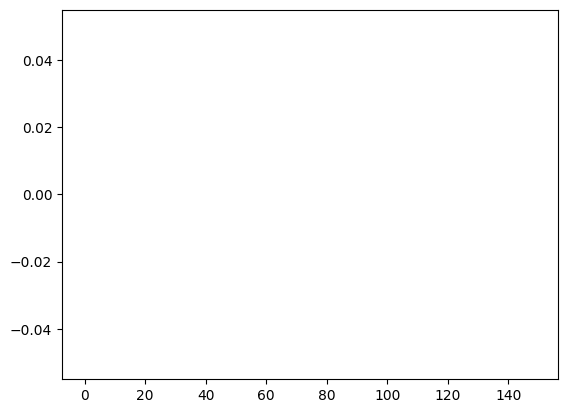

In [66]:
train_data_oi = models.embeddings_datamodule.EmbeddingDataset(data_split='train', data_split_dirs=["open_images_v4_5/original_data"], backbone_name=backbone_name, decoder='FRCNNv2', num_queries=200)
plt.hist(train_data_oi.metadata[['n_objects']], bins=np.arange(150))
print(len(train_data_oi))

23172it [00:57, 401.99it/s] 


23172


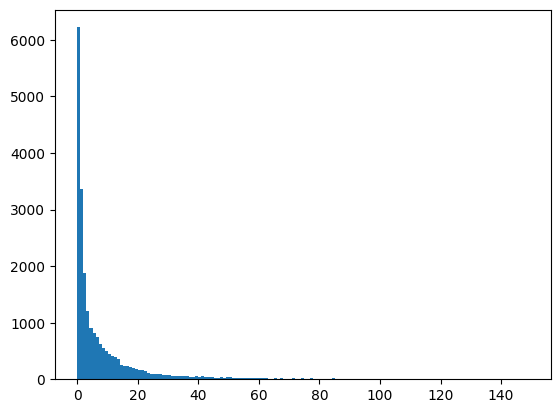

In [67]:
train_data_neurips = models.embeddings_datamodule.EmbeddingDataset(data_split='train', data_split_dirs=["NeurIPSCellSeg_train"], backbone_name=backbone_name, decoder='FRCNNv2', num_queries=200)
plt.hist(train_data_neurips.metadata[['n_objects']], bins=np.arange(150))
print(len(train_data_neurips))

0it [00:00, ?it/s]

23172it [00:03, 6144.45it/s] 


64792


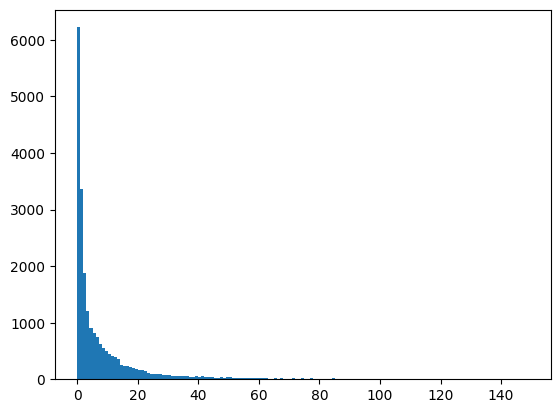

In [21]:
train_data_combined = models.embeddings_datamodule.EmbeddingDataset(data_split='train', data_split_dirs=["open_images_v4_5/original_data","NeurIPSCellSeg_train"], backbone_name=backbone_name, decoder='FRCNNv2', num_queries=200)
plt.hist(train_data_combined.metadata[['n_objects']], bins=np.arange(150))
print(len(train_data_combined))

In [3]:
import models.detr_own_impl_model

In [4]:
model = models.detr_own_impl_model.DetectionTransformer(backbone_name='SAM_large',)

n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Num trainable params (total):", n_parameters)

Num trainable params (total): 4929542


In [5]:
model = models.detr_own_impl_model.DetectionTransformer(backbone_name='SAM2_large',)

n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Num trainable params (total):", n_parameters)

Num trainable params (total): 4929542


In [6]:
model = models.detr_own_impl_model.DetectionTransformer(backbone_name='FM_concat',)

n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Num trainable params (total):", n_parameters)

Num trainable params (total): 5060870


In [7]:
model = models.detr_own_impl_model.DetectionTransformer(backbone_name='SAM_large', num_layers_low_res=12)

n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Num trainable params (total):", n_parameters)

Num trainable params (total): 9674246


In [8]:
model = models.detr_own_impl_model.DetectionTransformer(backbone_name='SAM2_large', 
                                                        num_layers_low_res=11, 
                                                        num_layers_medium_res=6, 
                                                        num_layers_high_res=4)

n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Num trainable params (total):", n_parameters)

Num trainable params (total): 9610854


In [9]:
model = models.detr_own_impl_model.DetectionTransformer(backbone_name='FM_concat', 
                                                        num_layers_low_res=11, 
                                                        num_layers_medium_res=6, 
                                                        num_layers_high_res=4)

n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Num trainable params (total):", n_parameters)

Num trainable params (total): 9742182


In [38]:
import models.embeddings_datamodule

backbone_name = 'SAM2_large'

datamodule = models.embeddings_datamodule.EmbeddingDataModule(train_dirs=["open_images_v4_5/original_data","NeurIPSCellSeg_train"], val_dirs=['NeurIPSCellSeg_val'], batch_size=2, batches_per_epoch=5,use_sampler=True,sampling_groups=['n_objects'], backbone_name=backbone_name, decoder='DETR_own_implementation', num_queries=200)

TypeError: EmbeddingDataModule.__init__() missing 3 required positional arguments: 'test_dirs', 'max_oversampling', and 'n_validation_samples'

In [70]:
res = train_data[1000]

In [71]:
res = train_data_oi[2980]

In [72]:
res = train_data_neurips[0]

In [73]:
res = train_data_combined[460]

In [74]:
res[0][0].shape, res[0][1].shape, res[0][2].shape, res[1], res[2:]

(torch.Size([1, 512, 64, 64]),
 torch.Size([1, 64, 128, 128]),
 torch.Size([1, 32, 256, 256]),
 {'boxes': tensor([], size=(0, 4)),
  'labels': tensor([], dtype=torch.int64),
  'image_id': tensor([460]),
  'area': tensor([]),
  'is_crowd': tensor([], dtype=torch.bool),
  'orig_size': tensor([512, 512]),
  'size': tensor([512, 512])},
 ('im_cell_00009_512', array([ 12, 512, 509]), (512, 512), 12))

### weighted sampling distributions

237264it [02:40, 1475.50it/s]


(array([1.06195e+05, 3.98750e+04, 2.61750e+04, 1.69210e+04, 1.09920e+04,
        7.74000e+03, 5.86600e+03, 4.37800e+03, 3.39200e+03, 2.55700e+03,
        2.04500e+03, 1.69000e+03, 1.33400e+03, 1.10700e+03, 9.35000e+02,
        7.55000e+02, 6.57000e+02, 5.66000e+02, 5.28000e+02, 4.24000e+02,
        3.74000e+02, 3.13000e+02, 2.51000e+02, 2.39000e+02, 1.88000e+02,
        1.65000e+02, 1.45000e+02, 1.21000e+02, 1.03000e+02, 9.90000e+01,
        8.50000e+01, 8.20000e+01, 7.70000e+01, 6.20000e+01, 6.60000e+01,
        2.70000e+01, 3.80000e+01, 4.50000e+01, 3.20000e+01, 3.80000e+01,
        1.80000e+01, 2.60000e+01, 2.60000e+01, 2.50000e+01, 1.00000e+01,
        2.50000e+01, 1.90000e+01, 1.60000e+01, 1.50000e+01, 1.60000e+01,
        1.50000e+01, 1.40000e+01, 8.00000e+00, 2.00000e+01, 1.30000e+01,
        1.00000e+01, 1.90000e+01, 1.00000e+01, 1.00000e+01, 1.00000e+01,
        8.00000e+00, 9.00000e+00, 3.00000e+00, 7.00000e+00, 7.00000e+00,
        0.00000e+00, 5.00000e+00, 3.00000e+00, 9.00

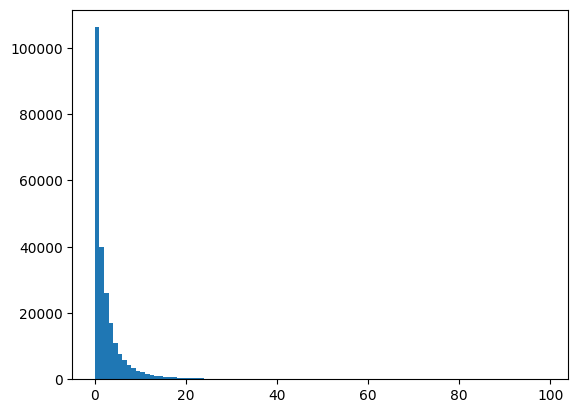

In [3]:
train_data = models.image_datamodule.ImageDataset(data_split='train', data_split_dirs=["MultiOrg_train_normal", "MultiOrg_train_macros", "OrgaSegment_train", "Tellu_train", "OrgaQuant_train"], backbone_name='FRCNN')
plt.hist(train_data.metadata[['n_objects']], bins=np.arange(100))

23172it [00:02, 10908.30it/s]


(array([6.221e+03, 3.370e+03, 1.876e+03, 1.205e+03, 9.020e+02, 8.210e+02,
        7.480e+02, 6.240e+02, 5.460e+02, 4.980e+02, 4.460e+02, 4.080e+02,
        3.990e+02, 3.520e+02, 2.590e+02, 2.420e+02, 2.330e+02, 2.150e+02,
        1.940e+02, 1.840e+02, 1.600e+02, 1.560e+02, 1.470e+02, 1.050e+02,
        1.000e+02, 9.800e+01, 9.800e+01, 9.900e+01, 7.300e+01, 7.900e+01,
        7.600e+01, 6.400e+01, 6.300e+01, 6.200e+01, 5.700e+01, 5.000e+01,
        5.900e+01, 4.000e+01, 4.000e+01, 5.300e+01, 4.800e+01, 5.000e+01,
        4.800e+01, 4.800e+01, 3.500e+01, 2.600e+01, 2.700e+01, 3.200e+01,
        1.700e+01, 3.200e+01, 3.500e+01, 3.000e+01, 2.100e+01, 3.000e+01,
        2.200e+01, 1.900e+01, 2.500e+01, 2.200e+01, 2.300e+01, 1.700e+01,
        2.200e+01, 2.600e+01, 1.600e+01, 1.000e+01, 1.300e+01, 2.000e+01,
        1.300e+01, 1.600e+01, 1.300e+01, 9.000e+00, 1.000e+01, 1.500e+01,
        1.100e+01, 1.000e+01, 1.700e+01, 1.000e+01, 8.000e+00, 1.500e+01,
        5.000e+00, 9.000e+00, 4.000e+0

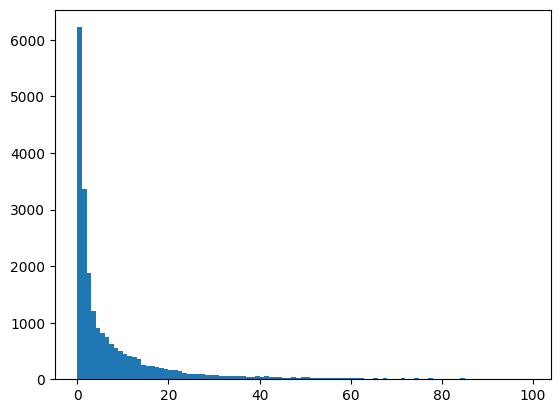

In [14]:
train_data = models.image_datamodule.ImageDataset(data_split='train', data_split_dirs=["open_images_v4_5/original_data", "NeurIPSCellSeg_train"], backbone_name='FRCNN')
plt.hist(train_data.metadata[['n_objects']], bins=np.arange(100))

start compute weights


Found Open Images samples in the data, assigning weight 0.5


(0,) weight 1.554602135339309e-07
(1,) weight 2.8697863157109323e-07
(2,) weight 5.155213157753646e-07
(3,) weight 8.025875422361694e-07
(4,) weight 1.0721928917900046e-06
(5,) weight 1.1779756253283608e-06
(6,) weight 1.292938487158535e-06
(7,) weight 1.5498685711451668e-06
(8,) weight 1.7712783670230478e-06
(9,) weight 1.942003992760209e-06
(10,) weight 2.168425982947498e-06
(11,) weight 2.370387226457314e-06
(12,) weight 2.4238546075052234e-06
(13,) weight 2.747494285211887e-06
(14,) weight 3.7340462872377766e-06
(15,) weight 3.996355323944562e-06
(16,) weight 4.150720980234267e-06
(17,) weight 4.4982232018352755e-06
(18,) weight 4.985144270075176e-06
(19,) weight 5.25607602388361e-06
(20,) weight 6.044487427466151e-06
(21,) weight 6.199474284580667e-06
(22,) weight 6.579033934657035e-06
(23,) weight 9.210647508519848e-06
(24,) weight 9.67117988394584e-06
(25,) weight 9.868550901985552e-06
(26,) we

(array([0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00096712, 0.00096712,
        0.00096712, 0.00096712, 0.00096712, 0.00

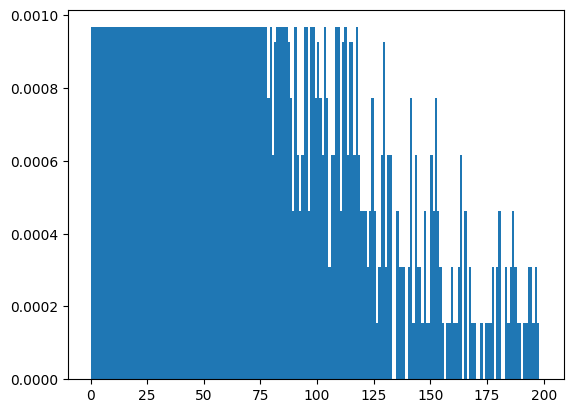

In [16]:
weights = models.image_datamodule.compute_weights(train_data.metadata, groups=['n_objects'], max_oversampling=10)
plt.hist(train_data.metadata[['n_objects']], bins=np.arange(200), weights=weights)

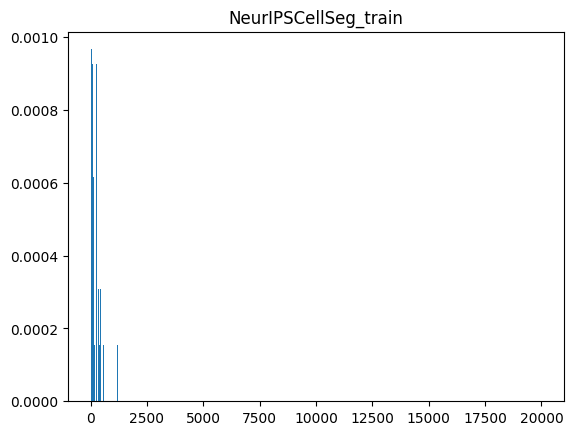

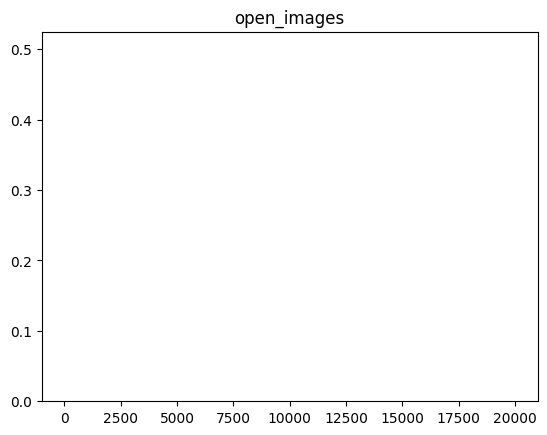

In [19]:
for ds in np.unique(train_data.metadata[['dataset']]):
    plt.figure()
    plt.title(ds)
    filter = (train_data.metadata[['dataset']].values==ds).flatten()
    plt.hist(train_data.metadata.loc[filter, ['n_objects']], bins=np.arange(200), weights=weights[filter])

In [2]:
image_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/orgasegment_test')

for ds_idx, ds in enumerate([dl.MultiOrg(split='test_macros'),
                             dl.OrganoID(split='test'),
                             dl.OrganoID(split='test_C'),
                             dl.OrganoID(split='test_Lung'),
                             dl.OrganoID(split='test_ACC'),
                             dl.OrganoID(split='test_only_mouse'),
                             dl.OrgaExtractor(split='all'),
                             dl.NewData(split='all'),
                             dl.OrgaSegment(split='test'),
                             dl.OrgaQuant(split='test'),
                             dl.Tellu(split='test'),
                             dl.MultiOrg(split='test_normal'),]):
    for i, (im, gt_mask, gt_boxes, im_path, im_ID) in enumerate(ds):
        im, flatfield = dl.normalize(im, correct_bg=False if str(ds).startswith('MultiOrg') else True)
        outfile = image_dir / f"{str(ds)}_{ds.split}__{im_ID}.png"
        assert not outfile.exists(), outfile
        cv2.imwrite(str(outfile), im)

In [ ]:
image_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/umamba_test/test_images')

for ds_idx, ds in enumerate([dl.MultiOrg(split='test_macros'),
                             dl.OrganoID(split='test'),
                             dl.OrganoID(split='test_C'),
                             dl.OrganoID(split='test_Lung'),
                             dl.OrganoID(split='test_ACC'),
                             dl.OrganoID(split='test_only_mouse'),
                             dl.OrgaExtractor(split='all'),
                             dl.NewData(split='all'),
                             dl.OrgaSegment(split='test'),
                             dl.OrgaQuant(split='test'),
                             dl.Tellu(split='test'),
                             dl.MultiOrg(split='test_normal'),]):
    for i, (im, gt_mask, gt_boxes, im_path, im_ID) in enumerate(ds):
        im, flatfield = dl.normalize(im, correct_bg=False if str(ds).startswith('MultiOrg') else True)
        outfile1 = image_dir / f"Dataset{ds_idx:03d}_{str(ds)}{ds.split}" / 'imagesTr' / f"image_{i:03d}_0000.png"
        outfile2 = image_dir / f"Dataset{ds_idx:03d}_{str(ds)}{ds.split}" / 'imagesTs' / f"image_{i:03d}_0000.png"
        outfile1.parent.mkdir(exist_ok=True, parents=True)
        outfile2.parent.mkdir(exist_ok=True, parents=True)
        cv2.imwrite(str(outfile1), im)
        cv2.imwrite(str(outfile2), im)

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [4]:
base_datadir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/original_data/')
results_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/results')


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax, color='red'):
    y_min, x_min, y_max, x_max = box
    
    # Calculate width and height of the box
    width = x_max - x_min
    height = y_max - y_min

    ax.add_patch(plt.Rectangle((x_min, y_min), width, height, edgecolor=color, facecolor=(0,0,0,0), lw=2))

def show_mask(contour, ax, random_color=False):
    if random_color:
        color = np.random.random(3)
    else:
        color = np.array([30/255, 184/255, 255/255])
    edgecolor = np.concatenate([color, np.array([1.0])], axis=0)
    facecolor = np.concatenate([color, np.array([0.4])], axis=0)

    contour = gpd.GeoSeries(contour)
    contour.plot(edgecolor=edgecolor, facecolor=facecolor, ax=ax)

def visualize(im, contours, boxes, random_color=True, box_color='red', format='yxyx_px', ax=None, **fig_kwargs):
    # Format boxes
    H, W = im.shape[:2]

    if format=='cycxhw_01':
        # boxes are in cycxhw format normalized by the longest image side. Converts to min/max coordinates in pixels.
        original_boxes = cxcywh_to_xyxy(boxes) * max(H, W)
    elif format=='cycxhw_px':
        # boxes are in cycxhw format in pixels. Converts to min/max coordinates in pixels.
        original_boxes = cxcywh_to_xyxy(boxes)
    elif format=='yxyx_01':
        # boxes are in min/max coordinates normalized by the longest image side. Converts to min/max coordinates in pixels.
        original_boxes = boxes * max(H, W)
    elif format=='yxyx_px':
        # boxes are in min/max coordinates in pixels. No conversion necessary.
        original_boxes = boxes
    else:
        raise ValueError(format)

    if ax is None:
        fig, ax = plt.subplots(1, 1, **fig_kwargs)
    
    ax.imshow(im)
    ax.axis(False)
    for i in range(original_boxes.shape[0]):
        show_mask(contours[i], ax, random_color=random_color)
        show_box(original_boxes[i], ax, color=box_color)

### Test mAP metric

In [27]:
from util.orgasegment import PredictorFromMasks

In [5]:
# # ssd_model = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200-last_epoch=799-val_loss=17.95.ckpt')
# ssd_model = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_full_data_09012025_True_32_200/SSD_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_full_data_09012025_True_32_200-last_epoch=799-val_loss=2.85.ckpt')
# samos_model = SAMOS(checkpoint_path='/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/DetectionHead_SAM_large_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_added_eval_True_32_200/DetectionHead_SAM_large_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_added_eval_True_32_200-last_epoch=799-val_loss=4.93.ckpt')
# rcnn_model = FasterRCNNPredictor(checkpoint_path='/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/FasterRCNN/FasterRCNNv2_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_FasterRCNN_16012025_True_16_200/FasterRCNNv2_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_FasterRCNN_16012025_True_16_200-last_epoch=649-val_loss=0.28.ckpt',
#                                  version_FasterRCNN='v2')
# cellpose_model = Cellpose(diameter=None)
# gtsam_model = GroundTruthSAM(sam_version='sam2', box_noise_std=0, box_noise_bias=0)
# pred_sam_model = PredictionSAM(sam_version='sam1', logging_name="FRCNNv2_default_MultiOrg_train_normal_MultiOrg_train_macros_OrgaSegment_train_Tellu_train_OrgaQuant_train_20022025_baseline_frcnn_v2_sampling_n_objects_dataset_50_batches_per_epoch_True_8_50_2024")

# pred_sam_model = CellSAM()
# pred_sam_model = PredictorFromMasks('AnyStar', scales=(20, 10))
pred_sam_model = Umamba('enc')

In [ ]:
plot_dir = results_dir / 'zeroshot' / 'visualizations'
plot_dir.mkdir(exist_ok=True, parents=True)

for ds in [dl.OrgaExtractor(split='test'),
           dl.Tellu(split='test'),
           dl.OrgaQuant(split='test'),
           dl.OrgaSegment(split='test'),
           dl.OrganoID(split='test'),
           dl.OrganoID(split='test_only_mouse'),
           dl.OrganoID(split='test_C'),
           dl.OrganoID(split='test_ACC'),
           dl.OrganoID(split='test_Lung'),
           dl.NewData(split='all'),
           dl.MultiOrg(split='train_normal')]:
    for idx in [0, 3]:
        im, gt_mask, gt_boxes, im_path, im_ID = ds[idx]
        im, flatfield = dl.normalize(im, correct_bg=False if str(ds).startswith('MultiOrg') else True)
        print(im.shape)

        for diameter in ([None],
                         [30],
                         [100],
                         [300],
                         [100, 300]):
            cellpose_model.diameter = diameter
            contours_cellpose, boxes_cellpose, scores_cellpose = cellpose_model.forward(im, patch_size=512, predict_masks=True, 
                                                                                        min_diameter=30/1.29 if str(ds).startswith('MultiOrg') else 10)
            
            # Visualize boxes
            fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
            plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
            plot_boxes(im, boxes_cellpose, format='yxyx_px', ax=ax, show_image=False, color='red')
            ax.axis(False)

            # Define custom line handles
            line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
            line_c = mlines.Line2D([], [], color='red', label='Cellpose', linewidth=2)

            # Add legend with custom handles
            plt.legend(handles=[line_a, line_c])
            plt.savefig(plot_dir / f'{str(ds)}_{ds.split}_idx_{idx}_cellpose_{diameter}_boxes.png', dpi=300)
            plt.savefig(plot_dir / f'{str(ds)}_{ds.split}_idx_{idx}_cellpose_{diameter}_boxes.pdf', dpi=300)
            plt.close('all')
            
            # Visualize masks
            fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
            ax.imshow(im)
            ax.axis(False)
            for i in range(boxes_cellpose.shape[0]):
                show_mask(contours_cellpose[i], ax, random_color=True)
            plt.savefig(plot_dir / f'{str(ds)}_{ds.split}_idx_{idx}_cellpose_{diameter}_masks.png', dpi=300)
            plt.savefig(plot_dir / f'{str(ds)}_{ds.split}_idx_{idx}_cellpose_{diameter}_masks.pdf', dpi=300)
            plt.close('all')

(1200, 1600, 3)
(1200, 1600, 3)
(960, 1280, 3)
(960, 1280, 3)
(450, 450, 3)
(450, 450, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1528, 1672, 3)
(1022, 1024, 3)
(1944, 2592, 3)
(1944, 2592, 3)
(1022, 1024, 3)
(1022, 1024, 3)
(750, 750, 3)
(700, 700, 3)
(1022, 1024, 3)
(1022, 1024, 3)
(2048, 2048, 3)
(2048, 2048, 3)
(5720, 6384, 3)


In [ ]:
1+1

In [6]:
# ds = dl.OrgaExtractor(split='test')
# ds = dl.Tellu(split='test')
# ds = dl.OrgaQuant(split='test')
# ds = dl.OrgaSegment(split='test')
# ds = dl.OrganoID(split='test')
# ds = dl.OrganoID(split='test_only_mouse')
# ds = dl.OrganoID(split='test_C')
# ds = dl.OrganoID(split='test_ACC')
# ds = dl.OrganoID(split='test_Lung')
ds = dl.NewData(split='all')
# ds = dl.MultiOrg(split='test_normal')
# ds = dl.MultiOrg(split='test_macros')

idx = 2
im, gt_mask, gt_boxes, im_path, im_ID = ds[idx]
# im2, gt_mask2, gt_boxes2, im_path2, im_ID2 = ds[idx]
im, flatfield = dl.normalize(im, correct_bg=False)
# im2, flatfield2 = dl.normalize(im2, correct_bg=False)
print(im.shape)

(2048, 2048, 3)


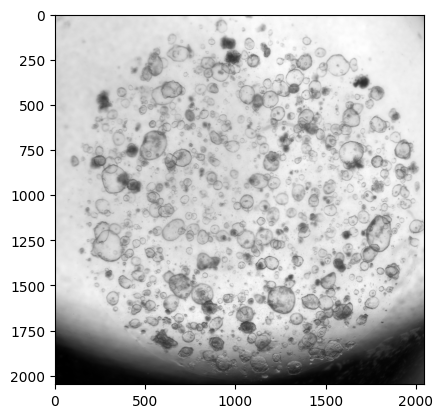

In [7]:
plt.imshow(im)

In [23]:
# contours_ssd, boxes_ssd, scores_ssd = ssd_model.forward(im, patch_size=512, predict_masks=True, min_diameter=30/1.29)
# contours_ssd, boxes_ssd, scores_ssd = ssd_model.set_threshold(0.5, predict_masks=True)
# contours_rcnn, boxes_rcnn, scores_rcnn = rcnn_model.forward(im, patch_size=512, predict_masks=True, min_diameter=30/1.29)
# contours_rcnn, boxes_rcnn, scores_rcnn = rcnn_model.set_threshold(0.5, predict_masks=True)
# contours_samos, boxes_samos, scores_samos = samos_model.forward(im, patch_size=512, predict_masks=True, min_diameter=30/1.29)
# contours_samos, boxes_samos, scores_samos = samos_model.set_threshold(0.9, predict_masks=True)
# cellpose_model.diameter = (100, 300)
# contours_cellpose, boxes_cellpose, scores_cellpose = cellpose_model.forward(im, patch_size=512, predict_masks=True, min_diameter=10)
# contours_cellpose, boxes_cellpose, scores_cellpose = cellpose_model.set_threshold(0.9, predict_masks=True)
# gtsam_model.box_noise_std = 5
# gtsam_model.box_noise_bias = 0
# contours_cellpose, boxes_cellpose, scores_cellpose = gtsam_model.forward(im, gt_boxes, patch_size=(512, 1024), predict_masks=True, min_diameter=10)
# contours_cellpose2, boxes_cellpose2, scores_cellpose2 = gtsam_model.forward(im2, gt_boxes2, patch_size=(512, 1024), predict_masks=True, min_diameter=10)
# contours_cellpose, boxes_cellpose, scores_cellpose = pred_sam_model.forward(f'{str(ds)}_{ds.split}', im_ID, predict_masks=False, min_diameter=10)
contours_cellpose, boxes_cellpose, scores_cellpose = pred_sam_model.forward(ds, idx, predict_masks=False, min_diameter=10)
# contours_cellpose, boxes_cellpose, scores_cellpose = pred_sam_model.forward(im, patch_size=(1024, 2048, 4096), predict_masks=True, min_diameter=10)
# contours_cellpose, boxes_cellpose, scores_cellpose = gtsam_model.set_threshold(0.9, predict_masks=True)

In [54]:
contours_cellpose, boxes_cellpose, scores_cellpose = pred_sam_model.set_threshold(0.0, predict_masks=True)

In [21]:
ds_name = f'{str(ds)}{ds.split}'
mask_dir = Path('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/umamba_test/evaluation/segs') / 'nnUNetTrainerUMambaEnc'
mask_file = list(mask_dir.glob(f'*_{ds_name}/image_{idx:03d}.png'))[0]
mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
mask = skimage.measure.label(mask)
mask.shape

(2048, 2048)

In [20]:
(mask[:, :, 2] == mask[:, :, 0]).all()

True

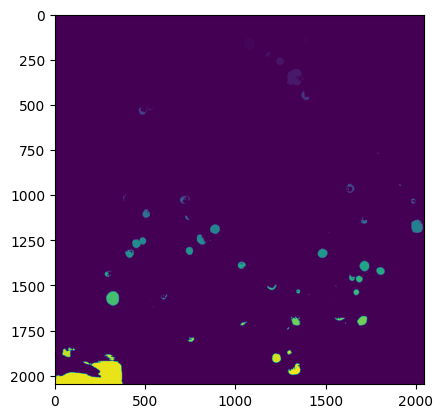

In [22]:
plt.imshow(mask)

In [24]:
boxes_cellpose

array([[ 126, 1368,  174, 1419],
       [1975, 1289, 1996, 1356],
       [1934, 1292, 1993, 1357],
       [1923,  156, 1939,  191],
       [1919,    0, 2047,  377],
       [ 942, 1620,  986, 1653],
       [ 519,  466,  555,  498],
       [ 512,  514,  531,  538],
       [ 430, 1367,  472, 1408],
       [ 308, 1286,  393, 1364],
       [1703, 1029, 1723, 1062],
       [1682, 1682, 1723, 1727],
       [1681, 1549, 1694, 1602],
       [1675, 1310, 1719, 1357],
       [1538,  287, 1610,  350],
       [1528, 1338, 1542, 1352],
       [1526, 1656, 1552, 1680],
       [1525, 1335, 1545, 1355],
       [1500, 1175, 1523, 1220],
       [1452, 1668, 1482, 1699],
       [1446, 1631, 1473, 1657],
       [1426,  278, 1453,  299],
       [1405, 1783, 1439, 1820],
       [1373, 1015, 1406, 1052],
       [1370, 1689, 1420, 1735],
       [1336,  411, 1350,  431],
       [1306,  391, 1347,  432],
       [1302, 1458, 1345, 1503],
       [1300,  420, 1334,  436],
       [1293,  728, 1328,  759],
       [12

In [25]:
len(scores_cellpose), len(gt_boxes)

(55, 363)

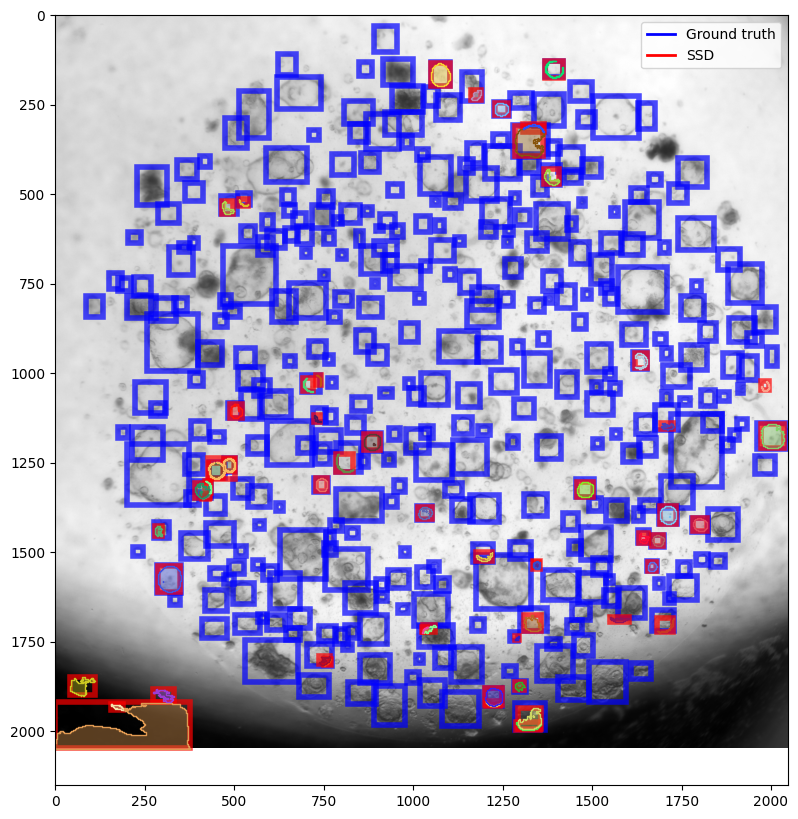

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
# i = 10
# plot_boxes(im, gt_boxes[i:i+1], format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_cellpose, format='yxyx_px', ax=ax, show_image=False, color='red')

# Plot mask predictions
for i in range(boxes_cellpose.shape[0]):
    show_mask(contours_cellpose[i], ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_c = mlines.Line2D([], [], color='red', label='SSD', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_c])

In [53]:
iou_thres = [0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]
# thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 0.975]
thresholds = [0.95, 0.975]
iou_matrix = pp.compute_iou_matrix_detection(boxes_cellpose, gt_boxes)
mAP_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_detection_all(
    iou_matrix, iou_thres, scores_cellpose, thresholds
)
mAP_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores

iou_matrix[:10, :10] [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
cost_matrix.shape (228, 363)
cost_matrix.shape (228, 363)
cost_matrix[:10, :10] [[-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]
 [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0.]]
row_ind, col_ind [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  2

([0.5980428418502148,
  0.5830628175531234,
  0.539949801911429,
  0.4872004273533451,
  0.3553369082591981,
  0.2060884166015704,
  0.052875642559272754,
  0.000931282522191613],
 [0.0, 0.0],
 [0.8370776129144657, 0.8370776129144657],
 [0.9089629633861215, 0.9089629633861215],
 [0.7411167512690355, 0.7411167512690355],
 [0.9605263157894737, 0.9605263157894737],
 [0.6033057851239669, 0.6033057851239669])

In [59]:
iou_thres = [0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 0.975]
# thresholds = [0.95, 0.975]
iou_matrix = pp.compute_iou_matrix_detection(boxes_cellpose, gt_boxes)
mAP_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_detection_all(
    iou_matrix, iou_thres, scores_cellpose, thresholds
)
mAP_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores

([0.8988737603074881,
  0.8700531931282185,
  0.7492780019972695,
  0.6312155004797192,
  0.437563627038787,
  0.24103952224217537,
  0.05431799216106645,
  0.000931282522191613],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [0.8127924307799258,
  0.8140593448376187,
  0.8137166112760973,
  0.8151871315935983,
  0.8152220726607609,
  0.8159061910950245,
  0.8181208429079629,
  0.8191993227105802,
  0.8207673265870226,
  0.8219701203756414,
  0.8295728523235139,
  0.8370776129144657],
 [0.8938612238358746,
  0.8946111618623602,
  0.8943720405640683,
  0.895285540091962,
  0.8952887071713503,
  0.8957603541655978,
  0.8971857128148022,
  0.8978319788873353,
  0.8987702933677536,
  0.8994357628683936,
  0.9043777105865567,
  0.9089629633861215],
 [0.6932270916334662,
  0.7409836065573769,
  0.7608200455580866,
  0.7705112960760998,
  0.7826086956521738,
  0.8015463917525772,
  0.8073878627968337,
  0.8122392211404728,
  0.8114285714285714,
  0.8017751479289942,
  0.7918

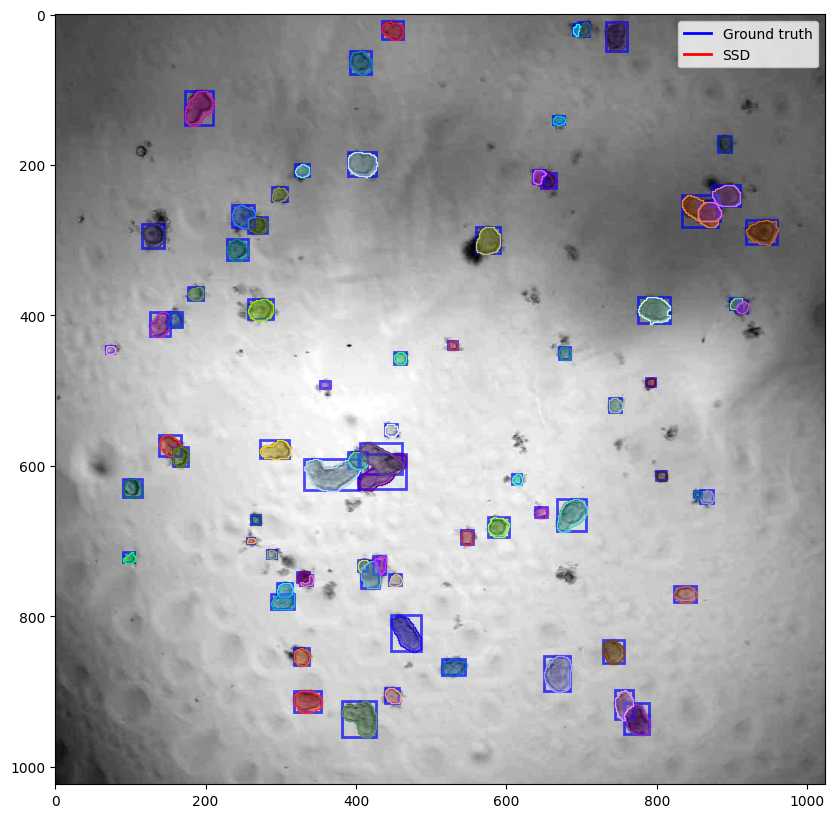

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
# i = 10
# plot_boxes(im, gt_boxes[i:i+1], format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
# plot_boxes(im, boxes_cellpose, format='yxyx_px', ax=ax, show_image=False, color='red')

# Plot mask predictions
gt_masks = pp.convert_mask_to_binary(gt_mask)
for i in range(gt_boxes.shape[0]):
    contour = pp.mask_to_contour(gt_masks[i])
    show_mask(contour, ax, random_color=True)

# show_mask(contours_cellpose[i], ax, random_color=True)

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_c = mlines.Line2D([], [], color='red', label='SSD', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_c])

In [93]:
# ds = dl.OrgaExtractor(split='test')
# ds = dl.Tellu(split='test')
# ds = dl.OrgaQuant(split='test')
# ds = dl.OrgaSegment(split='test')
# ds = dl.OrganoID(split='test')
# ds = dl.OrganoID(split='test_only_mouse')
# ds = dl.OrganoID(split='test_C')
# ds = dl.OrganoID(split='test_ACC')
# ds = dl.OrganoID(split='test_Lung')
ds = dl.NewData(split='all')
# ds = dl.MultiOrg(split='test_normal')
# ds = dl.MultiOrg(split='test_macros')

mAP_metric = torchmetrics.detection.MeanAveragePrecision(class_metrics=True, extended_summary=False, backend='faster_coco_eval', )
mAP_metric.warn_on_many_detections = False

mAP_metric.reset()

for im, gt_mask, gt_boxes, im_path, im_ID in ds:
#     im, flatfield = dl.normalize(im, correct_bg=False)
    contours_cellpose, boxes_cellpose, scores_cellpose = gtsam_model.forward(im, gt_boxes, patch_size=(512, 1024), predict_masks=False, min_diameter=10)
    contours_cellpose, boxes_cellpose, scores_cellpose = gtsam_model.set_threshold(0.0, predict_masks=True)
    mAP_metric.update(preds=[{'boxes': torch.from_numpy(boxes_cellpose), 
                        'scores': torch.from_numpy(scores_cellpose), 
                        'labels': torch.zeros(scores_cellpose.shape, dtype=torch.int)}], 
                target=[{'boxes': torch.from_numpy(gt_boxes), 
                        'labels': torch.zeros((gt_boxes.shape[0],), dtype=torch.int)}])
    print(mAP_metric.compute())

Error: The following operation failed in the TorchScript interpreter.
Traceback of TorchScript (most recent call last):
  File "/ictstr01/groups/peng/datasets/lion/data/venvs/sam_dh/lib/python3.11/site-packages/torchvision/transforms/_functional_tensor.py", line 909, in forward

    if not tensor.is_floating_point():
        raise TypeError(f"Input tensor should be a float tensor. Got {tensor.dtype}.")
        ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ <--- HERE

    if tensor.ndim < 3:
builtins.TypeError: Input tensor should be a float tensor. Got 27.


In [87]:
contours_cellpose, boxes_cellpose, scores_cellpose = gtsam_model.set_threshold(0.0, predict_masks=True)

In [55]:
contours_cellpose2, boxes_cellpose2, scores_cellpose2 = gtsam_model.set_threshold(0.0, predict_masks=True)

In [88]:
mAP_metric = torchmetrics.detection.MeanAveragePrecision(class_metrics=True, extended_summary=False, backend='faster_coco_eval', )
mAP_metric.warn_on_many_detections = False

In [89]:
mAP_metric.reset()

In [90]:
mAP_metric.update(preds=[{'boxes': torch.from_numpy(boxes_cellpose), 
                        'scores': torch.from_numpy(scores_cellpose), 
                        'labels': torch.zeros(scores_cellpose.shape, dtype=torch.int)}], 
                target=[{'boxes': torch.from_numpy(gt_boxes), 
                        'labels': torch.zeros((gt_boxes.shape[0],), dtype=torch.int)}])

In [91]:
res = mAP_metric.compute()
# res['map'], res['ious'].keys()
res

{'map': tensor(1.),
 'map_50': tensor(1.),
 'map_75': tensor(1.),
 'map_small': tensor(1.),
 'map_medium': tensor(1.),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.0132),
 'mar_10': tensor(0.1316),
 'mar_100': tensor(1.),
 'mar_small': tensor(1.),
 'mar_medium': tensor(1.),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(1.),
 'mar_100_per_class': tensor(1.),
 'classes': tensor(0, dtype=torch.int32)}

In [ ]:
mAP_metric.update(preds=[{'boxes': torch.from_numpy(boxes_cellpose2), 
                        'scores': torch.from_numpy(scores_cellpose2), 
                        'labels': torch.zeros(scores_cellpose2.shape, dtype=torch.int)}], 
                target=[{'boxes': torch.from_numpy(gt_boxes2), 
                        'labels': torch.zeros((gt_boxes2.shape[0],), dtype=torch.int)}])

In [55]:
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 0.975]
iou_thres = [0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]

iou_matrix_seg = pp.compute_iou_matrix_segmentation_contours(contours_cellpose, gt_masks=gt_masks)
mAP_scores, hausdorff_scores, hausdorff_95_scores, masd_scores, assd_scores, iou_scores_no_thres, dice_scores_no_thres, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_segmentation_all(
    iou_matrix_seg, iou_thres, scores_cellpose, thresholds, gt_masks, contours_cellpose
)
pd.DataFrame({
    'iou_thres': map(lambda x: f'{x:.3f}', iou_thres), 
    'AP': mAP_scores, 
    'hausdorff_scores': hausdorff_scores, 
    'hausdorff_95_scores': hausdorff_95_scores, 
    'masd_scores': masd_scores, 
    'assd_scores': assd_scores,
    'iou_scores_no_thres': iou_scores_no_thres,
    'dice_scores_no_thres': dice_scores_no_thres,
})

,iou_thres,AP,hausdorff_scores,hausdorff_95_scores,masd_scores,assd_scores,iou_scores_no_thres,dice_scores_no_thres
0,0.500,0.669883,4.090619,3.344045,1.129162,1.138988,0.829142,0.899623
1,0.600,0.478901,3.328291,2.607159,0.856275,0.859807,0.880095,0.934001
2,0.700,0.442547,3.128285,2.389700,0.786893,0.789081,0.892015,0.941769
3,0.750,0.350405,3.026963,2.277063,0.712285,0.714141,0.908287,0.951634
4,0.800,0.350405,3.026963,2.277063,0.712285,0.714141,0.908287,0.951634
5,0.850,0.303890,2.844881,2.119397,0.680073,0.681767,0.913370,0.954499
6,0.900,0.133824,2.182637,1.556366,0.570575,0.570796,0.931082,0.964238
7,0.950,0.004976,1.662570,1.103553,0.406625,0.406714,0.955863,0.977429


In [56]:
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 0.975]
iou_thres = [0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]

iou_matrix_seg = pp.compute_iou_matrix_segmentation_contours(contours_cellpose, gt_masks=gt_masks)
mAP_scores, hausdorff_scores, hausdorff_95_scores, masd_scores, assd_scores, iou_scores_no_thres, dice_scores_no_thres, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_segmentation_all(
    iou_matrix_seg, iou_thres, scores_cellpose, thresholds, gt_masks, contours_cellpose
)
pd.DataFrame({
    'iou_thres': map(lambda x: f'{x:.3f}', iou_thres), 
    'AP': mAP_scores, 
    'hausdorff_scores': hausdorff_scores, 
    'hausdorff_95_scores': hausdorff_95_scores, 
    'masd_scores': masd_scores, 
    'assd_scores': assd_scores,
    'iou_scores_no_thres': iou_scores_no_thres,
    'dice_scores_no_thres': dice_scores_no_thres,
})

,iou_thres,AP,hausdorff_scores,hausdorff_95_scores,masd_scores,assd_scores,iou_scores_no_thres,dice_scores_no_thres
0,0.500,0.669883,4.090619,3.344045,1.129162,1.138988,0.829142,0.899623
1,0.600,0.478901,3.328291,2.607159,0.856275,0.859807,0.880095,0.934001
2,0.700,0.442547,3.128285,2.389700,0.786893,0.789081,0.892015,0.941769
3,0.750,0.350405,3.026963,2.277063,0.712285,0.714141,0.908287,0.951634
4,0.800,0.350405,3.026963,2.277063,0.712285,0.714141,0.908287,0.951634
5,0.850,0.303890,2.844881,2.119397,0.680073,0.681767,0.913370,0.954499
6,0.900,0.133824,2.182637,1.556366,0.570575,0.570796,0.931082,0.964238
7,0.950,0.004976,1.662570,1.103553,0.406625,0.406714,0.955863,0.977429


In [31]:
scores_cellpose

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1.])

In [29]:
iou_matrix_seg

array([[0.94815275, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.7173913 , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.77578475, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.89081225, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.75287356,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.96330275]])

In [37]:
len(ds)

12

In [38]:
boxes_cellpose.shape

(41, 4)

In [41]:
pred_sam_model.pred_boxes.shape

(59150, 4)

In [2]:
import sys
sys.path.append('/home/icb/lion.gleiter/projects/organoid_sam/sam2')

In [ ]:

# from sam2.build_sam import build_sam2
# from sam2.sam2_image_predictor import SAM2ImagePredictor


# device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device = torch.device('cpu')
checkpoint_name = "/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints/sam2.1_hiera_large.pt"
config_name = "configs/sam2.1/sam2.1_hiera_l.yaml"
sam2 = build_sam2(config_name, checkpoint=checkpoint_name, device=device)
# sam2.eval()
sam_predictor = SAM2ImagePredictor(sam2)
# sam_predictor.reset_state()

cfg {'model': {'_target_': 'sam2.modeling.sam2_base.SAM2Base', 'image_encoder': {'_target_': 'sam2.modeling.backbones.image_encoder.ImageEncoder', 'scalp': 1, 'trunk': {'_target_': 'sam2.modeling.backbones.hieradet.Hiera', 'embed_dim': 144, 'num_heads': 2, 'stages': [2, 6, 36, 4], 'global_att_blocks': [23, 33, 43], 'window_pos_embed_bkg_spatial_size': [7, 7], 'window_spec': [8, 4, 16, 8]}, 'neck': {'_target_': 'sam2.modeling.backbones.image_encoder.FpnNeck', 'position_encoding': {'_target_': 'sam2.modeling.position_encoding.PositionEmbeddingSine', 'num_pos_feats': 256, 'normalize': True, 'scale': None, 'temperature': 10000}, 'd_model': 256, 'backbone_channel_list': [1152, 576, 288, 144], 'fpn_top_down_levels': [2, 3], 'fpn_interp_model': 'nearest'}}, 'memory_attention': {'_target_': 'sam2.modeling.memory_attention.MemoryAttention', 'd_model': 256, 'pos_enc_at_input': True, 'layer': {'_target_': 'sam2.modeling.memory_attention.MemoryAttentionLayer', 'activation': 'relu', 'dim_feedforwar

In [10]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

sam_predictor = SAM2ImagePredictor(sam2_model)

cfg {'model': {'_target_': 'sam2.modeling.sam2_base.SAM2Base', 'image_encoder': {'_target_': 'sam2.modeling.backbones.image_encoder.ImageEncoder', 'scalp': 1, 'trunk': {'_target_': 'sam2.modeling.backbones.hieradet.Hiera', 'embed_dim': 144, 'num_heads': 2, 'stages': [2, 6, 36, 4], 'global_att_blocks': [23, 33, 43], 'window_pos_embed_bkg_spatial_size': [7, 7], 'window_spec': [8, 4, 16, 8]}, 'neck': {'_target_': 'sam2.modeling.backbones.image_encoder.FpnNeck', 'position_encoding': {'_target_': 'sam2.modeling.position_encoding.PositionEmbeddingSine', 'num_pos_feats': 256, 'normalize': True, 'scale': None, 'temperature': 10000}, 'd_model': 256, 'backbone_channel_list': [1152, 576, 288, 144], 'fpn_top_down_levels': [2, 3], 'fpn_interp_model': 'nearest'}}, 'memory_attention': {'_target_': 'sam2.modeling.memory_attention.MemoryAttention', 'd_model': 256, 'pos_enc_at_input': True, 'layer': {'_target_': 'sam2.modeling.memory_attention.MemoryAttentionLayer', 'activation': 'relu', 'dim_feedforwar

In [31]:
cfg_test = "cfg {'model': {'_target_': 'sam2.modeling.sam2_base.SAM2Base', 'image_encoder': {'_target_': 'sam2.modeling.backbones.image_encoder.ImageEncoder', 'scalp': 1, 'trunk': {'_target_': 'sam2.modeling.backbones.hieradet.Hiera', 'embed_dim': 144, 'num_heads': 2, 'stages': [2, 6, 36, 4], 'global_att_blocks': [23, 33, 43], 'window_pos_embed_bkg_spatial_size': [7, 7], 'window_spec': [8, 4, 16, 8]}, 'neck': {'_target_': 'sam2.modeling.backbones.image_encoder.FpnNeck', 'position_encoding': {'_target_': 'sam2.modeling.position_encoding.PositionEmbeddingSine', 'num_pos_feats': 256, 'normalize': True, 'scale': None, 'temperature': 10000}, 'd_model': 256, 'backbone_channel_list': [1152, 576, 288, 144], 'fpn_top_down_levels': [2, 3], 'fpn_interp_model': 'nearest'}}, 'memory_attention': {'_target_': 'sam2.modeling.memory_attention.MemoryAttention', 'd_model': 256, 'pos_enc_at_input': True, 'layer': {'_target_': 'sam2.modeling.memory_attention.MemoryAttentionLayer', 'activation': 'relu', 'dim_feedforward': 2048, 'dropout': 0.1, 'pos_enc_at_attn': False, 'self_attention': {'_target_': 'sam2.modeling.sam.transformer.RoPEAttention', 'rope_theta': 10000.0, 'feat_sizes': [64, 64], 'embedding_dim': 256, 'num_heads': 1, 'downsample_rate': 1, 'dropout': 0.1}, 'd_model': 256, 'pos_enc_at_cross_attn_keys': True, 'pos_enc_at_cross_attn_queries': False, 'cross_attention': {'_target_': 'sam2.modeling.sam.transformer.RoPEAttention', 'rope_theta': 10000.0, 'feat_sizes': [64, 64], 'rope_k_repeat': True, 'embedding_dim': 256, 'num_heads': 1, 'downsample_rate': 1, 'dropout': 0.1, 'kv_in_dim': 64}}, 'num_layers': 4}, 'memory_encoder': {'_target_': 'sam2.modeling.memory_encoder.MemoryEncoder', 'out_dim': 64, 'position_encoding': {'_target_': 'sam2.modeling.position_encoding.PositionEmbeddingSine', 'num_pos_feats': 64, 'normalize': True, 'scale': None, 'temperature': 10000}, 'mask_downsampler': {'_target_': 'sam2.modeling.memory_encoder.MaskDownSampler', 'kernel_size': 3, 'stride': 2, 'padding': 1}, 'fuser': {'_target_': 'sam2.modeling.memory_encoder.Fuser', 'layer': {'_target_': 'sam2.modeling.memory_encoder.CXBlock', 'dim': 256, 'kernel_size': 7, 'padding': 3, 'layer_scale_init_value': 1e-06, 'use_dwconv': True}, 'num_layers': 2}}, 'num_maskmem': 7, 'image_size': 1024, 'sigmoid_scale_for_mem_enc': 20.0, 'sigmoid_bias_for_mem_enc': -10.0, 'use_mask_input_as_output_without_sam': True, 'directly_add_no_mem_embed': True, 'no_obj_embed_spatial': True, 'use_high_res_features_in_sam': True, 'multimask_output_in_sam': True, 'iou_prediction_use_sigmoid': True, 'use_obj_ptrs_in_encoder': True, 'add_tpos_enc_to_obj_ptrs': True, 'proj_tpos_enc_in_obj_ptrs': True, 'use_signed_tpos_enc_to_obj_ptrs': True, 'only_obj_ptrs_in_the_past_for_eval': True, 'pred_obj_scores': True, 'pred_obj_scores_mlp': True, 'fixed_no_obj_ptr': True, 'multimask_output_for_tracking': True, 'use_multimask_token_for_obj_ptr': True, 'multimask_min_pt_num': 0, 'multimask_max_pt_num': 1, 'use_mlp_for_obj_ptr_proj': True, 'compile_image_encoder': False, 'sam_mask_decoder_extra_args': {'dynamic_multimask_via_stability': True, 'dynamic_multimask_stability_delta': 0.05, 'dynamic_multimask_stability_thresh': 0.98}}}"
cfg_working = "cfg {'model': {'_target_': 'sam2.modeling.sam2_base.SAM2Base', 'image_encoder': {'_target_': 'sam2.modeling.backbones.image_encoder.ImageEncoder', 'scalp': 1, 'trunk': {'_target_': 'sam2.modeling.backbones.hieradet.Hiera', 'embed_dim': 144, 'num_heads': 2, 'stages': [2, 6, 36, 4], 'global_att_blocks': [23, 33, 43], 'window_pos_embed_bkg_spatial_size': [7, 7], 'window_spec': [8, 4, 16, 8]}, 'neck': {'_target_': 'sam2.modeling.backbones.image_encoder.FpnNeck', 'position_encoding': {'_target_': 'sam2.modeling.position_encoding.PositionEmbeddingSine', 'num_pos_feats': 256, 'normalize': True, 'scale': None, 'temperature': 10000}, 'd_model': 256, 'backbone_channel_list': [1152, 576, 288, 144], 'fpn_top_down_levels': [2, 3], 'fpn_interp_model': 'nearest'}}, 'memory_attention': {'_target_': 'sam2.modeling.memory_attention.MemoryAttention', 'd_model': 256, 'pos_enc_at_input': True, 'layer': {'_target_': 'sam2.modeling.memory_attention.MemoryAttentionLayer', 'activation': 'relu', 'dim_feedforward': 2048, 'dropout': 0.1, 'pos_enc_at_attn': False, 'self_attention': {'_target_': 'sam2.modeling.sam.transformer.RoPEAttention', 'rope_theta': 10000.0, 'feat_sizes': [64, 64], 'embedding_dim': 256, 'num_heads': 1, 'downsample_rate': 1, 'dropout': 0.1}, 'd_model': 256, 'pos_enc_at_cross_attn_keys': True, 'pos_enc_at_cross_attn_queries': False, 'cross_attention': {'_target_': 'sam2.modeling.sam.transformer.RoPEAttention', 'rope_theta': 10000.0, 'feat_sizes': [64, 64], 'rope_k_repeat': True, 'embedding_dim': 256, 'num_heads': 1, 'downsample_rate': 1, 'dropout': 0.1, 'kv_in_dim': 64}}, 'num_layers': 4}, 'memory_encoder': {'_target_': 'sam2.modeling.memory_encoder.MemoryEncoder', 'out_dim': 64, 'position_encoding': {'_target_': 'sam2.modeling.position_encoding.PositionEmbeddingSine', 'num_pos_feats': 64, 'normalize': True, 'scale': None, 'temperature': 10000}, 'mask_downsampler': {'_target_': 'sam2.modeling.memory_encoder.MaskDownSampler', 'kernel_size': 3, 'stride': 2, 'padding': 1}, 'fuser': {'_target_': 'sam2.modeling.memory_encoder.Fuser', 'layer': {'_target_': 'sam2.modeling.memory_encoder.CXBlock', 'dim': 256, 'kernel_size': 7, 'padding': 3, 'layer_scale_init_value': 1e-06, 'use_dwconv': True}, 'num_layers': 2}}, 'num_maskmem': 7, 'image_size': 1024, 'sigmoid_scale_for_mem_enc': 20.0, 'sigmoid_bias_for_mem_enc': -10.0, 'use_mask_input_as_output_without_sam': True, 'directly_add_no_mem_embed': True, 'no_obj_embed_spatial': True, 'use_high_res_features_in_sam': True, 'multimask_output_in_sam': True, 'iou_prediction_use_sigmoid': True, 'use_obj_ptrs_in_encoder': True, 'add_tpos_enc_to_obj_ptrs': True, 'proj_tpos_enc_in_obj_ptrs': True, 'use_signed_tpos_enc_to_obj_ptrs': True, 'only_obj_ptrs_in_the_past_for_eval': True, 'pred_obj_scores': True, 'pred_obj_scores_mlp': True, 'fixed_no_obj_ptr': True, 'multimask_output_for_tracking': True, 'use_multimask_token_for_obj_ptr': True, 'multimask_min_pt_num': 0, 'multimask_max_pt_num': 1, 'use_mlp_for_obj_ptr_proj': True, 'compile_image_encoder': False, 'sam_mask_decoder_extra_args': {'dynamic_multimask_via_stability': True, 'dynamic_multimask_stability_delta': 0.05, 'dynamic_multimask_stability_thresh': 0.98}}}"

In [32]:
cfg_test == cfg_working

True

In [82]:
im.shape

(1024, 1024, 3)

In [ ]:
sam_predictor.set_image(im)

In [102]:
!wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg

--2025-02-17 12:50:13--  https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 271475 (265K) [image/jpeg]
Saving to: ‘images/truck.jpg’

truck.jpg           100%[===================>] 265.11K  1.14MB/s    in 0.2s    

2025-02-17 12:50:16 (1.14 MB/s) - ‘images/truck.jpg’ saved [271475/271475]



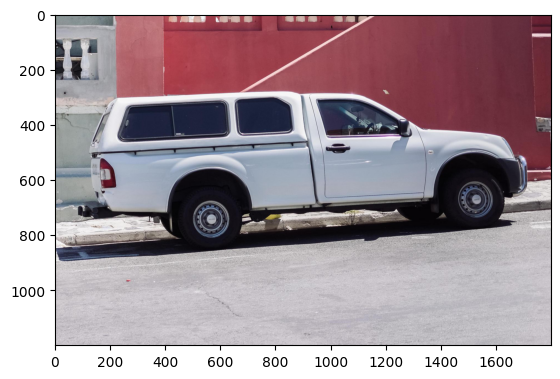

In [4]:
im2 = cv2.imread('images/truck.jpg')
im2 = cv2.cvtColor(im2, cv2.COLOR_RGB2BGR)
plt.imshow(im2)

In [11]:
im2.shape, im2.min(), im2.max(), im2.dtype

((1200, 1800, 3), 0, 255, dtype('uint8'))

In [11]:
sam_predictor.set_image(im2[:512, :512])

In [5]:
gtsam_model.sam_predictor.set_image(im2[:512, :512])

In [7]:
input_point = np.array([[510, 220]])
input_label = np.array([1])

In [16]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

In [8]:
input_box = gt_boxes[0]
# # transformed_boxes = input_box[None, :]
transformed_boxes = np.array([[input_box[1], input_box[0], input_box[3], input_box[2]]])
# with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
masks, scs, _ = gtsam_model.sam_predictor.predict(
    point_coords=None,
    point_labels=None,
    box=transformed_boxes,
    multimask_output=False,
)
# masks, scs, _ = sam_predictor.predict(
#     point_coords=input_point,
#     point_labels=input_label,
#     multimask_output=False,
# )

In [16]:
masks.shape

(1, 512, 512)

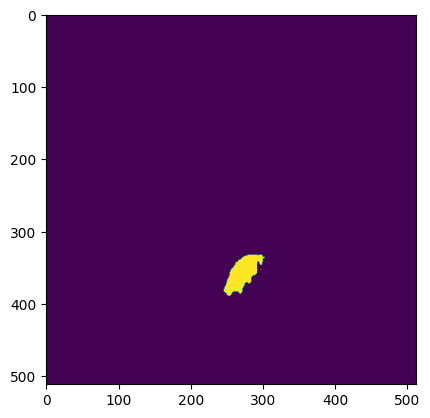

In [9]:
plt.imshow(masks[0])

In [48]:
contours_samos, boxes_samos, scores_samos = samos_model.set_threshold(0.7, predict_masks=True)

In [11]:
print(gt_boxes.shape, boxes_cellpose.shape, boxes_cellpose.shape, scores_cellpose, scores_cellpose, len(ds), type(boxes_cellpose))

(36, 4) (1, 4) (1, 4) [1.] [1.] 12 <class 'numpy.ndarray'>


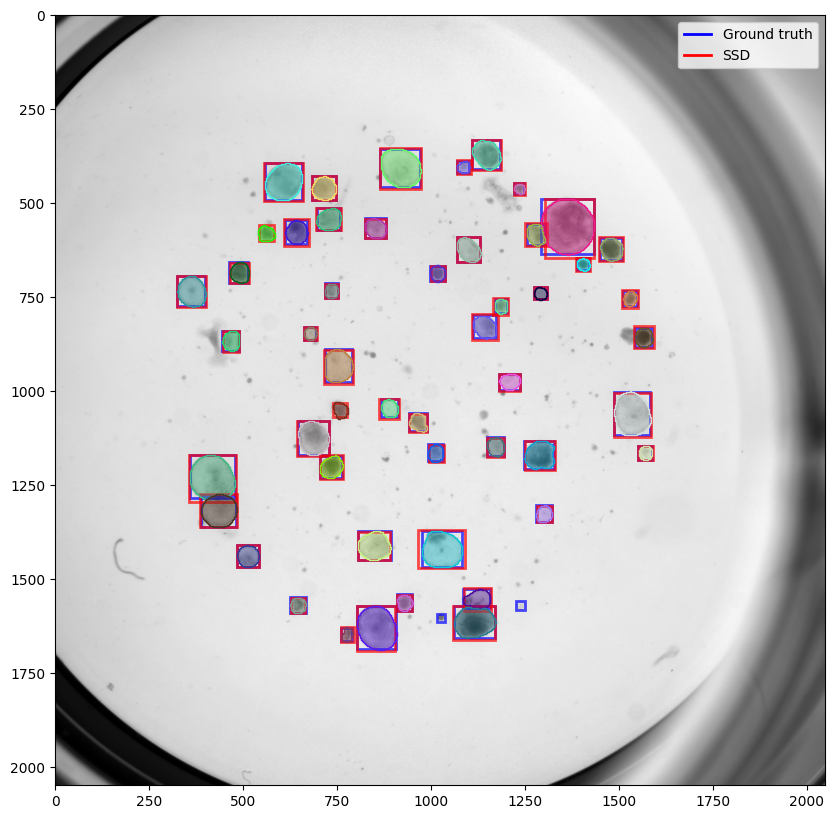

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_cellpose, format='yxyx_px', ax=ax, show_image=False, color='red')

# Plot mask predictions
for i in range(boxes_cellpose.shape[0]):
    show_mask(contours_cellpose[i], ax, random_color=True)

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_c = mlines.Line2D([], [], color='red', label='SSD', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_c])

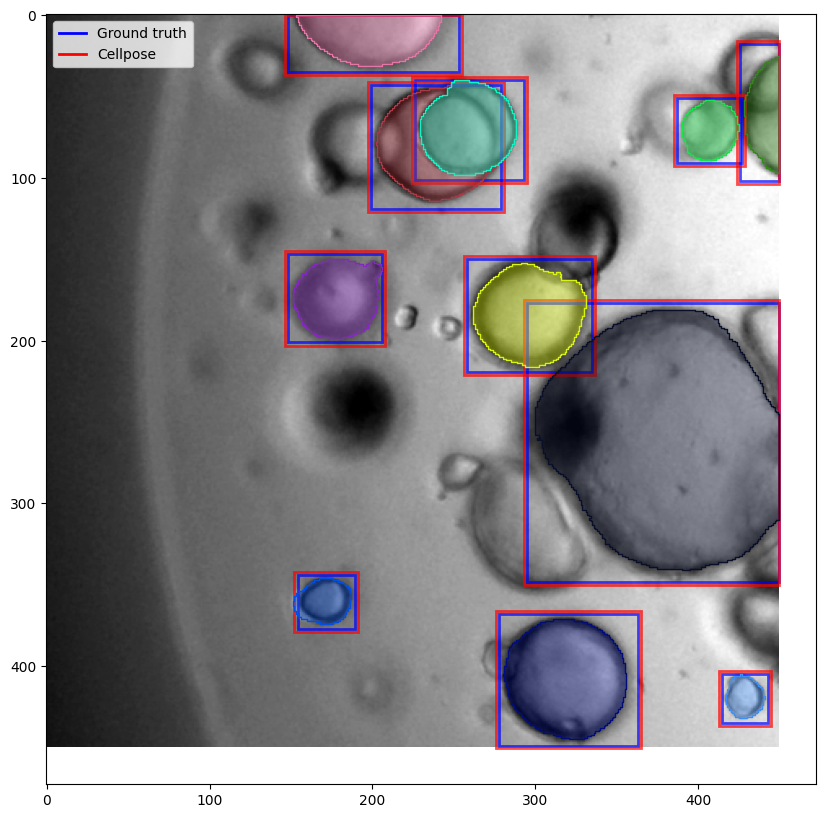

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_cellpose, format='yxyx_px', ax=ax, show_image=False, color='red')

# Plot mask predictions
for i in range(boxes_cellpose.shape[0]):
    show_mask(contours_cellpose[i], ax, random_color=True)

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_c = mlines.Line2D([], [], color='red', label='Cellpose', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_c])

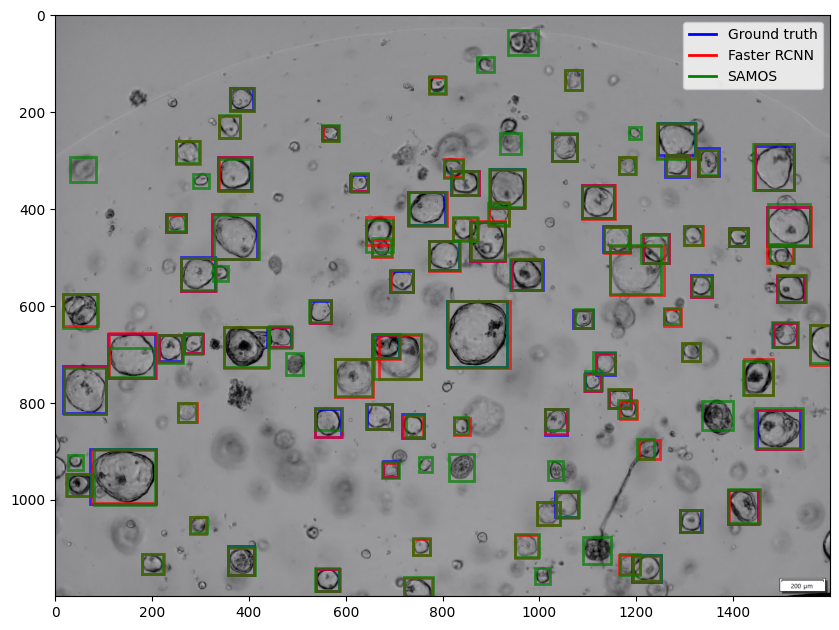

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_rcnn, format='yxyx_px', ax=ax, show_image=False, color='red')
plot_boxes(im, boxes_samos, format='yxyx_px', ax=ax, show_image=False, color='green')

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_b = mlines.Line2D([], [], color='red', label='Faster RCNN', linewidth=2)
line_c = mlines.Line2D([], [], color='green', label='SAMOS', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_b, line_c])

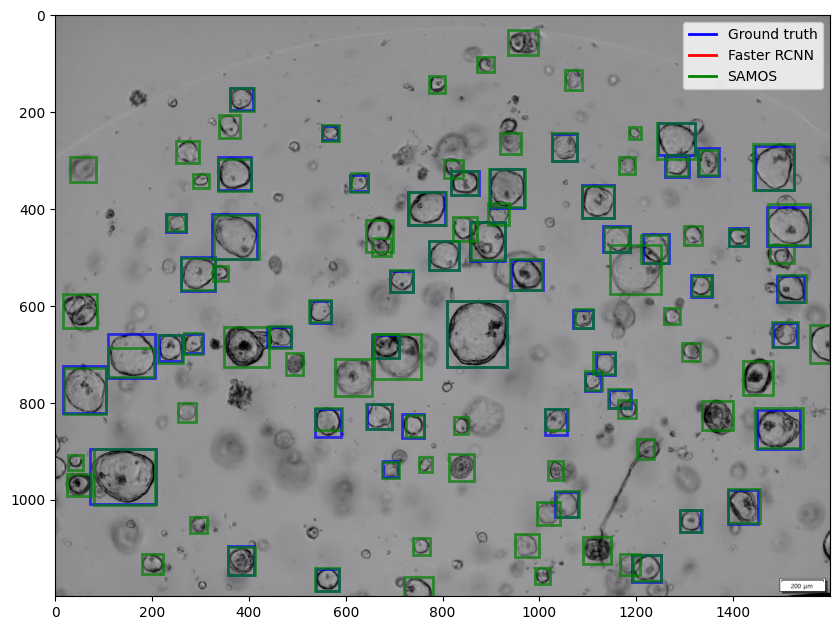

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
# plot_boxes(im, boxes_rcnn, format='yxyx_px', ax=ax, show_image=False, color='red')
plot_boxes(im, boxes_samos, format='yxyx_px', ax=ax, show_image=False, color='green')

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_b = mlines.Line2D([], [], color='red', label='Faster RCNN', linewidth=2)
line_c = mlines.Line2D([], [], color='green', label='SAMOS', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_b, line_c])

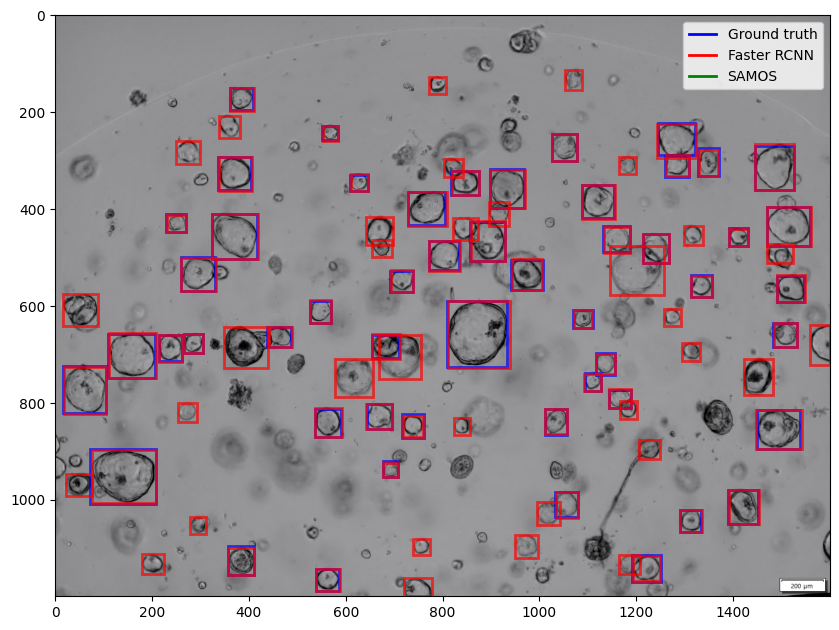

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_rcnn, format='yxyx_px', ax=ax, show_image=False, color='red')
# plot_boxes(im, boxes_samos, format='yxyx_px', ax=ax, show_image=False, color='green')

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_b = mlines.Line2D([], [], color='red', label='Faster RCNN', linewidth=2)
line_c = mlines.Line2D([], [], color='green', label='SAMOS', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_b, line_c])

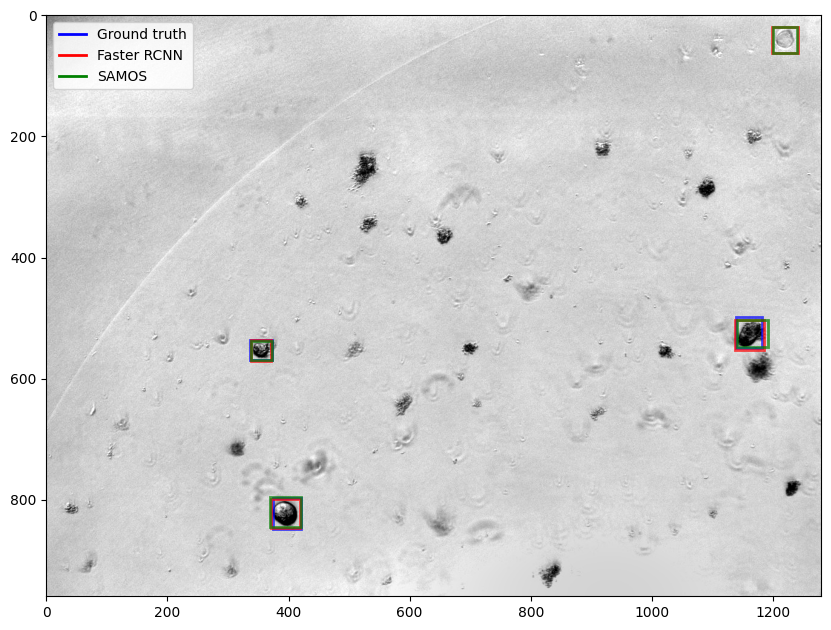

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=100)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes_rcnn, format='yxyx_px', ax=ax, show_image=False, color='red')
plot_boxes(im, boxes_samos, format='yxyx_px', ax=ax, show_image=False, color='green')

# Define custom line handles
line_a = mlines.Line2D([], [], color='blue', label='Ground truth', linewidth=2)
line_b = mlines.Line2D([], [], color='red', label='Faster RCNN', linewidth=2)
line_c = mlines.Line2D([], [], color='green', label='SAMOS', linewidth=2)

# Add legend with custom handles
plt.legend(handles=[line_a, line_b, line_c])

In [12]:
gt_masks = pp.convert_mask_to_binary(gt_mask)

In [17]:
# Segmentation metric implementation
iou_matrix = pp.compute_iou_matrix_segmentation_contours(contours_rcnn, gt_masks=gt_masks)
mAP_scores, haussdorf_scores, haussdorf_95_scores, masd_scores, assd_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_segmentation_all(
    iou_matrix, [0.5, 0.75, 0.9], scores_rcnn, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], gt_masks, contours_rcnn
)
mAP_scores, haussdorf_scores, haussdorf_95_scores

([0.9249772311573218, 0.8980636201770418, 0.14630684655199735],
 [4.087731369788056, 4.048613111738837, 3.9425111914758237],
 [3.3441004220818646, 3.304079551786715, 3.0675109268819343])

In [18]:
# Segmentation metric implementation
iou_matrix = pp.compute_iou_matrix_segmentation_contours(contours_samos, gt_masks=gt_masks)
mAP_scores, haussdorf_scores, haussdorf_95_scores, masd_scores, assd_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_segmentation_all(
    iou_matrix, [0.5, 0.75, 0.9], scores_samos, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], gt_masks, contours_samos
)
mAP_scores, haussdorf_scores, haussdorf_95_scores

([0.8243159170088088, 0.7488047301293386, 0.08847399758194362],
 [5.071001134159821, 4.4738411795262145, 3.9531785995137834],
 [4.261208691015424, 3.6906570386560418, 3.0142537208554363])

In [ ]:
# Own mAP implementation
iou_matrix = pp.compute_iou_matrix_detection(boxes_rcnn, gt_boxes)
mAP_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_detection_all(
    iou_matrix, [0.5, 0.75, 0.9], scores_rcnn, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
)
mAP_scores, f1_scores

([0.9170796485840113, 0.691717680388123, 0.06077839991920227],
 [0.8864864864864865,
  0.8864864864864865,
  0.8864864864864865,
  0.8864864864864865,
  0.8864864864864865,
  0.8756756756756756,
  0.8648648648648649,
  0.8540540540540539,
  0.8216216216216217])

In [52]:
# Own mAP implementation
iou_matrix = pp.compute_iou_matrix_detection(boxes_samos, gt_boxes)
mAP_scores, pq_scores, iou_scores, dice_scores, f1_scores, prec_scores, recall_scores = pp.compute_metrics_detection_all(
    iou_matrix, [0.5, 0.75, 0.9], scores_samos, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95]
)
mAP_scores, f1_scores

([0.8832957466886817, 0.6040942830834048, 0.02039117769454848],
 [0.8307692307692307,
  0.8307692307692307,
  0.8307692307692307,
  0.8307692307692307,
  0.8307692307692307,
  0.8307692307692307,
  0.8307692307692307,
  0.8205128205128206,
  0.7794871794871795,
  0.7282051282051282])

In [40]:
import torchmetrics.detection

mAP_metric = torchmetrics.detection.MeanAveragePrecision(class_metrics=True, extended_summary=False, backend='faster_coco_eval',)

In [41]:
mAP_metric.update(preds=[{'boxes': torch.from_numpy(boxes_rcnn), 
                          'scores': torch.from_numpy(scores_rcnn), 
                          'labels': torch.zeros(scores_rcnn.shape, dtype=torch.int)}], 
                  target=[{'boxes': torch.from_numpy(gt_boxes), 
                           'labels': torch.zeros((gt_boxes.shape[0],), dtype=torch.int)}])
res = mAP_metric.compute()
mAP_metric.reset()
res

{'map': tensor(0.5954),
 'map_50': tensor(0.9159),
 'map_75': tensor(0.6911),
 'map_small': tensor(0.1576),
 'map_medium': tensor(0.6360),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.0079),
 'mar_10': tensor(0.0865),
 'mar_100': tensor(0.6427),
 'mar_small': tensor(0.2125),
 'mar_medium': tensor(0.6852),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(0.5954),
 'mar_100_per_class': tensor(0.6427),
 'classes': tensor(0, dtype=torch.int32)}

In [42]:
mAP_metric.update(preds=[{'boxes': torch.from_numpy(boxes_samos), 
                          'scores': torch.from_numpy(scores_samos), 
                          'labels': torch.zeros(scores_samos.shape, dtype=torch.int)}], 
                  target=[{'boxes': torch.from_numpy(gt_boxes), 
                           'labels': torch.zeros((gt_boxes.shape[0],), dtype=torch.int)}])
res = mAP_metric.compute()
mAP_metric.reset()
res

{'map': tensor(0.5183),
 'map_50': tensor(0.8333),
 'map_75': tensor(0.5852),
 'map_small': tensor(0.1545),
 'map_medium': tensor(0.5566),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.0090),
 'mar_10': tensor(0.0843),
 'mar_100': tensor(0.5640),
 'mar_small': tensor(0.1500),
 'mar_medium': tensor(0.6049),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(0.5183),
 'mar_100_per_class': tensor(0.5640),
 'classes': tensor(0, dtype=torch.int32)}

In [38]:
iou_matrix = np.array([
    [0.3, 0.5, 0.1, 0.74, 0.0, 0.0],
    [0.3, 0.5, 0.1, 0.04, 0.0, 0.0],
    [0.9, 0.5, 0.6, 0.04, 0.2, 0.0],
    [0.9, 0.5, 0.1, 0.04, 0.0, 0.02],
    [0.95, 0.6, 0.0, 0.04, 0.0, 0.1],
])
scores = np.array([0.08, 0.61, 0.33, 0.59, 0.97])

In [39]:
compute_metrics_detection_all(iou_matrix, [0.5, 0.75, 0.9], scores, thresholds=[0.1, 0.5, 0.9])

is_true_match [ True  True False  True  True]
ap 0.6
is_true_match [ True False False False False]
ap 0.16666666666666666
is_true_match [ True False False False False]
ap 0.16666666666666666
cost_matrix [[-0.95 -0.6  -0.   -0.04 -0.   -0.1 ]
 [-0.3  -0.5  -0.1  -0.04 -0.   -0.  ]
 [-0.9  -0.5  -0.1  -0.04 -0.   -0.02]
 [-0.9  -0.5  -0.6  -0.04 -0.2  -0.  ]]
row_ind, col_ind [0 1 2 3] [1 3 0 2]
matched_ious [0.6  0.04 0.9  0.6 ]
tp_ious [0.6 0.9 0.6]
tp 3
fp 2
fn 3
cost_matrix [[-0.95 -0.6  -0.   -0.04 -0.   -0.1 ]
 [-0.3  -0.5  -0.1  -0.04 -0.   -0.  ]
 [-0.9  -0.5  -0.1  -0.04 -0.   -0.02]]
row_ind, col_ind [0 1 2] [1 2 0]
matched_ious [0.6 0.1 0.9]
tp_ious [0.6 0.9]
tp 2
fp 3
fn 4
cost_matrix [[-0.95 -0.6  -0.   -0.04 -0.   -0.1 ]]
row_ind, col_ind [0] [0]
matched_ious [0.95]
tp_ious [0.95]
tp 1
fp 4
fn 5


([0.6, 0.16666666666666666, 0.16666666666666666],
 [0.0, 0.0, 0.0],
 [0.7000000000000001, 0.75, 0.95],
 [0.8157894736842105, 0.8486842105263157, 0.9743589743589743],
 [0.5454545454545454, 0.3636363636363636, 0.1818181818181818],
 [0.6, 0.4, 0.2],
 [0.5, 0.3333333333333333, 0.16666666666666666])

In [54]:
ds = dl.OrgaExtractor(split='test')

idx = 7
im, gt_mask, gt_boxes, im_path, im_ID = ds[idx]
# im, flatfield = dl.normalize(im)
print(im.shape)
im = (im / im.max() * 255).astype(np.uint8)
# im = np.stack((im, im, im), axis=2)
im = Image.fromarray(im).convert('RGB')
im = transforms(im)

(1200, 1600, 3)


In [18]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model_last = SSD.load_from_checkpoint('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200-last_epoch=799-val_loss=17.95.ckpt')
model_best = SSD.load_from_checkpoint('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200-best_epoch=49-val_loss=3.79.ckpt')

model_last.to(device)
model_best.to(device)

SSD(
  (model): SSD(
    (backbone): SSDFeatureExtractorVGG(
      (features): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
        (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (6): ReLU(inplace=True)
        (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (8): ReLU(inplace=True)
        (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (11): ReLU(inplace=True)
        (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (13): ReLU(inplace=True)
        (14): Conv2d(256, 256, kernel_size=(3, 3), stride

In [35]:
model_last.eval()
model_best.eval()
image = image.to(device)

with torch.inference_mode():
    output = model_last([image])
    # output = model_best([image])
output

{'pred_scores': tensor([1.0000, 0.9228, 0.6150, 0.2914], device='cuda:0'),
 'pred_boxes': tensor([[ 11.6078, 352.3887,  52.4829, 389.7431],
         [340.7168, 230.9342, 374.5117, 266.2815],
         [225.4310,  54.4283, 268.1337,  97.1424],
         [290.3765, 304.6036, 326.0614, 343.8856]], device='cuda:0')}

In [36]:
boxes = output['pred_boxes'].cpu().numpy()
# xyxy to yxyx
boxes = np.stack((boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]), axis=1)
scores = output['pred_scores'].cpu().numpy()
boxes

array([[352.3887  ,  11.607782, 389.7431  ,  52.482933],
       [230.93425 , 340.71677 , 266.28152 , 374.51175 ],
       [ 54.42835 , 225.431   ,  97.14239 , 268.13367 ],
       [304.60358 , 290.3765  , 343.8856  , 326.0614  ]], dtype=float32)

In [37]:
filtered_boxes = boxes[scores > 0.5]

In [ ]:
im = image.cpu().numpy().transpose((1, 2, 0))

fig, ax = plt.subplots(1, 1, figsize=(12*4, 12*4), dpi=200)
# plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, filtered_boxes, format='yxyx_px', ax=ax, show_image=True, color='red')

## Full image patched predictions

In [3]:
# ssd_last = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200-last_epoch=799-val_loss=17.95.ckpt')
# ssd_best = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_full_data_True_32_200-best_epoch=49-val_loss=3.79.ckpt')

/home/icb/lion.gleiter/projects/organoid_sam/segment-anything/segment-anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = 

In [3]:
ssd_full_best = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_full_data_09012025_True_32_200/SSD_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_full_data_09012025_True_32_200-best_epoch=274-val_loss=2.81.ckpt')
ssd_multiorg_best = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_multiorg_data_09012025_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_multiorg_data_09012025_True_32_200-best_epoch=174-val_loss=3.30.ckpt')

/home/icb/lion.gleiter/projects/organoid_sam/segment-anything/segment-anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = 

In [3]:
ssd_full_last = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_full_data_09012025_True_32_200/SSD_OrganoID_train_MultiOrg_train_macros_MultiOrg_train_normal_OrgaExtractor_train_OrgaQuant_train_OrgaSegment_train_Tellu_train_NewData_train_full_data_09012025_True_32_200-last_epoch=799-val_loss=2.85.ckpt')
# ssd_multiorg_last = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_multiorg_data_09012025_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_multiorg_data_09012025_True_32_200-last_epoch=799-val_loss=3.44.ckpt')

ssd_multiorg_last_multiscale = SSDPredictor('/ictstr01/groups/shared/users/lion.gleiter/organoid_sam/checkpoints_trained/SSD/SSD_MultiOrg_train_macros_MultiOrg_train_normal_multiorg_with_090_overlap_True_32_200/SSD_MultiOrg_train_macros_MultiOrg_train_normal_multiorg_with_090_overlap_True_32_200-last_epoch=799-val_loss=3.13.ckpt')


/home/icb/lion.gleiter/projects/organoid_sam/segment-anything/segment-anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = 

In [4]:
ds = dl.MultiOrg(split='test_normal')

idx = 0
im, gt_mask, gt_boxes, im_path, im_ID = ds[idx]
# im, flatfield = dl.normalize(im)
im = (im / im.max() * 255).astype(np.uint8)
im = np.stack((im, im, im), axis=2)

In [5]:
im.shape

(6240, 6940, 3)

In [ ]:
# contours, boxes, scores = ssd_full_best.forward(im, patch_size=(350, 1024), predict_masks=True, min_diameter=30/1.29)
contours, boxes, scores = ssd_full_best.forward(im, patch_size=3000, predict_masks=True, min_diameter=30/1.29)

predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([167, 4])
patch 0
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 1
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([169, 4])
patch 2
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 3
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([166, 4])
patch 4
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([162, 4])
patch 5
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([169, 4])
patch 6
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([164, 4])
patch 7
predict_boxes image.shape (3000, 3000, 3)
transformed_boxes.shape torch.Size([162, 4])


In [15]:
contours, boxes, scores = ssd_full_best.set_threshold(0.3, predict_masks=True)
print(scores)

[1.         0.99999988 0.99999988 0.99999976 0.99999797 0.99999607
 0.99999487 0.99999428 0.99999225 0.99997783 0.99996412 0.99996042
 0.99994969 0.99985611 0.99985099 0.99980336 0.99969494 0.99932122
 0.99926668 0.99855667 0.99846625 0.99811172 0.99751353 0.99720436
 0.99601609 0.99551219 0.99523783 0.99205011 0.98083329 0.97840607
 0.97013342 0.9689396  0.95700544 0.9349826  0.93196398 0.9223243
 0.91390014 0.86110312 0.84573722 0.83187973 0.82218403 0.81311071
 0.81228423 0.79938006 0.7842108  0.77655768 0.74996358 0.74563563
 0.72631687 0.63502741 0.6205768  0.61465025 0.57966256 0.579436
 0.54960358 0.54600894 0.53404206 0.50812072 0.49403211 0.49240822
 0.48420301 0.47576657 0.46808451 0.46325746 0.44200799 0.43589824
 0.43154091 0.38332582 0.38126099 0.3779268  0.37292609 0.3593221
 0.35728246 0.35703686 0.35399228 0.35344833 0.31938463 0.30854324
 0.30770457 0.30015725]


In [ ]:
boxes.shape, gt_boxes.shape

((80, 4), (176, 4))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12*2, 12*2), dpi=200)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes, format='yxyx_px', ax=ax, show_image=False, color='red')

In [16]:
contours, boxes, scores = ssd_multiorg_best.forward(im, patch_size=(350, 1024), predict_masks=True, min_diameter=30/1.29)

predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])


patch 0
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 1
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 2
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 3
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 4
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 5
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 6
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 7
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 8
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 9
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([200, 4])
patch 10
predict_boxes image.shape (350, 350, 3)
transformed_boxes.sha

In [23]:
contours, boxes, scores = ssd_multiorg_best.set_threshold(0.2, predict_masks=True)

In [24]:
boxes.shape, gt_boxes.shape

((230, 4), (176, 4))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12*2, 12*2), dpi=200)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes, format='yxyx_px', ax=ax, show_image=False, color='red')

### last

In [6]:
contours, boxes, scores = ssd_full_last.forward(im, patch_size=(350, 1024, 2048, 4096), predict_masks=True, min_diameter=30/1.29)

predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 0
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 1
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 2
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 3
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 4
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 5
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 6
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 7
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 8
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([170, 4])
patch 9
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.

In [7]:
contours, boxes, scores = ssd_full_last.set_threshold(0.3, predict_masks=True)
print(scores)

[1.         1.         1.         1.         1.         1.
 1.         1.         1.         0.99999988 0.99999988 0.99999964
 0.9999994  0.99999917 0.99999917 0.99999857 0.99999487 0.99999321
 0.99999261 0.99999201 0.99998224 0.9999609  0.99995029 0.99994707
 0.99994671 0.99994195 0.99994135 0.99992633 0.99990666 0.99990499
 0.99977595 0.9996525  0.99951732 0.99941826 0.99895334 0.99878985
 0.99859864 0.99763405 0.99684542 0.99591941 0.99358046 0.99348676
 0.99337924 0.99295747 0.99272352 0.99021405 0.98803467 0.9864369
 0.98623788 0.98292589 0.97742772 0.97482163 0.9736163  0.97074878
 0.96758491 0.96671093 0.96151733 0.95411026 0.94062769 0.93814886
 0.92760217 0.92262584 0.91377598 0.90502715 0.88616854 0.86707819
 0.85889691 0.82371336 0.81339896 0.80852675 0.79257989 0.77879989
 0.77093238 0.76466757 0.7629419  0.73777378 0.72944111 0.71849954
 0.70655751 0.69590759 0.68435884 0.6667307  0.64917505 0.6428057
 0.64250422 0.64229578 0.63909179 0.63600987 0.61843455 0.6003738
 0.589

In [8]:
boxes.shape, gt_boxes.shape

((138, 4), (176, 4))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12*2, 12*2), dpi=200)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes, format='yxyx_px', ax=ax, show_image=False, color='red')

In [11]:
contours, boxes, scores = ssd_multiorg_last.forward(im, patch_size=(350, 1024), predict_masks=True, min_diameter=30/1.29)

predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 0
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])


patch 1
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 2
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 3
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 4
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 5
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 6
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 7
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 8
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 9
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 10
predict_boxes image.shape (350, 350, 3)
transformed_boxes.shape torch.Size([160, 4])
patch 11
predict_boxes image.shape (350, 350, 3)
transformed_boxes.sh

In [21]:
contours, boxes, scores = ssd_multiorg_last.set_threshold(0.5, predict_masks=True)

In [22]:
boxes.shape, gt_boxes.shape

((85, 4), (176, 4))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12*2, 12*2), dpi=200)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes, format='yxyx_px', ax=ax, show_image=False, color='red')

Multiscale training with > 0.9 overlap

In [20]:
# contours, boxes, scores = ssd_full_best.forward(im, patch_size=(350, 1024), predict_masks=True, min_diameter=30/1.29)
contours, boxes, scores = ssd_multiorg_last_multiscale.forward(im, patch_size=(512, 2048), predict_masks=True, min_diameter=30/1.29)

predict_boxes image.shape (512, 512, 3)


transformed_boxes.shape torch.Size([102, 4])
patch 0
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 1
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 2
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 3
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 4
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 5
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 6
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 7
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 8
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 9
predict_boxes image.shape (512, 512, 3)
transformed_boxes.shape torch.Size([102, 4])
patch 10
predict_boxes im

In [21]:
contours, boxes, scores = ssd_multiorg_last_multiscale.set_threshold(0.2, predict_masks=True)
print(scores)

[0.99993074 0.99975067 0.9996599  0.99962449 0.99954283 0.99952006
 0.99948055 0.99926883 0.99920779 0.99900407 0.99876714 0.99819404
 0.99698323 0.99663842 0.99622846 0.99473298 0.99427718 0.99025434
 0.98884064 0.98818249 0.98783827 0.98548156 0.98415947 0.9800337
 0.97540534 0.97466362 0.97440058 0.97069442 0.96738005 0.96686065
 0.96209109 0.95618409 0.94792861 0.94407165 0.94340944 0.93130118
 0.9235636  0.91748995 0.91351187 0.90499991 0.90070653 0.89924455
 0.89075124 0.86891329 0.86695921 0.84105492 0.83506143 0.82969105
 0.82334405 0.82194817 0.80887204 0.74606252 0.74224138 0.72918588
 0.72456622 0.72400069 0.71979022 0.71829969 0.70477057 0.69807905
 0.69752133 0.69025379 0.67531663 0.6719588  0.64987749 0.63869476
 0.62774575 0.59901369 0.57982659 0.57726473 0.55560368 0.54559636
 0.5354588  0.51658624 0.51557213 0.51289439 0.5089218  0.49978268
 0.49553049 0.47711989 0.46545178 0.43933541 0.42228264 0.41938457
 0.40887669 0.40780407 0.39914876 0.39763007 0.38808149 0.38662

In [22]:
boxes.shape, gt_boxes.shape

((130, 4), (176, 4))

In [ ]:
# (512, 2048)
fig, ax = plt.subplots(1, 1, figsize=(12*2, 12*2), dpi=200)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes, format='yxyx_px', ax=ax, show_image=False, color='red')

In [ ]:
# (512, 1024, 2048, 4096)
fig, ax = plt.subplots(1, 1, figsize=(12*2, 12*2), dpi=200)
plot_boxes(im, gt_boxes, format='yxyx_px', ax=ax, color='blue')
plot_boxes(im, boxes, format='yxyx_px', ax=ax, show_image=False, color='red')

In [24]:
!python --version

Python 3.11.5


In [29]:
import sys
sys.version_info

sys.version_info(major=3, minor=11, micro=5, releaselevel='final', serial=0)